In [2]:
%matplotlib inline

import sys
from urllib.request import urlretrieve
import zipfile
from dateutil.parser import parse
import json
from random import shuffle
import random
from datetime import timedelta, datetime
import os
import re
import boto3
import s3fs
import sagemaker
from sagemaker import get_execution_role
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from ipywidgets import IntSlider, FloatSlider, Checkbox

In [3]:
mood = pd.read_csv('./moods2019q3.csv')

## Basic Data Cleaning
mood['created_at'] = pd.to_datetime(mood['created_at'])
mood['Date'] = pd.to_datetime(mood['created_at']).dt.date
mood['Hour'] =  pd.to_datetime(mood['created_at']).dt.hour
mood['Days of Week'] = pd.to_datetime(mood['created_at']).dt.dayofweek #0 for monday and 6 for sunday
mood.set_index('created_at', inplace=True,drop=True)
mood.index.names = ['time']

In [4]:
mood.drop(mood.columns[[0,1,5,7,9,10,11]], axis = 1, inplace =True)

In [5]:
mood.reset_index(inplace=True)

In [6]:
mood.sort_values(by='time', inplace = True)
mood.reset_index(drop = True, inplace=True)

In [7]:
mood

,time,mood,magnitude,score,team_name,channel_name,Date,Hour,Days of Week
0,2018-06-18 09:43:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0
1,2018-06-18 09:44:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0
2,2018-06-18 09:44:00,sad,0.9,-0.9,Nekki,NaN,2018-06-18,9,0
3,2018-06-18 09:47:00,neutral,0.1,0.1,Ninjas,NaN,2018-06-18,9,0
4,2018-06-18 09:53:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0
5,2018-06-18 13:25:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0
6,2018-06-18 13:25:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0
7,2018-06-18 13:26:00,happy,0.9,0.4,Nekki,party,2018-06-18,13,0
8,2018-06-18 13:26:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0
9,2018-06-18 20:08:00,happy,0.8,0.8,Nekki,party,2018-06-18,20,0


## Preparing

In [8]:
sagemaker_session = sagemaker.Session()
region = sagemaker_session.boto_region_name  

role = get_execution_role() #what is this?
#the container image to be used for the region that we are running in
from sagemaker.amazon.amazon_estimator import get_image_uri
image_name = get_image_uri(boto3.Session().region_name, 'forecasting-deepar') #what is this image?

bucket = 'slackprediction'
#data_key = 'slack_moods2.csv'
data_key = 'Moodbit1/Teams4.csv'

#data_location = 's3://{}/{}'.format(bucket, data_key)
data_path = "s3://{}".format(bucket)
output_path = "s3://{}/output".format(bucket)
#data_location

## Preparing Data

In [9]:
sum(pd.isna(mood['team_name'])) 

0

no missing values in team name. Use it as cat

In [10]:
# create team name category in 0-based sequence
team_cat = pd.DataFrame(mood['team_name'].value_counts())
team_cat.reset_index(inplace = True)
team_cat.reset_index(inplace = True)
team_cat.drop(['team_name'], axis=1, inplace=True)
team_cat.columns = ['team_cat', 'team_name']

In [11]:
# added back into main df
mood = pd.merge(mood, team_cat, how='outer', on='team_name')

In [12]:
mood.columns=['Time', 'Mood', 'Magnitude','Score','Team_name', 'Channel_name', 'Date','Hour', 'Days of Week', 'team_cat']

In [13]:
mood

,Time,Mood,Magnitude,Score,Team_name,Channel_name,Date,Hour,Days of Week,team_cat
0,2018-06-18 09:43:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0,14
1,2018-06-18 09:44:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0,14
2,2018-06-18 09:44:00,sad,0.9,-0.9,Nekki,NaN,2018-06-18,9,0,14
3,2018-06-18 09:53:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,9,0,14
4,2018-06-18 13:25:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0,14
5,2018-06-18 13:25:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0,14
6,2018-06-18 13:26:00,happy,0.9,0.4,Nekki,party,2018-06-18,13,0,14
7,2018-06-18 13:26:00,neutral,0.0,0.0,Nekki,NaN,2018-06-18,13,0,14
8,2018-06-18 20:08:00,happy,0.8,0.8,Nekki,party,2018-06-18,20,0,14
9,2018-06-18 20:08:00,happy,0.8,0.8,Nekki,party,2018-06-18,20,0,14


In [96]:
team_cat_dict = team_cat.set_index('team_name').to_dict()
#team_cat_dict

Now we organizing data into multiple time series

In [49]:
#constants for organize data
MINUTE_INTERVAL = 60 #in minute, will measure the avaerage score for each time interval
GROUP_BY = 'Team_name' #Or ''User_id', depends on whether investigating one person's behavior or team's behavior
MAX_GAPS = 20 #The missing value will be less and equal to this amount.
SPLIT_RATIO = 0.9 #divide train and test data set

#constants for train & test
freq = 'H' #frequency for the time series: one of H, M, D, W, min
prediction_length = 3 #
context_length = 3  #the number of state updates accomplished before making predictions

In [50]:
def id_info_dict_entry_initialize(d,row,GROUP_BY, VERBOSE = False):
    start_time = get_start_time(row['Time'], MINUTE_INTERVAL)
    if VERBOSE:
        print("\nInitializing the " + GROUP_BY + ":")
    d[row[GROUP_BY]] = {GROUP_BY:row[GROUP_BY],'TeamName':row['Team_name'],'StartTime':str(start_time), 'NMissing':0,'ScoreList':[],'TempScores':[]} 
    #d[row[GROUP_BY]] = {GROUP_BY:row[GROUP_BY],'TeamName':row['Team_name'],'StartTime':str(start_time), 'NMissing':0,'ScoreList':[],'TempScores':[row['Score']]} 
    if VERBOSE:    
        print(d[row[GROUP_BY]])
    
def add_to_new_df(df_rows_list,entry, VERBOSE = False):
    #d = {GROUP_BY:entry[GROUP_BY],'TeamName':entry['TeamName'],'start':entry['StartTime'],'target':entry['ScoreList']}
    d = {"start":entry['StartTime'],"target":entry['ScoreList'], 'Team_name':entry['Team_name']}
    df_rows_list.append(d)
    if VERBOSE:
        print("Row finished. Append to df: ")
        print(d)
        print("\n")
    
def wrap_to_score(entry, VERBOSE = False):
    #Warp the previous time interval 'TempScores'
    if len(entry['TempScores']) == 0:
        return
    
    avg = sum(entry['TempScores']) / float(len(entry['TempScores']))
    avg = float("{:.3f}".format(avg)) #round to 3
    
    if VERBOSE:
        print("Previous time interval finished. Scores of the previous interval are:")
        print(entry['TempScores']) 
        print("Getting a average of " + str(avg) + " and append to ScoreList")
        
    entry['ScoreList'].append(avg)
    entry['TempScores'] = []

def get_start_time(t,MINUTE_INTERVAL):
    """
    Custom start time here
    """ 
    s = datetime.strptime(str(t),'%Y-%m-%d %H:%M:%S')
    if MINUTE_INTERVAL == 60*24:  #interval by one day, then it's the start of the day
        s = datetime(s.year, s.month, s.day)
    elif MINUTE_INTERVAL == 60:  #interval by every 1 hour, then it's the starting hour
        s = datetime(s.year, s.month, s.day, s.hour)
    elif MINUTE_INTERVAL == 30:  #interval by every 30 minutes, then it's the starting hour or half hour
        if s.minute < 30:
            s = datetime(s.year, s.month, s.day, s.hour)
        else:
            s = datetime(s.year, s.month, s.day, s.hour, 30)
    return s


def id_info_dict_entry_insert(d,row,df_rows_list, MINUTE_INTERVAL, VERBOSE = False):
    entry = d[row[GROUP_BY]]    
    time_data_list_new = []
    

    #calculate number of missing scores. 
    start_time = get_start_time(entry['StartTime'], MINUTE_INTERVAL)
    last_time = start_time + timedelta(minutes=MINUTE_INTERVAL)*(len(entry['ScoreList'])+1)
    current_time = row['Time']
    n_missing_new = int((current_time - last_time) / timedelta(minutes=MINUTE_INTERVAL))
    
    #Check if the current message is not within the previous time interval
    if current_time > last_time:
        #if VERBOSE:
            #print("\nFound " + str(n_missing_new) + " intervals missing value between the last time interval finished at " + strftime(last_time) + " and the current message at " + row['Time'] + ".")
        
        wrap_to_score(entry,VERBOSE = VERBOSE)    
        
        if n_missing_new > 0:
            #Check if number of missings are above limit
            if entry['NMissing'] + n_missing_new <= MAX_GAPS:  #continue to add current message to ScoreList 
                if VERBOSE:
                    print("MAX_GAPS limit not reached. Added " + str(n_missing_new) + " missing scores to ScoreList.")
                
                for i in range(n_missing_new):  
                    entry['ScoreList'].append("NaN") #add "NaN"s to 'ScoreList'  first
                entry['NMissing'] = entry['NMissing'] + n_missing_new
            
                if VERBOSE:
                    print("Now we have " + str(entry['NMissing']) + " missing scores in the ScoreList.")
            else:   #the sequence is over 
                if VERBOSE:
                    print("Number of missing scores reached limit. ")            
                    add_to_new_df(df_rows_list,entry,VERBOSE = VERBOSE) 
                    id_info_dict_entry_initialize(d,row,GROUP_BY,VERBOSE = VERBOSE)

    
    d[row[GROUP_BY]]['TempScores'].append(row['Score'])
        

def get_time_series_limited_by_gaps(df,GROUP_BY = 'Channel_id',MINUTE_INTERVAL = 60, MAX_GAPS = 10,VERBOSE = False):
    """
    Use this method when the majority of data are gaps. 
    
    This will make sure that each data sequence start and end with a value.
    The number of gaps in the sequence is less than MAX_GAPS
    """
    position = 0 #current position in df 
    id_info_dict = {} #collect data for each GROUP_BY, calculate average within time_interval and add to list, before number of gaps reached MAX_GAPS
    df_rows_list = []
    
    print("Reading the dataset")
    #read all dataset
    for index, row in df.iterrows():
        if row[GROUP_BY] not in id_info_dict:
            id_info_dict_entry_initialize(id_info_dict,row,GROUP_BY,VERBOSE = VERBOSE)
        id_info_dict_entry_insert(id_info_dict,row,df_rows_list, MINUTE_INTERVAL,VERBOSE = VERBOSE)
        
        #position = position + 1
        #if position > 20:
        #    break
    
    print("Dataset finished. Wrap up the rest in the dictionary")
    #wrap the dictionary
    for key, info in id_info_dict.items():
        #Warp the previous time interval 'TempScores'
        if len(info['TempScores']) > 0:
            wrap_to_score(info,VERBOSE = VERBOSE)
            add_to_new_df(df_rows_list,info,VERBOSE = VERBOSE)
        
    return df_rows_list

In [51]:

all_data = get_time_series_limited_by_gaps(mood,GROUP_BY = 'Team_name',MINUTE_INTERVAL = MINUTE_INTERVAL, MAX_GAPS = MAX_GAPS,VERBOSE = True)



Reading the dataset

Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2018-06-18 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.9, 0.0]
Getting a average of -0.225 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, 0.8]
Getting a average of 0.8 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-06-18 09:00:00', 'target': [-0.225, 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'N

Row finished. Append to df: 
{'start': '2018-08-10 14:00:00', 'target': [0.05, 0.24, 0.0, 'NaN', 'NaN', 'NaN', 0.246], 'Team_name': 'Nekki'}



Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2018-08-12 01:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-08-12 01:00:00', 'target': [0.0], 'Team_name': 'Nekki'}



Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2018-08-15 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.6, 0.6, 0.0, -0.1, 0.7, 0.2]
Getting a average of 0.371 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and a

{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2018-10-31 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.0]
Getting a average of -0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interv

Getting a average of 0.21 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, 0.2, -0.4, 0.2, 0.0, -0.5, 0.0, 0.0, -0.1, 0.1, 0.5, 0.0, 0.8, 0.2, 0.3, 0.0, 0.0, 0.3, 0.0, 0.0, 0.1, 0.1, -0.1, 0.5, 0.4, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, 0.0, 0.0, -0.2, 0.4, -0.1, 0.0, 0.0, 0.0]
Getting a average of 0.09 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.1, 0.1, 0.5, 0.0]
Getting a average of 0.217 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.1, 0.1, 0.1, 0.0, 0.1, 0.0, 0.0, 0.2, 0.1, -0.1, 0.0, 0.0, 0.0, 0.1, 0.3, 0.0, 0.3, 0.0, 0.0, 0.0, 0.1, 0.1, 0.3, 0.1, 0.1, 0.2, 0.0, 0.0, -0.1, 0.1, 0.4]
Getting a average of 0.076 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5,

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.7, 0.3, 0.0, 0.3, 0.0, -0.1, 0.0, 0.0, 0.0, 0.2, 0.3, -0.1, -0.9, 0.0, 0.1, 0.1, -0.1, 0.0, 0.7, -0.2, 0.0, 0.1, 0.3, -0.2, 0.0, -0.6, 0.2, -0.5, 0.1, 0.0, -0.5, 0.0, 0.0, -0.1, 0.0, 0.1, 0.0, 0.2, 0.1, 0.2, 0.1]
Getting a average of 0.019 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-18 18:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.3, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.05, 0.019, 'NaN', 'NaN', 0.1], 'Team_name': 'Nekki'}



Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime

Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2019-02-06 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, -0.3, 0.6]
Getting a average of 0.025 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-06 20:00:00', 'target': [0.025], 'Team_name': 'Nekki'}



Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2019-02-11 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1, 0.0, 0.2, -0.3]
Getting a average of 0.18 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1, 0.0, 0.4, 0.0, 0.4]
Getting a average of 0.283 and ap

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.9, -0.1, 0.0, 0.4, 0.2, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9, 0.2, 0.2, 0.9, 0.2]
Getting a average of 0.195 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.7, 0.2, 0.0, -0.1, 0.3, -0.3]
Getting a average of 0.186 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.0, 0.0, 0.5, 0.3, 0.0, 0.3, 0.1, 0.1, 0.0, 0.0, -0.3, 0.2, 0.1, 0.3, 0.1, 0.1, 0.2, 0.0, 0.4, 0.3, 0.0, -0.5, 0.5, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, 0.3, 0.1, -0.2, 0.0, 0.0, -0.5, 0.4]
Getting a average of 0.071 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.6, 0.2, 0.2, -0.2, 0.7, 0.7, 0.5]
Getting a average of 0.375 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.7, 0.0, 0.2, 0.3, 0.0]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, -0.3, -0.6]
Getting a average of -0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.1, -0.8, -0.4, 0.0, 0.0, 0.0, -0.1, -0.1, 0.0, -0.1, 0.0, -0.1, 0.6, 0.7, 0.0, 0.3, 0.2, 0.3, 0.1, 0

Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.5]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.1, 0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval a




Initializing the Team_name:
{'Team_name': 'Nekki', 'TeamName': 'Nekki', 'StartTime': '2019-05-19 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 20 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.7]
Getting a average of 0.75 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-19 15:00:00', 'target': [0.7, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.75, 0.1], 'Team_name': 'Nekki'}



Initializing the Team_name:
{'Team_name': 'Nekki

{'start': '2018-11-19 22:00:00', 'target': [0.0], 'Team_name': "Jake's Jazz ?"}



Initializing the Team_name:
{'Team_name': "Jake's Jazz ?", 'TeamName': "Jake's Jazz ?", 'StartTime': '2018-11-20 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-20 21:00:00', 'target': [0.0], 'Team_name': "Jake's Jazz ?"}



Initializing the Team_name:
{'Team_name': "Jake's Jazz ?", 'TeamName': "Jake's Jazz ?", 'StartTime': '2018-11-22 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-22 19:00:00', 'target': [0.0], 'Team_name': "Jake's Jazz ?"}



Initializing 




Initializing the Team_name:
{'Team_name': 'Research Methods', 'TeamName': 'Research Methods', 'StartTime': '2018-09-21 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.4, 0.4]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-09-21 19:00:00', 'target': [0.3], 'Team_name': 'Research Methods'}



Initializing the Team_name:
{'Team_name': 'Research Methods', 'TeamName': 'Research Methods', 'StartTime': '2018-09-22 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.3, 0.2]
Getting a average of 0.275 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4, 0.4]
G

{'Team_name': 'INX Connect', 'TeamName': 'INX Connect', 'StartTime': '2018-09-07 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.8, 0.8, 0.2, -0.4, 0.0, 0.1, 0.8]
Getting a average of 0.26 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.2, 0.7, 0.1]
Getting a average of 0.34 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous 

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.0, 0.7, 0.0, 0.1, 0.7, 0.5, 0.0, -0.3, -0.1, -0.7, 0.2, 0.4, -0.3, 0.1, -0.2, -0.4, 0.4]
Getting a average of 0.07 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.2, 0.0, 0.0, 0.3, -0.2, -0.1, 0.1, -0.1, -0.1, 0.1, 0.0, 0.0, 0.3, 0.3, 0.1, 0.1, 0.0, 0.1, 0.2, 0.0, 0.3, -0.1, 0.3]
Getting a average of 0.075 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-23 08:00:00', 'target': [0.067, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.35, 'NaN

Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.1, 0.0]
Getting a average of 0.25 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-26 07:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', -0.1, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.064, 0.467, 0.164, 'NaN', 'NaN', 0.2, 0.2, 'NaN', 'NaN', 0.25], 'Team_name': 'INX Connect'}



Initializing the Team_name:
{'Team_name': 'INX Connect', 'TeamName': 'INX Connect', 'StartTime': '2018-11-27 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Gettin

Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.1, -0.5, -0.1, -0.6, 0.0, 0.2, 0.5, -0.5, 0.4, 0.1, 0.0, 0.0, 0.0, 0.2, 0.0, -0.4, 0.8, 0.6, 0.7, 0.1]
Getting a average of 0.086 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.7, 0.6]
Getting a average of 0.325 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4, 0

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.4, 0.1, -0.5, 0.0, 0.7, 0.1, 0.0]
Getting a average of 0.175 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-18 06:00:00', 'target': [-0.267, 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', -0.5, 0.114, 'NaN', 0.189, 'NaN', 'NaN', 0.175], 'Team_name': 'INX Connect'}



Initializing the Team_name:
{'Team_name': 'INX Connect', 'TeamName': 'INX Connect', 'StartTime': '2019-02-20 01:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, 0.0, -0.1, 0.0, 0.3, -0.3, 0.4, 0.0, 0.0, -0.4, 0.0, 0.0, -0.2, 0.6, 0.2, 0.9, 0.0, -0.2, 0.2, 0.3, 0.1]
Getting a average of 0.109 and a

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, -0.1, -0.4, 0.1, 0.2, -0.5, 0.3, 0.1, 0.2, 0.0, 0.2, 0.0, 0.7, 0.0, -0.1, -0.1, -0.4, 0.0, 0.4, 0.5, 0.0, -0.4, 0.7, -0.2, 0.0, 0.7, 0.1, 0.0, 0.5, 0.1, 0.0, 0.1, 0.5, -0.3, 0.8, 0.4, 0.4, 0.0, 0.1, -0.1, -0.1, -0.7, 0.0, 0.9, 0.1, 0.1, -0.2, -0.2, 0.0, -0.9, 0.9, 0.1, 0.4, -0.3, 0.0, 0.8, 0.1, 0.1, 0.1, 0.5, 0.1, 0.0, 0.1, 0.2, 0.8, 0.2, -0.4, 0.0, -0.5, 0.4, -0.1, -0.1, -0.2, -0.2, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, -0.4, -0.1, -0.2, 0.4, -0.3, -0.1, -0.5, 0.0, -0.1, 0.1, 0.3, 0.1, 0.3]
Getting a average of 0.013 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.1, 0.5, 0.0, 0.1, 0.0, 0.5, -0.2, 0.0, 0.0, 0.0, 0.

Previous time interval finished. Scores of the previous interval are:
[0.5, 0.9, 0.0, -0.7, -0.8, 0.0, 0.7, -0.8, 0.1, 0.1, 0.2, 0.0, 0.3, 0.0, -0.2, 0.8, 0.0, -0.3, 0.1, 0.4, 0.3, -0.2, 0.0, 0.2, -0.3, 0.2, 0.8, 0.0]
Getting a average of 0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, 0.7]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, -0.1, 0.5, 0.0, 0.3, -0.3, 0.5, 0.0, 0.4, -0.3, 0.1, 0.1, -0.3, 0.4, -0.2, -0.3]
Getting a average of 0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.0, -0.2, -0.2, -0.4, -0.6, -0.4, 0.4, 0.1, 0.6, 0.0, 0.2, 0.1, -0.1, 0.0]
Getting a average of -0.073 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.0, 0.0, 0.1, 0.2, 0.2, -0.3, 0.0, -0.3, 0.0, 0.0, 0.1, -0.2, -0.9, 0.3, 0.0, 0.0, 0.0]
Getting a average of -0.042 and append to ScoreList
MAX_GAPS limit not reached. Added 17 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.1, -0.3, -0.6, 0.1, 0.0, 0.0, -0.1, -0.4]
Getting a average of -0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.0]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.2]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0, -0.4]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7]
Get

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, -0.4, -0.3, -0.3, 0.4, 0.2, 0.0, 0.0, -0.6, 0.1, -0.1, -0.3, -0.5, -0.7, -0.2, 0.1, -0.2, 0.0, 0.0, -0.7, -0.5, 0.0, 0.3, 0.0, 0.0, 0.1, -0.3, -0.5, 0.0, 0.6, -0.4, 0.0, 0.5, 0.1, 0.5, 0.0, 0.2, 0.0, 0.1, 0.4, -0.2, 0.1, 0.0, -0.1, 0.2, 0.3, -0.3, -0.4, -0.4, 0.3, 0.4, 0.1, 0.1, -0.1, 0.0, 0.0, -0.4, -0.3, 0.0, 0.0, -0.7, 0.1, -0.4, 0.0, 0.7, 0.1, 0.0, -0.5, -0.1, 0.0, -0.1, 0.0, 0.0, -0.1, 0.2, -0.6, 0.2, 0.1, 0.1, 0.1, 0.0, -0.3, -0.4, 0.1, 0.2, 0.1, -0.2, 0.0, -0.2, 0.3, 0.2, 0.0, 0.6, 0.2, 0.0, -0.1, 0.9, 0.0, -0.8, 0.1, 0.0, 0.5, 0.6, 0.1, 0.4, 0.7]
Getting a average of -0.012 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.3, -0.3, -0.1, 0.0, 0.1, -0.3, -0.7, 0.1, -0.4, -0.7, -0.3, 0.1, 0.3, 0.3, 0.0, 0.0, 0.2, 0.2]
Getting a averag

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.0, 0.1, -0.5, 0.0, -0.2, 0.2, 0.0, -0.2, 0.2, -0.6, -0.2, 0.1, 0.1, 0.2, 0.0, -0.5, 0.3, -0.1, 0.0, -0.5, 0.7, 0.2, 0.8]
Getting a average of 0.024 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.1, 0.0, 0.2, 0.1, 0.1, -0.7, -0.3, -0.4, -0.7, 0.3, -0.3, -0.7, 0.9, 0.1, 0.0, 0.0, 0.0, 0.6]
Getting a average of -0.04 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.0, 0.2, -0.4, 0.8, 0.0, 0.8, 0.1, 0.8, 0.2, -0.6, 0.0, 0.0, 0.0, 0.2, -0.8, 0.1, 0.2, -0.4, 0.3, 0.1, 0.0, -0.6, -0.6, -0.1, 0.3, 0.0, 0.2, -0.6, 0.0, 0.0, 0.1, 0.0, -0.2, 0.4, -0.5, -0.6, 0.2, 0.0, -0.2, -0.6, -0.1, 0.6, 0.1, 0.1, 0.1]
Getting a average of -0.002 and append to ScoreList
MAX_GAPS limit not 

[-0.8, 0.2, 0.1, 0.1, 0.2, 0.7, 0.4, 0.1, -0.1, 0.3, 0.3]
Getting a average of 0.136 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, -0.1, 0.0, 0.3, 0.3, 0.0, 0.2, -0.6, 0.3, 0.5, 0.0, -0.1, 0.0, 0.7]
Getting a average of 0.127 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.5, -0.4, 0.5, -0.6, -0.4, 0.6, -0.4, 0.4, -0.2, 0.1]
Getting a average of 0.036 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.7, -0.2, 0.2, 0.2, 0.2, -0.4, 0.3, -0.6, -0.5, -0.4, 0.1, 0.1, 0.2, 0.6]
Getting a average of 0.027 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, 0.4, 0.0, 0.8, 0.0, 0.3, 0.4]
Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished.

Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.3, -0.8, 0.1, 0.2, -0.6, -0.4, -0.1, 0.0, -0.5, 0.0, 0.1, -0.2, 0.1, -0.5, -0.2, 0.0, -0.3, 0.0, -0.1, 0.2, -0.2, -0.5, 0.3, -0.4, -0.4, -0.7, -0.8, 0.1, -0.2, 0.8, 0.7, 0.0, 0.0, -0.9, 0.8, 0.8, 0.3, 0.6, 0.8, 0.2, 0.5, 0.0, 0.0]
Getting a average of -0.048 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.6, -0.7, -0.4, -0.7, -0.7, -0.8, 0.2, -0.9, 0.1, -0.4, -0.1, -0.9, -0.5, -0.4, 0.3, 0.0, 0.0, -0.2, -0.3, -0.1, 0.3, 0.0, -0.3, -0.1, -0.3, 0.0, 0.0, 0.1, 0.3, -0.1, 0.1, -0.2, -0.5, -0.3, -0.1, 0.0, 0.0, -0.2, -0.5, 0.0, 0.1, -0.1, 0.0, 0.0, -0.1, 0.6, 0.0, 0.1, -0.3, -0.3, 0.1, 0.2, 0.1, 0.0, 0.1, 0.2, -0.5, -0.1, 0.8, -0.3, 0.7, -0.6, 0.1, 0.4, -0.5, 0.1, -0.1, 0.1, 0.1]
Getting a average of -0.093 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, 0.0, 0.0, -0.8, 0.0, 0.0, 0.2, 0.3, -0.6, 0.0, -0.1, 0.2, 0.3, -0.2, -0.3, -0.3, -0.1, -0.5, 0.1, -0.4, 0.0, 0.0, 0.0, 0.3, 0.2, -0.5, 0.1, 0.3, 0.2, -0.2, -0.2, -0.1, 0.0, -0.2, 0.2, -0.5, 0.6, -0.4, 0.6, 0.2, -0.3, -0.8, -0.2, -0.3, 0.0, 0.7, -0.6, 0.0, 0.0, 0.1, 0.0, 0.3, -0.6, -0.4, 0.1, -0.2, -0.3, 0.1, 0.2, 0.0, 0.1, 0.7, 0.0, 0.0, 0.1, 0.0]
Getting a average of -0.049 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.0, -0.1, -0.6, 0.7, -0.7, 0.2]
Getting a average of -0.012 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.3]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 15 missing scores in the Score

Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, -0.3, 0.3, -0.1, 0.0, -0.2, 0.1, -0.8, 0.0, 0.0, -0.4, 0.2, 0.6, -0.2, 0.0, 0.1, 0.1, -0.1, 0.3, 0.1, -0.4, 0.2, 0.1, 0.0, 0.2, -0.4, 0.2, 0.1, 0.0, 0.8, -0.1, 0.1, 0.2, -0.6, 0.2, 0.2, 0.2, -0.1, -0.2, 0.3, -0.5, 0.3, 0.1, 0.6, 0.1, 0.1, -0.3, 0.9, -0.5, 0.0, 0.0, 0.0, -0.7, -0.7, -0.4, 0.0, 0.1, 0.1, -0.1, -0.7, 0.0, -0.7, 0.0, 0.1, -0.1, -0.1, 0.7, -0.1, 0.7, 0.9, 0.1, 0.8, 0.0, 0.0, 0.0, 0.3, 0.0, 0.1, 0.1, 0.9, 0.4, 0.0, -0.6, -0.6, -0.1, 0.0, -0.1, -0.1, 0.0, 0.0, -0.2, -0.1, 0.0]
Getting a average of 0.024 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.2, -0.3, -0.2, 0.0, 0.3, -0.7, 0.1, 0.0, -0.5, 0.0, -0.1, 0.1, -0.5, 0.7, -0.2, 0.0, -0.4, 0.8, 0.0, -0.6, 0.1, -0.4, 0.0, 0.1, 0.5, 0.0, 0.6, 0.0, 0.0, 0.3, 0.3, 0.4, 0.

Previous time interval finished. Scores of the previous interval are:
[0.2, -0.8, -0.5, 0.1, 0.6, 0.0, 0.1, 0.0, 0.0, 0.4, 0.1, 0.1, 0.0, 0.0, -0.4, 0.3, 0.2, 0.4, 0.1, -0.1, 0.0, 0.0, 0.1, 0.1, 0.0, 0.0, 0.1, -0.2, 0.0, -0.2, 0.1, -0.6, 0.0, 0.2, 0.0, 0.2, 0.3, 0.1, 0.0, 0.1, 0.2, 0.2, 0.0, 0.8, 0.0, 0.0, -0.3, 0.0, 0.2, -0.6, 0.3, -0.1, 0.0, 0.1, 0.4, -0.1, 0.1, 0.4, 0.0]
Getting a average of 0.046 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.0, 0.0, 0.0, -0.4, -0.3, 0.6, 0.8, 0.3, 0.0, -0.1, 0.9, 0.3, 0.6, 0.1, 0.7, 0.5, 0.0, 0.7, 0.1, 0.5, 0.0]
Getting a average of 0.204 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.2, 0.1, 0.1]
Getting a average of 0.14 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{

Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.2, -0.6, -0.7, 0.1, -0.3, 0.0, 0.4, -0.8, 0.1, -0.6, 0.7, 0.0, 0.7, 0.3, 0.2, 0.4, 0.1, -0.1, 0.1, 0.1, 0.0, 0.3, 0.8, 0.1, 0.9, 0.0, -0.4, 0.0, 0.0, 0.5, 0.1, 0.0, 0.3, -0.3, 0.2, -0.8, 0.3, 0.0, 0.0, -0.1, 0.1, 0.3, -0.9, -0.2, -0.1, -0.1, 0.0]
Getting a average of 0.013 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.8, 0.0]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MA

Previous time interval finished. Scores of the previous interval are:
[0.3, -0.3, 0.1, 0.2, 0.2, 0.9, -0.5, 0.2, 0.1, -0.2, -0.2, 0.3, 0.0, 0.0, 0.0, 0.0, -0.2, 0.0, 0.1, 0.3, 0.0, 0.0, 0.1, -0.1, -0.2, 0.0, 0.2, 0.2, 0.0, 0.3, -0.5, -0.1, -0.1, 0.5, -0.8, 0.0, 0.1, 0.3, -0.2, -0.3, 0.0, -0.5, 0.0, 0.3, 0.0, -0.4, 0.0, -0.5, 0.1, 0.0, 0.2, 0.0, -0.1, 0.3, 0.4, 0.1, -0.5, -0.2, 0.2, 0.1, 0.3, 0.0, -0.9, 0.1, 0.0, 0.1, 0.0, -0.1, -0.2, 0.2, 0.0, 0.3, 0.1, -0.2, -0.2, 0.0, 0.7, 0.0, 0.0, 0.3, 0.1, 0.3, 0.0, 0.0, 0.0, -0.1, 0.2, 0.1, 0.7, 0.9, 0.0, 0.7, 0.3, 0.3, 0.3, -0.3, 0.4, 0.7, 0.7, 0.0, 0.4, 0.2, -0.8, -0.1, -0.2, 0.0, 0.4, 0.3, -0.5, 0.3, 0.5, 0.1]
Getting a average of 0.059 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.2, 0.1, 0.1, 0.1, 0.2, -0.9, -0.1, 0.0, 0.0, -0.5, -0.4, 0.0, 0.0, -0.2, 0.1, -0.3, -0.2, 0.0, 0.5, 0.3, -0.3, 0.4]
Getting a average of -0.037 and append to ScoreList
MAX_GAPS limit not reached. Added 1 

Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.2, 0.2, 0.0, -0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing score

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.4, -0.5, 0.1, 0.4, 0.2, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, -0.8, -0.2, 0.1, 0.0, 0.0, 0.1, 0.1, 0.0, -0.3, 0.1, -0.3, -0.2, 0.1, -0.2, -0.2, -0.1, 0.0, -0.3, 0.3]
Getting a average of -0.056 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, -0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, 0.0, 0.4, -0.4, -0.5, 0.9, 0.3, 0.0, -0.2, -0.1, 0.2, 0.2, 0.0, 0.2]
Getting a average of 0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, -0.7, 0.0, 0.9, 0.7, 0.0, 0.2, -0.4, 0.1, 0.0, -0.2, 0.1, -0.2, 0.1, 0.5]
Getting a average of 0.094 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.4, 0.0, 0.2, -0.1, 0.1, -0.1, -0.3, 0.9, 0.1, -0.4, 0.0, 0.0, 0.1, 0.0, 0

[0.0, 0.9, 0.4, 0.7, 0.0, 0.9]
Getting a average of 0.483 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.1, 0.0, 0.0, 0.7, 0.0, 0.0]
Getting a average of 0.125 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.3, 0.3, 0.0]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.5]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.1, 0.1]
Getting a average of 0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1, -0.5, 

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.2, -0.4, -0.1, -0.1, 0.8, 0.3, 0.1, 0.1, 0.3, 0.0, 0.1, 0.0, -0.2, -0.6, -0.8, -0.2, 0.1]
Getting a average of -0.037 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-05 14:00:00', 'target': [-0.0, 0.06, 0.022, 0.1, 0.275, 0.026, 0.7, 0.1, 0.025, 'NaN', 0.021, 0.115, -0.25, 'NaN', 0.1, 'NaN', 'NaN', 'NaN', -0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.3, 0.125, 0.175, -0.1, 0.11, 0.093, 'NaN', 0.033, 0.1, -0.0, 0.3, -0.037], 'Team_name': 'Moonrise'}



Initializing the Team_name:
{'Team_name': 'Moonrise', 'TeamName': 'Moonrise', 'StartTime': '2018-12-07 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2, -0.6, -0.3, 0.0, 0.0, 0.8, 0.2, 0.4, 0.1, 0.0, 0.0, 0.6]
Getting a average of 0.138 and append to ScoreList
Previous time interval finished. Score

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, -0.2, 0.0, -0.1, 0.3, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, -0.4, 0.2, -0.3, -0.6, 0.2, 0.4, -0.1, -0.3, -0.2, 0.0, 0.0, 0.4, 0.0, 0.1, -0.4, 0.0, 0.0, -0.9, 0.0, -0.2, 0.5, -0.6, 0.2, 0.0, 0.0, -0.3, 0.1, -0.5, 0.0, 0.3, 0.2, 0.0, 0.1, -0.4, -0.2, -0.1, 0.0, 0.1, 0.0, 0.3, 0.4, 0.0, 0.0, 0.0, 0.1, -0.6, -0.7, 0.0, 0.0, -0.2, -0.2, 0.1, 0.3, 0.0, 0.1, 0.5, 0.0, 0.3, -0.1, 0.0, 0.1, 0.0, 0.1, -0.4, 0.5, 0.4, -0.8, 0.5, 0.2, 0.0, -0.3]
Getting a average of -0.019 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.2, 0.0, 0.2, 0.7]
Getting a average of 0.117 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-10 14:00:00', 'target': [0.0, 0.1, 0.032, 0.065, 0.383, 0.122, 'NaN', 'NaN', 'NaN', -0.057, 0.114, 0.015, -0.035, 0.157, -0.046, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 

Getting a average of 0.083 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.5, 0.2, 0.7, 0.4, 0.1, 0.1, 0.1, 0.5, 0.4, 0.9, 0.0, 0.0, 0.3, 0.1, 0.5, -0.8]
Getting a average of 0.253 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.0, 0.3, 0.1, 0.0, 0.1, 0.0, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.3, -0.3, 0.4, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, -0.2, 0.2, 0.0, 0.0, 0.0, 0.3, 0.0, -0.6, 0.0, 0.2, 0.5, -0.2]
Getting a average of 0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to Sc

Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.4, 0.2, 0.7, 0.9]
Getting a average of 0.58 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, -0.7]
Getting a average of -0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.1]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.2, 0.1, -0.5, 0.3, 0.1, 0.1, 0.3, 0.1, -0.5, 0.1, 0.0, -0.2, -0.2, -0.1, -0.3, 0.0, 0.4, 0.4, -0.1, -0.9, 0.1, -0.2, -0.8, 0.0, 0.9, 0.3, -0.3, 0.0, -0.8, 0.0, -0.3, 0.4, 0.3, -0.3, -0.1, -0.2, 0.0, 0.0, -0.7, -0.4, -0.6, 0.1, -0.6, 0.3, -0.1, -0.5, -0.1, -0.1, -0.6, -0.4, -0.4, -0.1, 0.1, 0.0, -0.7, -0.3, 0.0]
Getting a average of -0.11 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.7, 0.0, 0.2, 0.4, 0.3, 0.0, -0.3, -0.3, 0.0, -0.1, -0.3, -0.4, 0.0, 0.0, -0.5]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1, -0.4, 0.4, -0.5, 0.0, 0.9, 0.3, 0.3, 0.9, 0.3, 0.8, 0.0, -0.7, 0.0]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.1, 0.1, 0.0, -0.4]
Getting a average of -

[0.0, 0.3, 0.1, 0.4, 0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-12 18:00:00', 'target': [-0.38, 'NaN', 0.4, 0.167, 0.2], 'Team_name': 'Moonrise'}



Initializing the Team_name:
{'Team_name': 'Moonrise', 'TeamName': 'Moonrise', 'StartTime': '2019-01-14 04:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.5, 0.0, -0.6, 0.3, -0.1, -0.6, 0.1]
Getting a average of -0.056 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.5, 0.6, 0.6, 0.6, 0.3, 0.1, 0.0, -0.3, 0.0]
Getting a average of 0.236 and append to Score

Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-17 13:00:00', 'target': [0.1, -0.2, -0.1, 'NaN', 'NaN', 0.05, -0.033, 0.05, 0.5, 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.6, 0.8, 0.25, 0.062, 0.19, 0.309, 0.35, 0.06, 0.429, 0.8], 'Team_name': 'Moonrise'}



Initializing the Team_name:
{'Team_name': 'Moonrise', 'TeamName': 'Moonrise', 'StartTime': '2019-01-20 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.7, -0.7]
Getting a average

Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, 0.0, 0.2, 0.1, -0.9, 0.3, 0.0, 0.0, 0.4, -0.1, -0.3, 0.0, 0.1, 0.0, 0.3, 0.0, 0.8, 0.1, 0.3, -0.7, 0.5, 0.4, 0.8, 0.2, 0.2, 0.0, 0.3, -0.9, 0.0, -0.1, 0.0, 0.1, -0.3, 0.0, 0.0, 0.0, -0.3, -0.2, 0.4, 0.2, 0.0, 0.5, 0.1, 0.2, 0.1, 0.0, 0.5, 0.3, 0.0, 0.4, 0.5, -0.5, 0.5, 0.3, 0.5, 0.0, 0.5, 0.0]
Getting a average of 0.092 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, -0.6, 0.0, -0.9, 0.5, 0.0, -0.4, 0.0, 0.5, 0.1, 0.3, 0.5, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.5, 0.1, -0.2, -0.1, 0.0, 0.3, 0.3, -0.2, 0.0, 0.5]
Getting a average of 0.108 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, 0.2, 0.2, 0.1, 0.1, 0.1, 0.2, 0.0]
Getting a average of 0.156 and append to ScoreList
Previous time interval f

Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, 0.0, 0.0, 0.0, -0.2, 0.0, 0.0, -0.3, -0.1, 0.1, 0.0, -0.1, 0.0, -0.2, -0.1, -0.4, -0.4, 0.1, 0.0, 0.0, -0.3, 0.0, 0.3, 0.7, 0.1, 0.2, 0.2, -0.4, 0.0, 0.0, 0.0, -0.3, 0.2, 0.1, -0.4]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.8, 0.1, -0.1, 0.7, 0.0, 0.0, 0.1, 0.5, 0.0, 0.0]
Getting a average of 0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.0, 0.9]
Getting a average of 0.22 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, -0.3, 0.7, 0.0, 0.1, -0.8, 0.1, 0.0, 0.0, 0.0, 0.2, 0.2]
Getting a average of 0.063 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, -0.6, 0.6, 0.6, 0.1, 0.5, 0.9, 0.9, -0.2, 0.8, 0.9, 0.9]

[0.0, 0.3, 0.0, 0.9, -0.2, 0.1, 0.1, -0.2, 0.2, 0.0, -0.2, -0.3]
Getting a average of 0.058 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2, 0.1, 0.0, -0.4, 0.0, 0.0, -0.1, 0.3, 0.0, 0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, -0.6, -0.4, 0.0, -0.7, 0.6, 0.7, 0.6]
Getting a average of 0.046 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.9, 0.8, -0.7, 0.0, 0.2, 0.5, 0.7, -0.1, 0.4, -0.2, 0.0, -0.1, 0.0, 0.0, 0.4, 0.8, -0.4, 0.2, 0.9, 0.2, 0.6, 0.0]
Getting a average of 0.208 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.0, 0.3]
Getting a average of 0.275 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.2, 0.1, 0.0, 0.0, 0.4, 0.2, 0.6, 0.3, 0.5, 0.0, 0.1, 0.0, 0.0, -0.8, 0.1, 0.0, 0.1, 0.1, 0.1, -0.6, -0.1]
Getting a average of 0.074 and append to ScoreList
MAX

Getting a average of 0.007 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.5, 0.1, 0.0, 0.0, 0.2, 0.1, 0.1, 0.3, 0.2, 0.0, 0.0]
Getting a average of 0.092 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1, 0.2]
Getting a average of 0.367 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, 0.2, 0.3]
Getting a average of 0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6, 0.3, -0.3, 0.0, -0.2, -0.6, 0.1, 0.5, 0.4, 0.0, 0.2, 0.1]
Getting a average of 0.085 and append to ScoreList
Previous time interval finished. Scores of the 

Getting a average of 0.367 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.1, 0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.2, -0.3, -0.6, 0.2, -0.2, -0.5, 0.2, 0.8, -0.6, 0.2, 0.1, 0.0, 0.0, 0.0, 0.7, 0.0, 0.2, 0.4, -0.4, -0.8]
Getting a average of -0.009 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.7, 0.0, 0.0, -0.1, 0.1, 0.2, -0.2, -0.5, 0.0, -0.1, 0.3, 0.2, 0.1, -0.8, 0.1, 0.1, 0.0, 0.4, 0.0, 0.1, 0.1]
Getting a average of -0.032 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.0,

Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.6, 0.0, -0.1, 0.2]
Getting a average of -0.26 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7, -0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.5, 0.5, 0.0, 0.5, 0.4, -0.1, 0.0, -0.1, 0.4, 0.7, 0.2, 0.0, 0.0]
Getting a average of 0.136 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.2, 0.7]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7]
Getting a average of 0.35 and append to ScoreList
Previous time interval

[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.9]
Getting a average of 0.55 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, -0.1]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-15 17:00:00', 'target': [0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.55, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.0], 'Team_name': 'Code for Miami'}



Initia

{'start': '2019-02-17 15:00:00', 'target': [0.1], 'Team_name': 'Code for Miami'}



Initializing the Team_name:
{'Team_name': 'Code for Miami', 'TeamName': 'Code for Miami', 'StartTime': '2019-02-18 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-18 17:00:00', 'target': [0.0], 'Team_name': 'Code for Miami'}



Initializing the Team_name:
{'Team_name': 'Code for Miami', 'TeamName': 'Code for Miami', 'StartTime': '2019-02-21 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished

{'Team_name': 'Code for Miami', 'TeamName': 'Code for Miami', 'StartTime': '2019-05-12 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number o

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-18 01:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 0.3, -0.8, 0.15, 'NaN', 'NaN', 0.2, 0.6], 'Team_name': 'Avi Networks'}



Initializing the Team_name:
{'Team_name': 'Avi Networks', 'TeamName': 'Avi Networks', 'StartTime': '2018-10-19 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.4]
Getting a average of -0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.5]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are

Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.1, 0.2, -0.2, 0.2, 0.0, 0.1]
Getting a average of 0.113 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we h

[0.4]
Getting a average of 0.4 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-17 06:00:00', 'target': [-0.05, 0.1, 0.025, 0.2, 0.0, 'NaN', 0.0, 0.0, 'NaN', 0.125, 'NaN', -0.25, 0.15, 'NaN', 'NaN', 'NaN', -0.033, 'NaN', 0.04, 0.04, 'NaN', -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.04, -0.163, -0.033, 0.044, -0.3, -0.073, -0.2, -0.1, 0.4], 'Team_name': 'Avi Networks'}



Initializing the Team_name:
{'Team_name': 'Avi Networks', 'TeamName': 'Avi Networks', 'StartTime': '2018-12-19 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.0, -0.4, 0.3, 0.0, -0.1, -0.2, 0.0, 0.0, 0.1, 0.0]
Getting a average of -0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the prev

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2]
Getting a average of 0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.3, 0.1, 0.1, -0.7, 0.6]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.4]
Getting a average of 0.1 and

Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-08 19:00:00', 'target': [0.0, -0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.02, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.8, 0.1], 'Team_name': 'Avi Networks'}



Initializing the Team_name:
{'Team_name': 'Avi Networks', 'TeamName': 'Avi Networks', 'StartTime': '2019-02-10 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a averag

Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.2]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, -0.5, 0.1, -0.1, -0.2, -0.3]
Getting a average of -0.157 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-27 09:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, -0.12, 0.4, -0.067, -0.16, 0.15, 0.1, -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 'NaN', 'NaN', -0.033, -0.157], 'Team_name': 'Avi Networks'}



Initializing the Team_name:
{'Team_name': 'Avi Networks', 'TeamName': 'Avi Networks', 'StartTime': '2019-02-28 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}


Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, -0.4, 0.8, 0.3, -0.1, 0.0, 0.0, 0.3, 0.4, 0.1, 0.9, 0.0, 0.3, 0.0, 0.8, 0.8, 0.7]
Getting a average of 0.274 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.0, -0.1, -0.1, 0.1, -0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, -0.9, 0.0, 0.0, -0.1, 0.4, 0.2, 0.0, 0.0, 0.1, 0.0, 0.1, 0.0, -0.3, 0.0, 0.1, -0.3, 0.4, -0.1, 0.2, -0.1, -0.5, -0.4]
Getting a average of -0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, -0.4, 0.3, -0.3, -0.3, 0.0, 0.3, 0.0, -0.3]
Getting a average of -0.09 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous 

Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.2, 0.2, 0.0, 0.4, 0.0]
Getting a average of 0.186 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.4, 0.5]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous int

[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.1, 0.1, 0.1, 0.2, 0.0, -0.4, -0.3, -0.2, 0.8, 0.2]
Getting a average of 0.031 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finishe

{'Team_name': 'Avi Networks', 'TeamName': 'Avi Networks', 'StartTime': '2019-05-15 06:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, -0.8, 0.0, 0.0, 0.5, 0.0, 0.8, 0.0, 0.1, 0.3, -0.1, 0.3, 0.1, 0.1, 0.0, 0.0]
Getting a average of 0.089 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.8, 0.2, -0.1, -0.5, -0.1, 0.0]
Getting a average of 0.038 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.4, 0.0, 0.1, 0.1, 0.0, -0.5, -0.2, 0.1, -0.1, -0.6, 0.0, 0.0, 0.0, 0.0, 0.2, -0.1, -0.2, -0.1, -0.3]
Getting a average of -0.052 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, -0.5, 0.2, -0.1, 0.0]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.0, -0.1, 0.0, -0.3, 0.0, -0.2, 0.2, 0.2]
Getting a average of 0.018 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5, 0.0, 0.0, 0.0]
Getting a average of 0.083 and append to ScoreList


Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.3, 0.0, -0.3, 0.0]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.7, -0.7, 0.0, -0.7]
Getting a average of -0.48 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.1, 0.1]
Getting a average of -0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, -0.4, -0.7, 0.1, -0.2, 0.4]
Getting a average of -0.129 and append to ScoreList
Previous time interval finish

Row finished. Append to df: 
{'start': '2018-11-12 05:00:00', 'target': [0.0, 0.0, 0.067, -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.15, 0.1, 0.157, 'NaN', 0.2, 0.0, 'NaN', 0.15, 0.05, 'NaN', 'NaN', 'NaN', -0.4], 'Team_name': 'LFC Marketing'}



Initializing the Team_name:
{'Team_name': 'LFC Marketing', 'TeamName': 'LFC Marketing', 'StartTime': '2018-11-13 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, -0.1, -0.4, 0.2, -0.1, 0.0, 0.0, -0.3, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a avera

Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-18 23:00:00', 'target': [0.1, 'NaN', 'NaN', 0.033, 0.114, 0.0, 0.0, 0.05, 'NaN', 'NaN', 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'LFC Marketing'}



Initializing the Team_name:
{'Team_name': 'LFC Marketing', 'TeamName': 'LFC Marketing', 'StartTime': '2018-12-20 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing 

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, -0.8, 0.8, 0.0, -0.2, 0.0, 0.0, -0.1, 0.1, 0.2, 0.3, -0.1, 0.0, -0.1, -0.4, 0.1, -0.2, 0.0, -0.1, 0.0, 0.0, 0.4, 0.4, 0.4, -0.3, 0.3, 0.2]
Getting a average of 0.021 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.1, 0.4]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.1, -0.2, 0.6, 0.2, 0.2, -0.1, 0.2, 0.3, 0.4]
Getting a average of 0.19 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous in

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-08 11:00:00', 'target': [0.0, 0.036, 'NaN', 0.075, 0.022, -0.114, 0.065, 0.114, 0.08, 0.042, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.233, -0.032, 0.083, 0.0, 0.031, 0.061, -0.028, 0.186, -0.09, -0.013, 0.113], 'Team_name': 'TrustInsights'}



Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2018-10-10 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.8, -0.5, -0.4, 0.0, 0.1, 0.0, 0.1, 0.2, 0.1, 0.1]
Getting a average of 0.054 and append to 

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, -0.1, 0.6, -0.5, 0.4, 0.1, 0.1, 0.8, -0.4, 0.1, 0.1, 0.8, 0.2, 0.2, 0.2, 0.1, 0.8, -0.9, 0.0, 0.5, 0.0, 0.1, 0.1, -0.4, -0.1, 0.0, 0.3, -0.8, 0.1, 0.5, 0.1, 0.2, 0.4, 0.5, 0.8, -0.2]
Getting a average of 0.124 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.4]
Getting a average of -0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.4, 0.5, 0.0, 0.3, 0.1, -0.2, 0.0]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, -0.1, 0.0, 0.1, 0.2, 0.1, 0.2]
Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.5,

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, 0.5, 0.0, 0.1, -0.5, 0.0, 0.2, 0.2, 0.0, -0.4, -0.1, 0.2, -0.2, 0.2, 0.3, -0.8, 0.1, 0.5, 0.1, 0.1, 0.7, -0.5, 0.2, -0.3, 0.0, 0.1, -0.9, 0.4, 0.0, 0.0, 0.4, 0.4, -0.2, 0.0, 0.0, -0.5, 0.2, 0.0, 0.3, 0.5, 0.7, 0.1, -0.1, 0.2, 0.0, 0.1, -0.3, -0.3, 0.0, -0.3, 0.0, 0.2, 0.0, 0.1, 0.1, 0.2, -0.6, 0.2, 0.3, 0.0, 0.0, -0.1, 0.5, 0.2]
Getting a average of 0.034 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, -0.1, 0.8, 0.3, 0.0, -0.2, 0.1, 0.0, -0.2, 0.0, -0.3, 0.1, 0.2, -0.4, 0.1, 0.1, -0.1, 0.3]
Getting a average of 0.026 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.2, 0.0, 0.0, -0.3, 0.2, -0.8, 0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.0, 0.0, 0.3]
Getting a average of -0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.5, 0.1, -0.2]
Getting a average of 0.225 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-29 11:00:00', 'target': [0.12, 0.043, 0.267, -0.025, 0.089, 0.05, 0.1, 'NaN', 0.267, 0.073, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.067, 0.112, -0.4, 0.08, 0.217, 'NaN', 0.0, 'NaN', 0.076, -0.011, 0.225], 'Team_name': 'TrustInsights'}



Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2018-10-31 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3]
Gett

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.3, 0.1, 0.3, 0.2, 0.1, 0.0, 0.3, 0.8, 0.3, 0.0, 0.8, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.1, 0.2]
Getting a average of 0.171 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-08 11:00:00', 'target': [0.4, 'NaN', 0.0, 'NaN', 0.1, -0.05, 0.155, 0.0, 'NaN', 'NaN', 0.0, 0.111, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.4, 0.13, 0.333, 0.233, 0.127, 0.116, 0.038, 0.066, 0.2, 0.179, 0.053, 0.171, 'NaN', 'NaN', 'NaN', 0.8], 'Team_name': 'TrustInsights'}



Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2018-11-12 09:00

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.3, 0.4, 0.0, 0.0, -0.4, 0.7, -0.2, -0.1, -0.2, 0.2, 0.2, 0.0, 0.7, 0.0, 0.8, 0.3, -0.4, 0.9, 0.2, 0.0, -0.8, 0.7]
Getting a average of 0.158 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.3, 0.0, 0.0, 0.1, 0.3]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.7, -0.1, 0.7, 0.1]
Getting a average of 0.22 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1, 0.0, 0.1, -0.6, 0.0, -0.3, 0.0]
Getting a average of 0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.4, 0.2, 0.0, -0.3, -0.3, 0.4, -0.1, 0.0]
Getting a average of -0.089 and append to Sco

Previous time interval finished. Scores of the previous interval are:
[0.7, 0.2]
Getting a average of 0.45 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-06 11:00:00', 'target': [0.4, 0.083, 0.073, 'NaN', 0.0, 0.017, 0.5, 'NaN', 0.0, 0.4, 0.0, 0.1, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.5, 0.0, 'NaN', 0.1, -0.8, -0.167, 0.17, -0.033, -0.033, 0.169, 0.45], 'Team_name': 'TrustInsights'}



Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2018-12-10 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are

Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.5, 0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.3, -0.1, -0.4, -0.1, 0.0, 0.1, 0.0]
Getting a average of 0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.2, 0.0, 0.2]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, -0.8, -0.1]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5, -0.3, -0.2, -0.1, 0.0, 0.1, 0.3, 0.2]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, -0.2, 0.3, 0.0]
Getting a average of 0.225 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.7, 0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-04 12:00:00', 'target': [0.55, 0.0, 0.217, 'NaN', -0.03, -0.15, 0.0

Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.6]
Getting a average of 0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.5, 0.6, 0.7, 0.0, -0.8, 0.0, 0.0, 0.9, 0.4, 0.5]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, -0.1, 0.1, 0.0, 0.0, -0.2, 0.1, 0.0, 0.2, 0.2, 0.2, 0.0, -0.2, 0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.5, 0.9, 0.1, -0.2, -0.4, 0.0, 0.0, 0.1, -0.2, 0.0, 0.2, 0.2]
Getting a average of 0.146 and append to ScoreLi

[0.1, 0.0, 0.0, -0.4, 0.1, 0.0, -0.3, 0.1, 0.0, -0.3, 0.3, 0.1, 0.2, -0.1, 0.0, 0.0, 0.1, 0.0, -0.7, 0.6, 0.3, 0.1, 0.2, 0.0, -0.1, 0.2, 0.1, 0.0, 0.0, 0.3, -0.5, 0.2, -0.1, 0.1, 0.1, 0.8, 0.3, 0.0, -0.5, 0.0, 0.0, 0.0, 0.1, 0.2, 0.0, 0.0, 0.0, 0.7, 0.0, 0.2]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.2, 0.0, 0.6, 0.0, 0.2, 0.4, 0.7, 0.0, 0.0, 0.0, -0.6, 0.0, 0.5, 0.6, 0.3, -0.3, 0.2, 0.1, 0.0, 0.1, 0.2, 0.0, 0.2, -0.2, 0.1, 0.1]
Getting a average of 0.129 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.1, 0.0, 0.3, 0.0, 0.5, 0.0, -0.2, -0.4, 0.9, 0.9, 0.2, 0.1]
Getting a average of 0.193 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.3]
Getting a average of -0


Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2019-02-06 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.0, 0.6, 0.0, 0.5]
Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.1]
Getting a average of 0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.5, 0.2, -0.2, 0.0, 0.0, 0.0, 0.2, 0.0, 0.7, -0.2, 0.0, 0.6, 0.0, 0.2, 0.6, 0.2]
Getting a average of 0.159 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 

Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.2]
Getting a average of 0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.0, 0.0, 0.1, 0.3]
Getting a average of 0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, -0.6, 0.4]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, -0.8, -0.1]
Getting a average of -0.14 and append to ScoreList
Previous

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, -0.8, 0.1, 0.2, 0.3]
Getting a average of 0.017 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.3, 0.0, 0.0]
Getting a average of 0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.7, 0.5, 0.1]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to 

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.3, 0.0, 0.0, 0.0, 0.0, -0.4, 0.4, 0.0, -0.4, 0.1, 0.3, 0.1, 0.0, 0.1, 0.2, 0.1, 0.0, 0.1, 0.2, 0.2, -0.8, 0.7, 0.0]
Getting a average of 0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, -0.4, 0.1, -0.4, 0.0, 0.1, 0.2, -0.5, 0.2, -0.1, 0.1, 0.6, 0.3, 0.0, 0.3, 0.1, 0.0, 0.0, 0.0, -0.3, 0.0, 0.0, 0.2, 0.3, -0.6, 0.0, 0.5, 0.1]
Getting a average of 0.034 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, 0.0, 0.7, -0.3, 0.1, 0.0, 0.4, 0.0]
Getting a average of 0.144 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, 0.1, 0.2]
Getting a average of -0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, 0.1, 0.0, 0.4]
Getting a average of 0.06 and append to ScoreList
Previous time interval 

[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.8, 0.0, -0.2, 0.3, 0.4, 0.0, 0.0, 0.0, 0.2, -0.3, 0.8, 0.6, 0.7, 0.0]
Getting a average of 0.206 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.1]
Getting a average of 0.1

Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2, -0.4, -0.3, 0.0, 0.0, -0.2, 0.0, 0.3, 0.1, 0.6, 0.0, 0.0, -0.3, -0.2, 0.0, 0.0, -0.4, 0.3, -0.4, -0.4, 0.0, -0.6, -0.9, 0.3, 0.2, 0.0]
Getting a average of -0.096 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.1, 0.0, 0.1, -0.2]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.2, -0.7, 0.6, -0.2, -0.3, 0.6, -0.3, -0.1, -0.1, 0.2, 0.1]
Getting a average of 0.008 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.2, 0.6, 0.0, 0.0, 0.0, 0.4, -0.2, 0.0, -0.6, 0.7, -0.7, 0.

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.3, 0.2]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.6, 0.0]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.0, 0.1, 0.1, -0.3, 0.0, -0.7, 0.3, 0.0, 0.0, 0.2, 0.0, 0.0, 0.8, -0.1, 0.1, -0.4, -0.6, -0.1, -0.5, 0.4, 0.1, 0.2, 0.0, -0.5, -0.2, -0.2]
Getting a average of -0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7, 0.1, 0.2, 0.1, -0.1, 0.1, 0.0, -0.2, 0.0, 0.0, 0.1, 0.0, -0.2, 0.4, -0.3, 0.0, -0.5, -0.1]
Gettin

Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.5, 0.1, 0.5]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0]
Gett

[0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.3]
Getting a average of 0.071 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-08 11:00:00', 'target': [0.2, 0.0, -0.045, 0.3, 0.375, 0.208, -0.3, -0.1, 0.1, 0.278, 0.1, 'NaN', 0.633, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.167, 0.009, 'NaN', 0.212, -0.175, 0.053, 0.256, 0.222, 'NaN', 'NaN', 0.071], 'Team_name': 'TrustInsights'}



Initializing the Team_name:
{'Team_name': 'TrustInsights', 'TeamName': 'TrustInsights', 'StartTime': '2019-05-10 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.6, 0.0, -0.3, 0.8]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, -0.6, -0.2, 0.0, 0.6, 0.0, 0.8, -0.6, -0.3, 0.1]
Getting a average of -0.018 and append to ScoreList
Previous time interval finis

Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.1, 0.4, 0.0, -0.6, -0.2, -0.2, 0.1, 0.2, 0.1, -0.1, 0.0, 0.0, -0.1, 0.2, -0.5, 0.0, -0.3, 0.2]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.0, -0.6, -0.3, 0.1, -0.2, -0.8, 0.1, 0.3, -0.3, -0.4, 0.5]
Getting a average of -0.092 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.3, -0.4, 0.0, 0.1, 0.0, 0.3, 0.0, 0.0, 0.1, 0.1, 0.1, -0.6, 0.2, 0.2, 0.1, 0.0, 0.3, 0.2, -0.3, 0.0, -0.5, 0.0, 0.0, 0.1]
Getting a average of 0.028 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.2]
Getting a average of 0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finish

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6, -0.4, 0.7, 0.1, 0.0, 0.8, -0.7, 0.0, 0.3, 0.1, 0.6, 0.0, 0.6, 0.1]
Getting a average of 0.187 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.3, 0.1, 0.5, 0.2, 0.2, 0.6, 0.0, 0.5, 0.0, -0.1, 0.1, 0.0, 0.3, 0.0]
Getting a average of 0.153 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.2, 0.1, 0.2, 0.6]
Getting a average of 0.18 and append to ScoreList

Initializing the Team_name:
{'Team_name': 'SuperScript', 'TeamName': 'SuperScript', 'StartTime': '2018-09-27 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of

Getting a average of 0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.5]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-08 17:00:00', 'target': [-0.2, 0.0, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.6, -0.1, 'NaN', -0.09, 0.0, -0.2, 'NaN', 'NaN', 0.0, 0.043, 'NaN', -0.1, 0.0, 0.0, 0.0], 'Team_name': 'T

{'Team_name': 'Tungsten Fabric', 'TeamName': 'Tungsten Fabric', 'StartTime': '2018-10-29 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previo

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-07 12:00:00', 'target': [0.167, -0.05, 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Tungsten Fabric'}



Initializing the Team_name:
{'Team_name': 'Tungsten Fabric', 'TeamName': 'Tungsten Fabric', 'StartTime': '2018-11-09 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.2, 0.0, 0.2, 0.0]
Getting a average of 0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, -0.1, 0.0, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, -0.4, 0.0, 0.6, 0.0, 0.2, -0.1, 0.0, -0.4, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.016 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. A

Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2, -0.1, 0.2, 0.0, -0.3, 0.1, 0.0, -0.3, 0.2, 0.1, -0.3, 0.1, 0.1, 0.7, 0.2, 0.3, -0.1, 0.2, 0.5]
Getting a average of 0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.8, 0.2]
Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, -0.1, 0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
MAX_

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2, 0.0]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-31 19:00:00', 'target': [0.0, 'NaN', 'NaN', -0.122, 'NaN', 'NaN', 0.0, 0.033, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'Tungsten Fabric'}



Initializing the Team_name:
{'Team_name': 'Tungsten Fabric', 'TeamName': 'Tungsten Fabric', 'StartTime': '2019-02-04 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.2, 0.0, 0.3]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


Row finished. Append to df: 
{'start': '2019-03-25 20:00:00', 'target': [-0.525, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.25, 'NaN', -0.2, -0.25, -0.25], 'Team_name': 'Tungsten Fabric'}



Initializing the Team_name:
{'Team_name': 'Tungsten Fabric', 'TeamName': 'Tungsten Fabric', 'StartTime': '2019-03-27 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, -0.8, -0.8]
Getting a average of -0.475 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.3, 0.5, 0.1, -0.1, 0.1]
Getting a average of 0.129

Getting a average of -0.167 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, 0.5, 0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-22 06:00:00', 'target': [0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 'NaN', 'NaN', -0.167, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'Tungsten Fabric'}



Initializing the Team_name:
{'Team_name': 'Tungsten Fabric', 'TeamName': 'Tungsten Fabric', 'StartTime': '2019-04-23 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.3, -0.4]
Getting a average of -0.175 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing 

[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-26 08:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0], 'Team_name': 'R- Team for Data Analysis'}



Initializing the Team_name:
{'Team_name': 'R- Team for Data Analysis', 'TeamName': 'R- Team for Data Analysis', 'StartTime': '2018-10-28 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous int

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-20 15:00:00', 'target': [0.0, 'NaN', 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 0.0], 'Team_name': 'R- Team for Data Analysis'}



Initializing the Team_name:
{'Team_name': 'R- Team for Data Analysis', 'TeamName': 'R- Team for Data Analysis', 'StartTime': '2018-12-22 01:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': [

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-05 22:00:00', 'target': [0.

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-20 08:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'R- Team for Data Analysis'}



Initializing the Team_name:
{'Team_name': 'R- Team for Data Analysis', 'TeamName': 'R- Team for Data Analysis', 'StartTime': '2019-03-21 19:00:00', 'NMissing': 0, 'S

Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-11 15:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'R- Team for Data Analysis'}



Initializing the Team_name:
{'Team_name': 'R- Team for Data Analysis', 'TeamName': 'R- Team for Data Analysis', 'StartTime': '2019-05-12 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval fin

[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-02 18:00:00', 'target': [0.1], 'Team_name': 'BettingWin'}



Initializing the Team_name:
{'Team_name': 'BettingWin', 'TeamName': 'BettingWin', 'StartTime': '2019-05-04 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}

Initializing the Team_name:
{'Team_name': 'Aivren', 'TeamName': 'Aivren', 'StartTime': '2018-09-27 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-09-27 18:00:00', 'target': [0.0], 'Team_name': 'Aivren'}



Initializing the Team_name:
{'Team_name': 'Aivren', 'TeamName': 'Aivren', 'StartTime': '2018-10-12 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finishe

[0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-09-30 01:00:00', 'target': [-0.233, -0.1, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.2, 'NaN', -0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.013, 'NaN', -0.1, 'NaN', 0.0, 0.033, 0.0], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2018-10-01 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Ad

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, -0.8, 0.5, 0.5, -0.9, 0.5, -0.6, -0.2, 0.1, 0.1, -0.5, 0.0, -0.2, -0.2, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, -0.8, -0.1, -0.8]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList

Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.2, -0.6, 0.0, 0.0, 0.1, 0.1, 0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.1, -0.2, 0.1, 0.0, 0.2, 0.0, 0.0, 0.0, 0.1, 0.0, 0.1]
Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, 0.0, 0.1, -0.1,

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1]
Getting a average of -0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.5, 0.4, -0.4]
Getting a average of 0.06 and append to ScoreList
Previous time interval fin

Row finished. Append to df: 
{'start': '2018-10-29 14:00:00', 'target': [-0.02, -0.094, 0.056, 0.0, 0.25, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.9, 0.133, 0.0, 0.0, 'NaN', 0.0, 0.0, 0.2, 0.0, 0.2, 'NaN', 0.3, 'NaN', 0.09, 0.267, -0.35, 0.0, -0.36, 0.0, 'NaN', 0.05, -0.233, 'NaN', 0.0, 'NaN', 0.0, 'NaN', 0.021, 'NaN', 0.0, 0.3, 'NaN', 0.1, 0.057, -0.017, -0.3, -0.11, 0.25, -0.3, 0.2, 0.113, -0.06, -0.6, -0.25, 0.0, 0.22, 0.133, 0.4, 0.0, 'NaN', -0.4, 0.0, 'NaN', -0.1, 'NaN', 'NaN', 0.9, 0.0, -0.042, 0.038, 'NaN', -0.125, 0.0], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2018-11-01 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.0]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, 0.2, -0.6, 0.0, -0.1, -0.3, 0.2, -0.4, 0.0, -0.3, 0.0, 0.5, -0.4, 0.1

Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, 0.1]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, 0.0, 0.1]
Getting a average of 0.075 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'sta



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2018-11-17 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, -0.4, 0.6, -0.3, 0.0, 0.0, -0.4, 0.0, -0.5, 0.3, 0.0, 0.0, -0.1, 0.0, -0.2, 0.0, 0.0, 0.0, 0.3, 0.0, -0.3, -0.1, -0.2, 0.0, -0.1, 0.9, -0.4, -0.3, -0.1, -0.1, 0.3]
Getting a average of -0.041 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.5, -0.2, -0.2, 0.3, 0.0, -0.2, -0.4, 0.1, 0.1, 0.0, 0.1, 0.0, 0.0, 0.0, 0.1, -0.8, 0.1, 0.2, 0.4, 0.1]
Getting a average of 0.022 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, -0.1, 0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing score

[-0.7]
Getting a average of -0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.5]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, -0.1, 0.1, 0.4, 0.0, 0.0, 0.0, 0.0, 0.1, -0.4]
Getting a average of 0.0 and append to Scor

[0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, -0.5, 0.1, -0.6, 0.0]
Getting a average of -0.083 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, -0.2, 0.1, 0.3, 0.1, -0.7, 0.0, -0.2, -0.1, 0.1]
Getting a average of -0.027 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, -0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8, -0.5, 0.0]
Getting a average of 0.

[-0.3, 0.3]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, 0.1]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.8, 0.2, 0.1]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.5, 0.1, 0.0, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in th

Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, -0.1]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7]
Getting a average of -0.7 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, -0.4]
Getting a average of -0.2 and append to ScoreList
Previous time in

Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-23 22:00:00', 'target': [-0.008, -0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.042, 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2018-12-25 06:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.3, 0.1, 0.1, -0.4, -0.1, -0.7, -0.3, 0.0, 0.1, -0.6, 0.0, 0.1, 0.2]
Getting a average of -0.073 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-02 19:00:00', 'target': [0.0, 'NaN', 0.0, -0.35, 'NaN', 'NaN', 'NaN', 0.3, -0.033, 'NaN', 'NaN', 0.0, 0.067, -0.1, -0.1, 'NaN', -0.033, 0.3, 0.0, 'NaN', 0.0, 0.3, 'NaN', -0.4, -0.22, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 0.0, 0.0, 'NaN', 0.1, 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, -0.073], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2019-01-04 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.4]
Getting a a

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.6, 0.5, 0.9, 0.0, 0.3, 0.1, 0.1, 0.2, 0.0, 0.6, 0.2, -0.1, 0.2, -0.5, 0.0, 0.2, 0.0]
Getting a average of 0.189 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.2]
Getting a average of 0.043 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-13 11:00:00', 'target': [0.1, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.015, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', -0.1, 0.0, -0.1, -0.1, 0.189, 0.043, 0.0], 'Team_name': 'PX4'}



MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.9, -0.4]
Getting a average of -0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0]
Getting a average of -0.011 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to Scor

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.2, -0.3, 0.0, 0.2, -0.8, 0.0, -0.6, 0.0, 0.0, 0.0, 0.4, 0.0, 0.0, 0.0, -0.1, -0.1, 0.1, -0.6, 0.3]
Getting a average of -0.05 and append to ScoreL

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.5, 0.1]
Getting a average of -0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-04 06:00:0

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.01 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.2, 0.2, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.0]
Getting a average of 0.073 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.021 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous t

Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.075 and append to ScoreList
Previous time interval finishe

Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.4, 0.0, -0.3, -0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.1, 0.0, -0.1, -0.7]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.8, 0.1, -0.7, 0.1, 0.0, -0.4, 0.0]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.1, 0.0, -0.4, -0.3, -0.3, -0.1, -0.7, -0.4, 0.0, 0.0, -0.3, 0.5, 0.0, 0.2, 0.1, 0.1, 0.1]
Getting a average of -0.084 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.3, 0.0, 0.0, 0.5, 0.0, -0.5, 0.2, -0.1, 0.0, 0.2, 0.0, 0.2, -0.8, 0.0, 0.1, 0.2]
Getting a average of -0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, -0.3, -0.3, -0.6, -0.1, 0.5]
Getting a average of -0.014 and append to ScoreList
Previ

Getting a average of 0.018 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5]
Getting a average of 0.167 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, 0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.3, -0.6, 0.0]
Getting a average of -0.275 and append to ScoreList
Previous time interval finished. Scores of the p

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.2, 0.1, 0.4, 0.4, 0.9, 0.0, 0.3, 0.1, -0.6, 0.1, 0.2, 0.6, 0.0, 0.1, 0.6, -0.3, 0.1, -0.5]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.3, 0.5]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.5]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, -0.2]
Getting a average of -0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, 0.1, -0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3, 0.0, 0.0, 0.0, 0.4, 0.2, 0.3, 0.2, -0.2, -0.1, 0.5, 0.2, -0.1, 0.5]
Getting a average of 0.091 and a

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-17 18:00:00', 'target': [-0.6, 0.0, 'NaN', 0.0, 0.0, 'NaN', -0.15, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 0.4, 0.0, -0.333, 0.05, 0.0, 0.35, 0.025, 0.011, -0.3, -0.1, 'NaN', 0.333, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.0, 0.0, 0.1, 0.0, 0.2, 0.0], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2019-03-19 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.1]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous i

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of -0.014 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.7]
Getting a average of -0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached.

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.4, 0.2, 0.0]
Getting a average of -0.02 and append to ScoreList
Previous time inter

[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.2]
Getting a average of -0.02 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.5, 0.0, 0.0, -0.8, -0.2, 0.8, 0.2, 0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.6]
Getti


Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2019-04-21 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Add

Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-27 17:00:00', 'target': [0.233, 'NaN', 'NaN', 0.267, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 0.15, 'NaN', 0.1, 0.0, 0.033, 'NaN', 'NaN', 0.1, 'NaN', 0.1, 'NaN', 'NaN', 0.2], 'Team_name': 'PX4'}



Initializing the Team_name:
{'Team_name': 'PX4', 'TeamName': 'PX4', 'StartTime': '2019-04-29 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time i

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.2, -0.2, -0.1, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.005 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.7, -0.2]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.3, 0.0, 0.1, -0.4, 0.3, -0.4, -0.3, -0.1, -0.2, -0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3, -0.1, 0.0, -0.1, 0.4]
Getting a average of -0.008 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.6, 0.0, -0.5, 0.0, 0.0, -0.4, 0.3, 0.2, -0.1, 0.1, 0.0, 0.0, 0.1, 0.1]
Getting a average of -0.053 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, -0.1]
Getting a average of 0.044 and append to ScoreL

Getting a average of 0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-12 08:00:00', 'target': [0.9, 'NaN', 0.2, -0.5, -0.2, 'NaN', 'NaN', -0.08, 'NaN', 'NaN', 0.025, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN',

Getting a average of 0.261 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.4, -0.6, 0.3]
Getting a average of -0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.3]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.5, -0.5, 0.4, 0.0, 0.2, 

Getting a average of 0.08 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2]
Getting a average of 0.3 and append to ScoreList

Initializing the Team_name:
{'Team_name': 'ROS Community', 'TeamName': 'ROS Community', 'StartTime': '2018-09-27 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores r

Row finished. Append to df: 
{'start': '2018-10-26 02:00:00', 'target': [-0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.6, 0.3, 'NaN', 'NaN', 0.167], 'Team_name': 'Udacity Flying Car'}



Initializing the Team_name:
{'Team_name': 'Udacity Flying Car', 'TeamName': 'Udacity Flying Car', 'StartTime': '2018-10-27 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missi

{'Team_name': 'Udacity Flying Car', 'TeamName': 'Udacity Flying Car', 'StartTime': '2019-03-26 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.4]
Getting a average of 0.5 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-26 20:00:00', 'target': [0.2, 'NaN', 'NaN', 'NaN', 0.5], 'Team_name': 'Udacity Flying Car'}



Initializing the Team_name:
{'Team_name': 'Udacity Flying Car', 'TeamName': 'Udacity Flying Car', 'StartTime': '2019-03-27 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and appe

Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous

[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.2, 0.0, 0.0, 0.0, 0.1]
Getting a average of -0.013 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a avera

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.0, 0.0, 0.0]
Getting a average of 0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.043 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scor

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, -0.2, 0.0, 0.0]
Getting a average of -0.029 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Ad

[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-22 19:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0], 'Team_name': 'Cloud Native Computing Foundation'}



Initializing the Team_name:
{'Team_name': 'Cloud Nat

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.1, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and appen

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the pre

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.01 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interv

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 20 missing scores in

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previo

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.1]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreLis

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-11 02:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 0.0, 0.0, 0.0, 0.125, 0.233, 0.8, 'NaN', 0.056, 0.15, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 0.0, 'NaN', 0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 0.0, 0.0, 0.0, 'NaN', 0.0, 0.0, 0.0, 'NaN', 'NaN', 0.0], 'Team_name': 'Cloud Native Computing Foundation'}



Initializing the Team_name:
{'Team_name': 'Cloud Native Computing Foundation', 'TeamName': 'Cloud Native Computing Foundation', 'StartTime': '2019-04-13 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finish

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.022 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-25 09:00:00', 'target': [0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 0.0, '

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.8, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.015 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 a

Getting a average of -0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.0, 0.8]
Getting a average of 0.22 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.1]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.4, -0.1, 0.2, 0.8, -0.4, 0.4, 0.0, -0.3, 0.1, 0.5, 0.0]
Getting a average of 0.138 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time in

Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, -0.6, 0.1, -0.5, 0.8, -0.1, 0.3, 0.0, 0.4, 0.3]
Getting a average of 0.118 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.4, 0.0, 0.0, -0.9]
Getting a average of -0.183 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-04 06:00:00', 'target': [0.25, 0.35, 0.45, 0.133, -0.2, 0.142, -0.055, 0.067, -0.071, 0.086, 'NaN', 'NaN', 'NaN', 0.009, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN'



Initializing the Team_name:
{'Team_name': 'Pantheon Community', 'TeamName': 'Pantheon Community', 'StartTime': '2018-10-01 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7]
Getting a average of -0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.5, 0.5, -0.1, -0.2, 0.4]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, -0.2, 0.4, 0.2, -0.3, 0.1, 0.2, -0.1, -0.1, 0.7, 0.0, -0.3, -0.1, 0.0, 0.0, 0.3, 0.3]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval a

Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, 0.1]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, -0.1]
Getting a average of -0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.2, 0.1, 0.9]
Getting a average of 0.217 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.0, 0.3, -0.2, 0.0, 0.0, -0.4, 0.0, 0.2, 0.2, -0.1, 0.8, 0.4]
Getting a average of 0.114 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 

Getting a average of -0.089 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, 0.0, 0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-06 14:00:00', 'target': [-0.2, 'NaN', -0.2, 0.0, 0.05, 0.05, 'NaN', -0.05, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.05, 0.2, 0.075, 0.147, -0.089, -0.1, -0.05, 0.0], 'Team_name': 'Pantheon Community'}



Initializing the Team_name:
{'Team_name': 'Pantheon Community', 'TeamName': 'Pantheon Community', 'StartTime': '2018-11-08 03:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores'

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.7, 0.2, -0.6, -0.1, -0.1, -0.3, -0.3, -0.1, 0.4, -0.7, 0.0, 0.2, -0.1, -0.1, -0.3, 0.2, 0.1]
Getting a average of -0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, -0.3, -0.3, 0.0, 0.4, 0.5, 0.1, 0.5, 0.0, 0.0]
Getting a average of 0.045 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.7, -0.7, 0.0]
Getting a average of -0.26 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, -0.5, 0.2, 0.0, 0.4, -0.4, 0.1]
Getting a average of 0.013 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval f

[-0.6, 0.9, 0.9, 0.0, 0.0, 0.2, 0.5, 0.3]
Getting a average of 0.275 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.0]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, -0.6, 0.1]
Getting a average of -0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-12 18:00:00', 'target': [0.064, 'NaN', -0.1, 0.075, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.8, 'NaN', 'NaN', 0.075, 0.275, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.075, -0.025, 0.8], 'Team_name': 'Spina CMS'}



Initializing the Team_name:
{'Team_name': 

[-0.2, 0.1, 0.0, 0.0, 0.3]
Getting a average of 0.04 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-07 13:00:00', 'target': [-0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.2, 'NaN', 0.2, 'NaN', 'NaN', -0.7, 'NaN', 0.0, 'NaN', 0.075, 0.1, 'NaN', 0.04], 'Team_name': 'Spina CMS'}



Initializing the Team_name:
{'Team_name': 'Spina CMS', 'TeamName': 'Spina CMS', 'StartTime': '2019-01-08 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1]
Getting a average of -0.05 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start':

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.4, 0.0, -0.2, 0.2, 0.0, 0.2, 0.0, 0.0, 0.2, 0.1, 0.0, 0.2, 0.0, 0.1, 0.7, 0.7, 0.4, 0.0, 0.8, 0.4, -0.3, 0.6, 0.3, 0.6, 0.1, 0.0, -0.3, -0.3, 0.0, -0.1, 0.3, -0.1, 0.1, 0.1, 0.3, -0.6, 0.0, 0.3, 0.4, 0.3, -0.6, 0.2, 0.2, -0.2, 0.9, 0.0, 0.3]
Getting a average of 0.136 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-30 08:00:00', 'target': [0.136], 'Team_name': 'Spina CMS'}



Initializing the Team_name:
{'Team_name': 'Spina CMS', 'TeamName': 'Spina CMS', 'StartTime': '2019-05-04 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interva

Row finished. Append to df: 
{'start': '2018-11-26 02:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'Greenplum'}



Initializing the Team_name:
{'Team_name': 'Greenplum', 'TeamName': 'Greenplum', 'StartTime': '2018-11-28 03:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS li

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-09-27 21:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'cassandra'}



Initializing the Team_name:
{'Team_name': 'cassandra', 'TeamName': 'cassandra', 'StartTime': '2018-10-03 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now w

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-22 09:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'cassandra'}



Initializing the Team_name:
{'Team_name': 'cassandra', 'TeamName': 'cassandra', 'StartTime': '2019-02-23 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.7


Initializing the Team_name:
{'Team_name': 'Runtime Encryption', 'TeamName': 'Runtime Encryption', 'StartTime': '2018-10-16 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-16 10:00:00', 'target': [0.0], 'Team_name': 'Runtime Encryption'}



Initializing the Team_name:
{'Team_name': 'Runtime Encryption', 'TeamName': 'Runtime Encryption', 'StartTime': '2018-10-23 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-23 20:00:00', 'target': [0.2], 'Team_name': 'Runtime Encryption'}



Initializing the Team_name:
{'Team_name': 'Runtime Encrypti

Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.7, -0.2, -0.1, 0.3, -0.7, 0.0, 0.1, 0.2, -0.7, 0.3, -0.5, -0.1, 0.0, -0.1, 0.5, 0.9, -0.4, -0.3, 0.1, 0.1, 0.3, 0.3, 0.2, 0.0, 0.1, 0.1, 0.6, 0.0, 0.0, 0.0, -0.3, 0.1, 0.4, 0.2, 0.1, 0.7, 0.1, 0.0, 0.0, 0.0, -0.2, 0.1, 0.3, 0.1, 0.0, 0.1, 0.6, 0.0, 0.9, 0.5, 0.6, 0.3, 0.2]
Getting a average of 0.089 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.7, -0.4, 0.4, 0.0, 0.0, 0.1, 0.1, 0.0, 0.3, 0.5, 0.0, 0.0]
Getting a average of 0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not 

Getting a average of -0.5 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-29 09:00:00', 'target': [-0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.04, 0.2, -0.5], 'Team_name': 'Conjur'}



Initializing the Team_name:
{'Team_name': 'Conjur', 'TeamName': 'Conjur', 'StartTime': '2018-11-30 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.2]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5]
Getting a average of -0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.3, -0.1, 0.0, 0.0, 0.0]
Getting a average of -0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0, 0.8, 0.0, 0.3]
Getting a average of 0.12 and append to ScoreList
Number of missing scores re

Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-30 15:00:00', 'target': [-0.075, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Conjur'}



Initializing the Team_name:
{'Team_name': 'Conjur', 'TeamName': 'Conjur', 'StartTime': '2019-02-02 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-02 16:00:00', 'target': [0.0], 'Team_name': 'Conjur'}



Initializing the Team_name:
{'Team_name': 'Conjur', 'TeamName': 'Conjur', 'StartTime': '2019-02-04 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previo

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.0, 0.0, -0.1, 0.0, 0.5, 0.2, -0.3, -0.1, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.3, -0.2]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.0, 0.0, 0.1, 0.0, -0.1, 0.1, 0.2, 0.2]
Getting a average of -0.01 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-22 09:00:00', 'target': [0.1, '

Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, -0.8]
Getting a average of -0.333 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now 

{'start': '2019-01-05 19:00:00', 'target': [0.1, 'NaN', 0.167], 'Team_name': 'Mutation Testing'}



Initializing the Team_name:
{'Team_name': 'Mutation Testing', 'TeamName': 'Mutation Testing', 'StartTime': '2019-01-10 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.2, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-10 20:00:00', 'target': [0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'N

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, -0.7, -0.3, 0.4, 0.0, 0.0, 0.2, -0.1, -0.4, 0.4, 0.0, -0.4, -0.1, 0.3, -0.1, 0.4, 0.5, 0.0, 0.2, -0.4, 0.0, 0.4, 0.3, 0.5, 0.5, 0.2, 0.0, 0.0, 0.0, -0.3, -0.3, 0.3, 0.6, 0.0]
Getting a average of 0.074 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.8, 0.5]
Getting a average of 0.533 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.

Initializing the Team_name:
{'Team_name': 'softfire', 'TeamName': 'softfire', 'StartTime': '2018-09-28 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of



Initializing the Team_name:
{'Team_name': 'AWS User Group South Africa', 'TeamName': 'AWS User Group South Africa', 'StartTime': '2018-10-20 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.2]
Getting a average of 0.112 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, -0.1, -0.2, -0.4, -0.4, -0.8, 0.4, 0.3]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.3]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and 

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-15 11:00:00', 'target': [0.0], 'Team_name': 'AWS User Group South Africa'}



Initializing the Team_name:
{'Team_name': 'AWS User Group South Africa', 'TeamName': 'AWS User Group South Africa', 'StartTime': '2019-01-18 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-18 09:00:00', 'target': [0.1, 'NaN', 0.0], 'Team_name': 'AWS User Group South Africa'}



Initializing the Tea

Getting a average of 0.45 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-16 08:00:00', 'target': [0.45], 'Team_name': 'AWS User Group South Africa'}



Initializing the Team_name:
{'Team_name': 'AWS User Group South Africa', 'TeamName': 'AWS User Group South Africa', 'StartTime': '2019-05-20 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-20 08:00:00', 'target': [0.0], 'Team_name': 'AWS User Group South Africa'}



Initializing the Team_name:
{'Team_name': 'AWS User Group South Africa', 'TeamName': 'AWS User Group South Africa', 'StartTime': '2019-05-21 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 

Getting a average of 0.112 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and app

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.1, -0.9, 0.1, -0.1, 0.0, -0.5, -0.1, 0.1, -0.9, 0.0, -0.2, 0.1, -0.6, -0.6, 0.0, -0.7, -0.2, 0.7, 0.2, -0.5, 0.0, 0.0, -0.1, 0.1, -0.2, -0.1, 0.0, 0.1, 0.0, 0.0, -0.7, 0.3, 0.2, 0.1, 0.0, 0.1, -0.6, 0.0, 0.0, 0.3]
Getting a average of -0.109 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.5, -0.1, -0.4, 0.0]
Getting a average of -0.22 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5, 0.0, -0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-27 1

Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.3, -0.7, -0.7, 0.1, 0.2, -0.1, 0.1, 0.9, 0.4, 0.4, 0.0, 0.2, 0.3]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, -0.4, 0.4, 0.1, -0.1, -0.2, 0.0, 0.0, 0.1, 0.1, -0.3, -0.1, 0.2, 0.0, 0.4, 0.0, 0.3, 0.1, 0.1, -0.3, 0.2, 0.4, 0.0, 0.0, 0.0, -0.3, 0.1, -0.1, 0.2, 0.0]
Getting a average of 0.019 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, -0.2]
Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9, 0.1, 0.6, 0.0]
Getting a average of 0.34 and append to ScoreList
MAX_GAPS limit 

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-22 09:00:00', 'target': [0.055, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.


Initializing the Team_name:
{'Team_name': 'TDS', 'TeamName': 'TDS', 'StartTime': '2019-05-28 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList

Initializing the Team_name:
{'Team_name': 'reportportal', 'TeamName': 'reportportal', 'StartTime': '2018-09-28 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous 

Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, -0.1, -0.4, 0.0, 0.2, -0.1, 0.0, 0.0, 0.0]
Getting a average of -0.02 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, -0.3]
Getting a average of -0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Pre

[0.0, 0.1, 0.0]
Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.0]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]


MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-29 21:00:00', 'target': [0.02, 0.18, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.06, 'NaN', -0.025, 0.0, 0.3, 0.0, -0.3, -0.25, 'NaN', 0.0, 'NaN', -0.183, -0.7, -0.08, 0.225, 'NaN', -0.16, 0.8, 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'reportportal'}



Initializing the Team_name:
{'Team_name': 'reportportal', 'TeamName': 'reportportal', 'StartTime': '2018-12-03 06:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to S

[0.3, 0.1, 0.1, 0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.1, -0.2, 0.0, 0.3, 0.7]
Getting a average of 0.229 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.5, 0.1, 0.0]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.5]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.1

{'Team_name': 'reportportal', 'TeamName': 'reportportal', 'StartTime': '2019-02-08 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.2]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-

Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-14 22:00:00', 'target': [0.267, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.3], 'Team_name': 'CentralSec'}



Initializing the Team_name:
{'Team_name': 'CentralSec', 'TeamName': 'CentralSec', 'StartTime': '2018-10-16 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 12 missing scores in the 

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.2, 0.9, -0.2, 0.4, 0.1, 0.4, -0.1, 0.3, 0.5, 0.9, 0.0, 0.1, 0.0, 0.5, 0.4, 0.7, -0.5, 0.3, -0.3, 0.1, 0.0, 0.1, 0.1, -0.6, 0.3, 0.1, 0.0, 0.7]
Getting a average of 0.186 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.7, 0.6, 0.2, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.189 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Get

Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.8]
Getting a average of 0.367 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-27 23:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 'NaN', 0.367], 'Team_name': 'CentralSec'}



Initializing the Team_name:
{'Team_name': 'CentralSec', 'TeamName': 'CentralSec', 'StartTime': '2019-03-01 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-01 02:00:00', 'target': [0.1], 'Team_name': 'CentralSec'}



Initializing the Team_name:
{'Team_name': 'CentralSec', 'TeamName': 'Cent

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, -0.3, 0.0, -0.2, -0.2, 0.0, -0.5, 0.2, 0.0, -0.1, -0.8, 0.0, -0.2, -0.3, 0.6, 0.1, 0.1, 0.2, -0.1, 0.1, 0.0, 0.3, 0.4, 0.0, -0.3, -0.2, 0.3, -0.7, -0.5, -0.1, 0.2, 0.1, 0.0, 0.1, -0.6, -0.3, -0.4]
Getting a average of -0.087 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-24 10:00:00', 'target': [-0.15, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, -0.113, -0.087, 0.05], 'Team_name': 'TensorFlow Talk'}



Initializing the Team_name:
{'Team_name': 'TensorFlow Talk', 'TeamName': 'TensorFlow Talk', 'StartTime': '2018-10-25 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of 

{'Team_name': 'TensorFlow Talk', 'TeamName': 'TensorFlow Talk', 'StartTime': '2019-03-17 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-17 18:00:00', 'target': [0.0], 'Team_name': 'TensorFlow Talk'}



Initializing the Team_name:
{'Team_name': 'TensorFlow Talk', 'TeamName': 'TensorFlow Talk', 'StartTime': '2019-03-18 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.1, 0.4]
Getting a average of 0.125 and append to ScoreList
MAX_GAPS lim

{'Team_name': 'Fake News Challenge', 'TeamName': 'Fake News Challenge', 'StartTime': '2018-10-16 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-16 11:00:00', 'target': [0.0], 'Team_name': 'Fake News Challenge'}



Initializing the Team_name:
{'Team_name': 'Fake News Challenge', 'TeamName': 'Fake News Challenge', 'StartTime': '2018-10-17 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to Score


Initializing the Team_name:
{'Team_name': 'Fake News Challenge', 'TeamName': 'Fake News Challenge', 'StartTime': '2019-05-03 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 17 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-03 21:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Fake News Challenge'}



Initializing the Team_name:
{'Team_name': 'Fake News Challenge', 'TeamName': 'Fake News Challenge', 'StartTime': '2019-05-06 13:00:00', 'NMissing': 0, 'Scor

{'start': '2018-12-11 21:00:00', 'target': [-0.02, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'keras-vis'}



Initializing the Team_name:
{'Team_name': 'keras-vis', 'TeamName': 'keras-vis', 'StartTime': '2018-12-12 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-12 21:00:00', 'target': [0.0], 'Team_name': 'keras-vis'}



Initializing the Team_name:
{'Team_name': 'keras-vis', 'TeamName': 'keras-vis', 'StartTime': '2018-12-14 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time int

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.1, 0.1, 0.0, 0.1, 0.1, -0.5, 0.0, 0.0, 0.0, 0.2, 0.2, 0.7, 0.1, -0.2, -0.1, 0.0, 0.1, -0.2, 0.0, -0.6, 0.8, -0.7]
Getting a average of -0.004 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2]
Getting a average of -0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-02 13:00:00', 'target': [0.04, -0.004, -0.15], 'Team_name': 'Machine Box Community'}



Initializing the Team_name:
{'Team_name': 'Machine Box Community', 'TeamName': 'Machine Box Community', 'StartTime': '2018-10-05 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-05 00:00:00', 'target': [-0.3], '

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-02 03:00:00', 'target': [0.0, 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.0, 0.0], 'Team_name': 'machine learning group'}



Initializing the Team_name:
{'Team_name': 'machine learning group', 'TeamName': 'machine learning group', 'StartTime': '2018-10-03 09:00:00', 'NMiss

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous inte

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.5]
Getting a average of 0.225 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-16 15:00:00', 'target': [0.0, 'NaN', 0.0, 'NaN', 0.0, 0.0, 0.1, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.067, 'NaN', 0.0, 'NaN', 0.225, 0.0], 'Team_name': 'machine learning group'}



Initializing the Team_name:
{'Team_name': 'machine learning group', 'TeamName': 'machine learning group'

[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, 0.1, 0.4, 0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we h

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1]
Getting a 

[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-21 20:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Machine Learning Course Team'}



Initializing the Team_name:
{'Team_name': 'Machine Learning Course Team', 'TeamName': 'Machine Learning Course Team', 'StartTime': '2018-10-23 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. A

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0,

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-24 20:00:00', 'target': [0.0, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Machine Learning Course Team'}



Initializing the Team_name:
{'Team_name': 'Machine Learning Course Team', 'TeamName': 'Machine Learning Course Team', 'StartTime': '2019-03-27 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-27 13:00:00', 'target': [0.0], 'Team_name': 'Machine Learning Course Team'}



Initializing the Team_name:
{'Team_name': 'Machin

Getting a average of 0.33 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.0, 0.3, 0.8]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.1, 0.0, 0.1, 0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing sc

Getting a average of -0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3, 0.0, 0.0]
Getting a average of -0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, -0.2, 0.3, -0.2, 0.1, 0.7, 0.6, 0.1, 0.2, -0.4, -0.2, 0.0, 0.7, 0.6, 0.1, -0.6, 0.7, 0.4, 0.0, -0.4, -0.2, 0.7, 0.0, -0.4, -0.3, 0.0, 0.0, -0.2, -0.2, 0.0, 0.2, 0.0]
Getting a average of 0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.9, 0.2]
Getting a average of -0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.6]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, -0.4, 0.0, 0.3]
Getting a average 

Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.1, 0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.3]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, 0.5, 0.7, 0.3]
Getting a average of 0.283 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.9, 0.3, 0.1, 0.1]
Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.8, 0.2, 0.1, 0.0]
Getting a average of 0.28 and append to ScoreList
Prev

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9, 0.9, 0.1, 0.0, 0.0, -0.7, 0.0, 0.2, 0.2, 0.0, 0.0, 0.0, 0.1, 0.1, -0.3, 0.3]
Getting a average of 0.112 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.4, 0.0, 0.0]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.2, -0.5, 0.0, -0.1]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.1, 0.0]
Getting a average of -0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 12 missing sc

Getting a average of 0.04 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.7, -0.1]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, -0.3]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.6, 0.0, 0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.0, 0.4, 0.1, 0.3, 0.2, 0.7, 0.3]
Getting a average of 0.244 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.5, 0.3, 0.0, -0.8, -0.6, 0.6, 0.4, 0.9, 0.3, 0.0]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.4, 0.7, 0.2, -0.1, -0.4, 0.3, 0.5, 0.1, 0.3, 0.1, 0.0, 0.8]
Getting a average of 0.257

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2, 0.0, 0.0]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.9, 0.9]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.1]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.8, 0.4]
Getting a average of 0.375 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8,

Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.0, 0.3, 0.1, 0.1, -0.1, 0.7, 0.0, 0.2, 0.2, -0.1, 0.2, 0.3, -0.1, 0.0, 0.1, -0.2, -0.1, -0.2, -0.5, 0.0, 0.1, 0.1, 0.2, 0.4, 0.3, 0.2, -0.4, 0.2, 0.1, -0.4, 0.4, 0.1, 0.2, -0.7, 0.0, -0.3, -0.2, 0.0, 0.1, -0.5, 0.0, 0.0, -0.1, -0.6, 0.0, 0.1, 0.2, 0.0, 0.0, -0.9]
Getting a average of -0.013 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.3, 0.1, 0.2, 0.1, 0.4, 0.5, 0.0, 0.1, 0.1, 0.0, 0.2, -0.2]
Getting a average of 0.193 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.2]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.2, 0.0, -0.4, 0.0, 0.7, 0.3]
Getting a average of 0.162 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1

[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, -0.2, 0.0, 0.1]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1]
Getting a average of 0.45 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Appen

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.3, 0.7, 0.1, 0.2, 0.0, 0.1, 0.1, 0.1, 0.1, 0.0, 0.2, 0.0, 0.2, 0.1, 0.0, 0.1, 0.1, 0.2]
Getting a average of 0.126 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.9, -0.2, 0.3]
Getting a average of 0.325 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interva

[0.5, 0.2, -0.2, 0.4]
Getting a average of 0.225 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, 0.6]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.6, 0.8]
Getting a average of 0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.4]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 m

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.0, 0.1, 0.1, 0.1, 0.8, 0.0, 0.6]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.0]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.0, 0.6]
Getting a average of 0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to Sc

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.6, 0.6]
Getting a average of 0.567 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, -0.2, 0.1]
Getting a average of 0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.0]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting

Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.2, 0.0, 0.2]
Getting a average of 0.14 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.0]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.0, 0.1, 0.4, -0.2, 0.3, 0.3, 0.0, -0.2, 0.1]
Getting a average of 0.109 and append to ScoreList

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.0, -0.4, 0.3, 0.2, 0.1]
Getting a average of 0.086 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.7]
Getting a average of 0.533 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.6, 0.6, 0.4]
Getting a average of 0.55 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.1, 0.2, 0.2]
Getting a average of 0.12 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing score

Row finished. Append to df: 
{'start': '2019-02-03 02:00:00', 'target': [0.45, 'NaN', 'NaN', 0.4, 0.075, -0.075, 'NaN', 'NaN', 0.367, 'NaN', 0.025, 'NaN', -0.3, 0.24, 0.05, 0.315, 'NaN', 0.667, 'NaN', 0.2, 'NaN', 'NaN', -0.3, 'NaN', 0.2, 0.7, 0.3, 0.2, 'NaN', 'NaN', 'NaN', 0.3, 0.233, 'NaN', 'NaN', 'NaN', 0.12, 0.2, 0.11, 0.15, 0.1, 0.037, 0.1, 0.075, 0.45, 0.3, 0.167, -0.2, 0.3, 0.1, 'NaN', 0.9, 0.4, 0.2, 0.25], 'Team_name': 'Wizards'}



Initializing the Team_name:
{'Team_name': 'Wizards', 'TeamName': 'Wizards', 'StartTime': '2019-02-05 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit

MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores o

[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.6]
Getting a average of 0.65 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.4]
Getting a average of 0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.

[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.4, -0.1, 0.1, 0.0]
Getting a average of -0.08 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.8]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous in

Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.2]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, 0.1]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7, 0.0, -0.3, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finis

MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.3]
Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-12 22:00:00', 'target': [0.1, 0.1, 0.283, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.05, 0.3, 'NaN', 0.05, 0.0, 'NaN', 0.3, 'NaN', 0.4, 0.1, 0.0, 0.18, 0.067, 'NaN', 0.28, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.2, 0.3, -0.6, 0.25, 0.38, 0.15, 0.05, -0.05, 0.6, 0.34, 0.186, 0.0, -0.8, 0.1, 'NaN', 'Na

Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.4]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 m

Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.4]
Getting a averag

Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.1, -0.1, -0.1, 0.5, 0.9]
Getting a average of 0.117 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-24 11:00:00', 'target': [0.2, 0.288, 0.0, 0.16, 'NaN', 0.6, 'NaN', -0.067, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.025, 'NaN', -0.05, 0.333, -0.167, -0.011, -0.05, 0.05, 0.117, 0.0, 0.0], 'Team_name': 'Wizards'}



Initializing the Team_name:
{'Team_name': 'Wizards', 'TeamName': 'Wizards', 'StartTime': '2019-05-26 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous ti

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-19 19:00:00', 'target': [0.3, 'NaN', 0.1, 0.0, 'NaN', 0.7, 'NaN', 'NaN', 'NaN', 'NaN', 0.05, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'machine learning and artificial intelligence'}



Initializing the Team_name:
{'Team_name': 'machine learning and artificial intelligence', 'TeamName': 'machine learning and artificial intelligence', 'StartTime': '2018-11-21 03:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval fi

[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-31 20:00:00', 'target': [0.0, 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN'

Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-08 09:00:00', 'target': [0.05, 'NaN', 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.3, 'NaN', 0.7, 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'machine learning and artificial intelligence'}



Initializing the Team_name:
{'Team_name': 'machine learning and artificial intelligence', 'TeamName': 'machine learning and artificial intelligence', 'StartTime': '2019-04-09 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Pr

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.6, 0.1, 0.1]
Getting a average of -0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-07 23:00:00', 'target': [0.05, 'NaN', 'NaN', 'NaN', 'NaN', 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.167, 0.2, 0.0, 0.029, 0.075, -0.075, 0.1], 'Team_name': 'Hacker Hours'}



Initializing the Team_name:
{'Team_name': 'Hacker Hours', 'TeamName': 'Hacker Hours', 'StartTime': '2018-10-09 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.1, 0.3, -0.2, -0.1, 0.6, -0.1, 0.1, 0.0, 0.0, 0.3, 0.1]
Getting a average of 0.085 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:


Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-10 16:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Hacker Hours'}



Initializing the Team_name:
{'Team_name': 'Hacker Hours', 'TeamName': 'Hacker Hours', 'StartTime': '2018-12-11 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': 

[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-08 08:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Hacker Hours'}



Initializing the Team_name:
{'Team_name': 'Hacker Hours', 'TeamName': 'Hacker Hours', 'StartTime': '2019-03-10 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 19 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Score

{'Team_name': 'Hacker Hours', 'TeamName': 'Hacker Hours', 'StartTime': '2019-05-13 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.3, 0.1, -0.3]
Getting a average of -0.06 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreL

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.4, 0.2, 0.7, 0.0, 0.3, 0.2, 0.0, 0.9, 0.1, 0.0, -0.1, 0.0, 0.1, 0.8, 0.0, -0.5, 0.1, 0.1, 0.1, -0.1, 0.4, 0.0, 0.5, -0.6, 0.6, 0.1, 0.3, -0.6, 0.1]
Getting a average of 0.103 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.2, 0.1, -0.3, 0.5, 0.2, 0.0, 0.8, 0.0]
Getting a average of 0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1, 0.4, 0.1, 0.2, 0.1, 0.9]
Getting a average of 0.371 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.2, 0.0, 0.1, -0.1, 0.0, 0.3, 0.1, 0.1]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.0, 0

[0.1, 0.2, -0.5, 0.1, 0.3, 0.0, 0.2, 0.7, 0.0, 0.0, -0.2, 0.0, 0.0, 0.0, 0.0, 0.5, 0.2, -0.3, 0.1, -0.1, 0.0, 0.4, 0.2, 0.0]
Getting a average of 0.079 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.0, 0.1, 0.0, 0.0, -0.2, 0.2, 0.9, -0.8, 0.3, 0.1, 0.0, 0.8, -0.4, 0.2, 0.1, -0.4, -0.1, 0.4, 0.2, -0.8, 0.1, 0.1, 0.1, 0.1, -0.4, 0.2, 0.1, 0.6, -0.6, -0.2, 0.4, -0.3, 0.9, 0.8, 0.3, 0.0, -0.1, 0.8, 0.0, -0.3, 0.0, 0.0, -0.5, 0.0, -0.7, -0.6, -0.8, 0.0, 0.1, 0.1, 0.2, 0.2, 0.3, 0.0, 0.0, 0.2, -0.3, 0.1, -0.3, 0.0, 0.0, 0.0, 0.3, 0.0, 0.2, 0.0, 0.2, 0.3, 0.3, 0.1, 0.1, 0.3, 0.0, -0.5, 0.1, 0.9, 0.1, 0.0, 0.0, -0.7, -0.6, -0.9, -0.6, -0.9, -0.4, 0.7, -0.7, 0.0, -0.3, -0.6, -0.7, 0.3, 0.3, 0.1, -0.2, 0.1, -0.8, -0.1, 0.0, -0.1, 0.1, -0.1, 0.2, 0.0]
Getting a average of -0.028 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.2, -0.3, 0.0, -0.5, 0.4, 0.2, 0.3, -0.6, -0.4, 0.2, 

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.0, 0.1, 0.1, 0.4, 0.1, 0.1, -0.1, 0.0, 0.8, 0.1, 0.9, 0.1, 0.1, 0.5, 0.7, 0.3, -0.8, 0.2, -0.2, 0.2, -0.5, 0.1, 0.7, -0.5, -0.4, 0.1, 0.3, 0.1, -0.9, 0.9, 0.0, 0.8, 0.0, 0.9, 0.1, 0.0, 0.0, 0.0, 0.0, -0.1, -0.1, 0.0, -0.3, -0.9, 0.1, 0.3, 0.2, 0.0, 0.0, -0.5, 0.1, 0.1, 0.0, 0.2, -0.5, -0.1, 0.0, 0.1, -0.3, 0.7, 0.4, 0.1, 0.0, 0.1, 0.3, 0.2, 0.3, 0.1, 0.0, 0.0, 0.3, 0.1, 0.2, 0.8, 0.3, 0.4, 0.5, 0.0, 0.3, 0.0, 0.2, 0.0, 0.2, 0.2, 0.0, 0.3, 0.1, 0.3, 0.1, -0.5, 0.9, 0.7, 0.2, 0.3, 0.3, 0.8, 0.0, 0.1, 0.4, -0.5, -0.6, 0.1, 0.1]
Getting a average of 0.118 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.0, 0.3, -0.3, 0.1, -0.2]
Getting a average of -0.071 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0, 0.6, -0.2, -0.1]
Getting a average of 0.24 and append to ScoreList
Previous time interva

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, 0.4, 0.3, 0.0, 0.2, 0.6, 0.0, 0.0, 0.0, 0.0, 0.3, 0.1, 0.0, 0.2, 0.2, 0.1, 0.1, 0.0, 0.1, 0.1, 0.0, 0.6, 0.0, 0.4, -0.3, -0.1, 0.1, 0.0, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.112 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.3, 0.5, 0.2, 0.0, 0.1, 0.0, 0.2, 0.0, 0.1, 0.2, -0.3, 0.3, 0.4, 0.0, 0.2, 0.0, 0.0, 0.2, 0.0, 0.5, 0.2, 0.3, 0.3]
Getting a average of 0.132 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.3, 0.0, 0.1, 0.0, 0.0, 0.4, 0.5, 0.2, 0.0, 0.3, 0.7, 0.2, -0.4, 0.1, 0.0, 0.0, 0.0, 0.5, 0.1, 0.1, 0.0, -0.3, 0.0, 0.0, 0.2, -0.1, 0.0, 0.1, -0.1, 0.2, -0.2, 0.0, 0.0, 0.4, 0.1, 0.3, 0.2, 0.0, 0.0, -0.5, 0.5, -0.1, 0.0, 0.1, 0.7, -0.9, 0.0, 0.2, -0.3, 0.7, 0.1, 0.0, 0.2, 0.1, -0.3, 0.8, 0.7, 0.3, 0.8, 0.6, 0.6, 0.6, 0.1, 0.1, 0.6, -0.5, 0.2, 0.3, 0.2, 0.0, 0.1, 0.6, 0.3, -

Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3, 0.2, 0.1, 0.5, 0.1, 0.2]
Getting a average of 0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.0, 0.2, -0.3, 0.0]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.6, 0.0, 0.0]
Getting a average of 0.375 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.5, 0.0, 0.1, 0.9, -0.1, 0.0, 0.2, -0.8, 0.1, 0.4, 0.1, 0.2, 0.3, 0.1, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores

[-0.8, 0.2, -0.5, -0.7, -0.1, -0.8]
Getting a average of -0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.3, 0.0, 0.2]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.5, 0.0, 0.2, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4, 0.6, 0.3, -0.1, 0.5, -0.1]
Getting a average of 0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.8, 0.3, 0.1, 0.2, 0.0, 0.2, 0.1, 0.1, 0.9, 0.1, 0.0, 0.2, 0.0, 0.0, 0.3, 0.0, -0.1, 0.1, -0.1, -0.1, 0.2, -0.5, 0.0, 0.1, 0.0, 0.1, 0.5, 0.0, 0.9]
Getting a average of 0.163 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.3, 0.4, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.2, 0.1, 0.0, 0.3, -0.3, 0.0, 0.0, 0.7, -0.5, 0.9, 0.0, 0.0, 0.2, 0.0, 0.0, 0.4, 0.2, 0.0, 0.4, 0.1, 0.8, 0.2, 0.4, 0.2, 0.7, 0.7, 0.0, 0.1, 0.1, 0.1, 0.1]
Getting a average of 0.182 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-16 12:00:00', 'target': [-0.45, 'NaN', -0.05, 0.175, 0.163, 0.1, 0.012, 'NaN', 0.208, 0.1, 0.134, 0.045, 0.078, 0.158, 0.068, 0.2, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 'NaN', 0.467, -0.2, 0.0, 0.2, 0.3, 0.25, 0.0, 'NaN', 0.033, 0.024, 0.067, 0.0, -0.069, 'NaN', 0.375, 'NaN', 0.241, 0.068, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.0, 0.04, -0.044, 0.045, 0.4, 'NaN', -0.113, -0.089, 0.02, 0.138, -0.15, 0.0, -0.117, 0.143, 0.1, 0.0, 0.325, 0.025, 0.182], 'Team_name': 'Hack Club'}



Initializing the Team_name:
{'Team_name': 'Hack Club', 'TeamName': 'Hack Club', 'StartTime': '2018-10-19 13:00:00', 'NMissin

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.4, -0.1, 0.1, 0.6, 0.0, 0.0, 0.9, 0.9, 0.0, 0.0, 0.1, 0.2, 0.9, -0.4, -0.4, 0.8, -0.7, 0.1, 0.8, 0.6, 0.8, 0.9, 0.2, 0.3, 0.3, 0.2, 0.0, 0.0, 0.0, 0.0, 0.8, 0.0, 0.1, 0.5, 0.1, 0.0, 0.4, 0.3, 0.0, 0.0, 0.3, 0.5, 0.0, -0.4, 0.0, 0.3, 0.0, 0.0, 0.0, 0.1, 0.0, 0.1, 0.1, 0.4, 0.5, 0.6, 0.1, 0.0, 0.9, 0.9, 0.1, -0.1, 0.1, 0.6, 0.3, 0.8, 0.9, 0.0, 0.0, 0.2, 0.2, 0.0, 0.1, 0.2, 0.0, -0.2, -0.6, -0.2, 0.1, -0.2, 0.1, -0.3, 0.0, 0.2, -0.3, 0.0, 0.8, 0.1, -0.8, -0.7, 0.9, 0.2, 0.0, 0.0]
Getting a average of 0.172 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.4, -0.9, -0.8, 0.0, 0.2, 0.5, 0.1, 0.2, 0.0, -0.3, 0.7, 0.1, 0.6, 0.0, -0.1, -0.3, 0.1, 0.0, 0.0, 0.0]
Getting a average of 0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5, -0.4, 0.0, 0.0, 0.3, 0.0, 0.6, 0.6]
Getting a average of 0.16 and app

Getting a average of 0.117 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.1, 0.2, 0.2, 0.3, 0.2, 0.5]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.3, 0.3, 0.0, 0.0, 0.0, 0.1, 0.4, -0.7, 0.0]
Getting a average of -0.018 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.7, 0.1, 0.1, 0.0, 0.1, -0.1, 0.1, -0.6, -0.1, 0.0, 0.1]
Getting a average of -0.108 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of 

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, -0.2, -0.7, 0.2, -0.3, 0.1, -0.2, 0.0, 0.7, -0.4, 0.0, 0.0, 0.0, -0.4, 0.1, -0.4, -0.1, 0.1, 0.7, 0.0, 0.0, 0.5, -0.1, 0.4, 0.8, 0.1, -0.5, 0.0, -0.4, 0.1, -0.3, -0.8, -0.5, -0.1, 0.3, 0.0, -0.8, -0.6, -0.5, 0.3, 0.2, 0.0, 0.0, -0.2, 0.0, -0.1, 0.2, 0.4, 0.1, 0.0, 0.0, -0.8, -0.3, -0.4, 0.3, 0.0, -0.3, -0.2, 0.1, 0.0, 0.1, -0.1, 0.0, 0.0, -0.1, 0.3, 0.3, 0.0, 0.1, -0.5, 0.1, 0.0, -0.2, 0.4, 0.0, -0.6, 0.2, 0.0, 0.3, -0.1, -0.4, 0.1, -0.1, -0.8, 0.2, 0.0, 0.0, 0.0, -0.6, 0.1, 0.2, 0.1, 0.9, -0.2, 0.3, 0.1, 0.2, 0.7, -0.2, 0.0, 0.5, 0.7, 0.3, 0.2, -0.2, -0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.2, -0.2, 0.0, 0.2, -0.2, 0.7, -0.1, 0.1, -0.8, 0.8, 0.5, 0.1, 0.1, -0.4, 0.2, 0.0, 0.5, 0.1, 0.1, 0.0, -0.4, 0.0, 0.1, 0.2, -0.2, -0.2, 0.0, 0.0, -0.2, 0.6, 0.7, 0.2, -0.2, 0.3, 0.0, -0.5, 0.1, -0.5, 0.0, 0.0, 0.9, 0.0, 0.3, 0.0, 0.8, 0.8, 0.5, 0.4, 0.1, 0.2, 0.0, 0.2, 0.0, 0.7, 0.0, 0.0, 0.1, -0.7, -0.9]
Getting a average o

Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.5, 0.3, 0.1, 0.2, 0.4, 0.2, -0.3]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.2]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-03 13:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', -0.24, -0.15, 0.2, 0.047, -0.135, 0.38, 0.3, 0.111, 0.075, 0.111, 0.252, 0.1, 'NaN', 'NaN', 0.1, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.062, 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 0.15, 0.008, 0.2, 0.167, 0.0, 0.0, 0.2], 'Team_n

Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.9, 0.9, 0.2, -0.3, 0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.0, -0.2, 0.1, -0.1, 0.4, 0.1, -0.7, 0.0, 0.1, 0.3, 0.8]
Getting a average of 0.131 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.3, 0.1, 0.5, 0.0]
Getting a average of 0.283 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.2, -0.7, 0.1, 0.2, -0.2, 0.3, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the p

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.1, -0.7, 0.6, 0.1, 0.0, 0.2, -0.2, -0.1, 0.1, 0.1, 0.0, -0.2, 0.4, -0.4, -0.2, -0.1, 0.0, 0.0, 0.6, -0.2, 0.5, 0.1, 0.0, 0.0, -0.6, 0.2, -0.5, -0.2, 0.1, 0.3, 0.0, 0.5, 0.0, -0.9, 0.1, 0.1, 0.0, -0.1, 0.0, 0.0, 0.0, 0.7, 0.2, -0.2, 0.1, 0.2, 0.1, 0.0, -0.1, -0.6, -0.5, -0.8, 0.2, 0.1, 0.0, 0.1, 0.0, 0.0, 0.4, 0.0, 0.0, 0.3, 0.1, -0.1, -0.1, 0.0, -0.8, -0.2, -0.9, 0.0, 0.4, 0.1, 0.5, -0.3, 0.2, 0.6, -0.2, 0.1, 0.1, 0.0, 0.1, 0.2, 0.4]
Getting a average of -0.005 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.2, 0.0, -0.4, 0.3, -0.1, 0.1, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, -0.2, 0.7, 0.1, -0.7, 0.6, 0.0, -0.5, 0.8, -0.3, 0.1, -0.1, 0.1, 0.0, 0.2, 0.8, 0.1, -0.4, 0.0, 0.7, 0.0, 0.2, 0.3, 0.1, 0.6, 0.2, 0.8, 0.1, 0.1, 0.1, 0.1, -0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.0, 0.0, 0.1, 0.2, 0.3, 0.1, 0.1, -0.7, 0.1, 0.4, -0.8, 0.0, 0.2, 0.1, 0.3, -0.2, 0.1, 0.

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, 0.9, 0.0, 0.0, 0.7, 0.5, 0.8, 0.1, 0.8, 0.8, -0.5, 0.1, 0.5, 0.5, 0.8, 0.8, 0.7, 0.5, 0.7, -0.3, -0.7, -0.1, -0.1, 0.0, 0.4, 0.8, 0.0, 0.1, 0.0, 0.2, 0.7, 0.1, -0.6, 0.9, 0.6, 0.2, 0.0, 0.0, 0.1, 0.0, 0.0, -0.1, -0.6, -0.6, 0.0, 0.0, 0.0, 0.0, 0.3, 0.9, 0.0, -0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.0, 0.0, 0.1, 0.1, 0.0, 0.1, -0.4, 0.0, 0.2, 0.0, -0.6, 0.0, 0.0, 0.0, -0.6, 0.1, 0.1, 0.0, -0.2, 0.2, -0.3, -0.5, -0.3, -0.1, -0.4, 0.1, 0.6, -0.5, 0.0, 0.3, 0.2, -0.4, -0.3, -0.2, 0.0, 0.7, 0.1, 0.0, 0.4, 0.4, 0.0, 0.1, 0.0, 0.7, 0.8, -0.4, -0.2, 0.0, 0.4, -0.8, -0.1, -0.6, -0.4, 0.2, 0.1, 0.1, 0.1, 0.0, -0.2, -0.6, -0.6, 0.1, 0.1, 0.0, 0.2, 0.0, -0.7, 0.1, -0.1, -0.4, 0.6, -0.2, 0.0, 0.3, 0.1, 0.4, 0.1, 0.0, -0.7, -0.1, -0.3, 0.3]
Getting a average of 0.052 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.4, 0.0, 0.1, 0.0, 0.1, 0.0, 0.0, 0.9, 0.6,

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.2, -0.2, 0.0, 0.0, 0.1, 0.1, 0.0, -0.1, 0.1, 0.4, 0.1, -0.2, -0.5, 0.0, 0.1, 0.0, 0.8, 0.2, 0.7, -0.1, -0.2, 0.0, 0.2, 0.2, 0.0, 0.0, 0.2, 0.2, 0.0, 0.3, 0.0, 0.0, 0.3, 0.0, 0.1, 0.0, 0.2, 0.2, 0.6, 0.1, 0.3, 0.0, 0.1, -0.6, -0.4, -0.2, 0.6, 0.3, -0.1, 0.8, 0.2, -0.4, 0.6, 0.9, 0.3, -0.6, 0.0, 0.0, 0.0, 0.3, -0.1, -0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, -0.2, 0.8, 0.0, 0.6, -0.2, 0.3, 0.0, 0.7, 0.0, -0.1, 0.2, 0.3, 0.0, 0.0, 0.1, 0.2, 0.0]
Getting a average of 0.099 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, -0.1, 0.2, 0.3, 0.1, 0.1]
Getting a average of 0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit n

[-0.4, 0.0, 0.5, 0.1, 0.7, 0.2, -0.9]
Getting a average of 0.029 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.6]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1, 0.1, 0.3, 0.1]
Getting a average of 0.28 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.6, -0.2, 0.2, 0.2, 0.0, 0.0, 0.8, 0.0, 0.8, 0.3]
Getting a average of 0.127 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.1, 0.0, 0.2]
Getting a average of 0.02 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.3, 0.4, 0.9]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the p

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.0, 0.3, 0.6, 0.0, 0.0, 0.2, 0.1, 0.0, 0.6, 0.1, 0.1, -0.2, 0.1, 0.1, 0.0, 0.0, 0.0, 0.1, -0.2, 0.4, 0.5, -0.6, 0.2, 0.3, 0.7, 0.8, 0.1, 0.0, 0.6, 0.2, 0.4, 0.0, -0.1, 0.5, 0.0, 0.2, 0.1, -0.5, 0.3, 0.1, 0.1, 0.6, 0.1, -0.8, 0.0, 0.1, -0.2, 0.2, 0.2, 0.3, -0.3, 0.1, 0.2, 0.2, 0.0, -0.7, -0.4, -0.3, 0.2, 0.0, 0.2, 0.1, 0.0, 0.0, 0.3, -0.3, 0.1, 0.0, 0.1, 0.1, 0.3, 0.6, 0.3, 0.0, 0.3, -0.3, 0.0, 0.2, 0.2, -0.4, 0.0, 0.2, 0.1, 0.4, 0.4, 0.1, 0.0, 0.1, 0.0, 0.1, 0.2, -0.9, 0.2, 0.0, 0.8, -0.2, 0.0, 0.1, -0.1, 0.8, -0.3, 0.3, 0.8, 0.2, 0.2, 0.1, 0.1, 0.1, 0.0, 0.3, 0.0, 0.4, 0.9, 0.1, 0.0, 0.0, 0.0, 0.0, 0.1, -0.3]
Getting a average of 0.108 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.0, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.6]
Getting a average of 0.191 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0

[0.3, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, -0.5, 0.2, 0.2, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.0, 0.5, 0.1, 0.2, 0.4, -0.1, 0.1, 0.1, 0.2, 0.0, 0.0, 0.4]
Getting a average of 0.186 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2, 0.0, 0.1, 0.3, -0.3, -0.3, 0.6]
Getting a average of 0.012 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.2, 0.3, 0.5, 0.1, -0.2, 0.0, 0.0, 0.8, -0.2, 0.1, 0.3, 0.1, -0.1, 0.9, 0.1, -0.5, 0.3, 0.1, -0.3, -0.5, 0.5,

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.1, 0.4, 0.9, 0.0, 0.0, 0.3, 0.0, 0.3, 0.0, 0.0, -0.2, 0.0, 0.0, 0.2, 0.6, 0.6, 0.0, 0.3, 0.1, 0.7, 0.8, 0.1, -0.2, 0.1, 0.1, 0.1, 0.0, 0.1, 0.5, 0.1, 0.8, -0.5, 0.4, 0.3, -0.4, 0.2, 0.2, 0.1]
Getting a average of 0.192 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, -0.1, 0.3, 0.4]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, -0.1]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.8, 0.0, 0.5, 0.9, 0.0, -0.6]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to Sco

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.0, 0.3, 0.0, 0.0, 0.3, 0.3, 0.9, 0.9, 0.0, 0.1, 0.1, 0.1, 0.0, 0.3, 0.0, 0.6, 0.0, 0.1, 0.3, 0.0, 0.0, 0.1, 0.0, 0.1, 0.8, 0.0, 0.1, 0.0, 0.0, 0.1, -0.2, 0.0, 0.3]
Getting a average of 0.157 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, 0.1, 0.0, 0.3, -0.6, -0.3, -0.8, -0.3, 0.6, -0.1, 0.0, 0.0, 0.4, -0.7, 0.8, -0.8, -0.1, 0.3, 0.2, 0.1, 0.0, 0.7, -0.2, 0.0, 0.0, 0.0, 0.0, -0.5, -0.6, 0.1, 0.0, -0.6, 0.2, -0.1, -0.8, 0.9, 0.1, 0.8, 0.7, 0.0, 0.3, 0.0, 0.1, 0.0, -0.1, 0.0]
Getting a average of -0.004 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.1, -0.1, 0.1, 0.1, 0.4, 0.2, 0.1, -0.5, 0.0, 0.3, 0.0, 0.0, 0.2, 0.1, 0.0, 0.4]
Getting a average of 0.079 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.2, 0.1, 0.0, -0.2, -0.8, 0.7

Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0, 0.8, 0.1, 0.3, 0.8, 0.8, 0.5, 0.3, 0.5, 0.0, 0.6, -0.5, 0.3, -0.7, -0.4, 0.0, 0.5, 0.1, 0.0, 0.1, -0.6, 0.9, 0.8, 0.0, 0.1, -0.4, -0.5, 0.0, -0.1, -0.1, 0.1, -0.4, 0.0, -0.6, -0.2, 0.6, 0.1, 0.0, 0.5, 0.6, -0.3, -0.2, 0.0, -0.3, 0.7, -0.9, 0.9, 0.4, 0.4, 0.5, -0.3, 0.5, 0.5, 0.1, 0.0, 0.0, 0.5, -0.7]
Getting a average of 0.129 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, 0.0, 0.0, 0.6, -0.1, 0.1, 0.0, 0.1, -0.4, 0.2, -0.1, 0.1, -0.2, -0.4]
Getting a average of -0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.6, -0.9, 0.2, -0.1, 0.0, 0.1, 0.2, -0.9, 0.3, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, -0.1, 0.0, 0.0, 0.1, 0.4, 0.2, 0.1, 0.3, 0.2, 0.7, 0.6, 0.3, 0.0, 0.2, 0.1]
Getting a average of 

Getting a average of 0.089 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.1, 0.4]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, 0.7, 0.2, 0.2, 0.8, 0.2, 0.0, 0.0, 0.0, 0.6, -0.4, -0.8, 0.0, 0.0, 0.5, 0.3]
Getting a average of 0.182 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.2, 0.1]
Getting a average of 0.367 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.3, 0.8, -0.3, 0.0, -0.8, 0.0, -0.6, 0.8]
Getting a average of -0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the pre

Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.1, 0.1, 0.8, 0.0, 0.2, 0.8, 0.1, 0.0, 0.1, 0.0, 0.0, -0.2, 0.0, 0.2, 0.8, 0.0, 0.9, 0.0, 0.8]
Getting a average of 0.262 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, -0.4, 0.1, -0.4, 0.1, 0.1, 0.0, 0.8, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.7, 0.1, 0.0, 0.1, 0.0, 0.0, 0.0, 0.2, 0.0, 0.2, 0.1, 0.2, 0.2, 0.1, 0.0, 0.1, 0.0, 0.1, 0.0, -0.4, 0.0, 0.0]
Getting a average of 0.018 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0, -0.3, 0.9, 0.5, 0.6, 0.9]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, 0.8, 0.5]
Getting a average of 0.45 and append to Score

Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1]
Getting a average of 0.025 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.8, 0.0, 0.0, 0.0, 0.1]
Getting a average of 0.111 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-22 15:00:00', 'target': [0.1, 'NaN', 0.2, 0.0, 0.2, 0.3, 0.1, 'NaN', 'NaN',

Previous time interval finished. Scores of the previous interval are:
[0.9, 0.2, 0.2, -0.3, 0.2, 0.9, -0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, -0.2, 0.1, 0.0, 0.2, 0.7, -0.1, 0.1, 0.0, 0.1, -0.4, 0.1, 0.3, 0.2, 0.8, 0.2, 0.1, 0.0, 0.3, 0.0, 0.0, 0.1, 0.1, 0.6, 0.1, 0.0, -0.5, 0.0, 0.2, 0.5, 0.2, -0.4, 0.0, 0.3, 0.0, 0.2, 0.1, 0.0, -0.1, 0.4, 0.0, 0.8, 0.0, 0.0, -0.3, -0.3, 0.0, 0.1, 0.1, 0.1, 0.2, 0.1, -0.1, 0.1, 0.1, 0.2, -0.8, 0.2, 0.5, 0.0, 0.3, 0.2, 0.3, 0.2, 0.0, 0.0, 0.0, -0.2, 0.1, -0.1, 0.0, 0.7, -0.2, 0.0, 0.1, 0.1, 0.0, -0.3, 0.0, 0.1, 0.0, -0.2, 0.1, 0.0, 0.0, 0.5, 0.0, 0.0, -0.3, -0.5, -0.5, -0.1, -0.1, 0.0, -0.1, 0.1, 0.3, 0.0, 0.1, 0.0, 0.1]
Getting a average of 0.069 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of 

Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, -0.1]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9, 0.2, 0.0, 0.4, 0.1, -0.3, 0.0, 0.1, 0.0, 0.3, 0.6, 0.0, 0.0, 0.3, 0.1, 0.1, 0.0, 0.2, -0.6, -0.8, -0.4, -0.3, -0.5, -0.4, 0.6, 0.4, 0.2]
Getting a average of 0.046 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we 

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.6]
Getting a average of 0.55 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0

Previous time interval finished. Scores of the previous interval are:
[0.7, 0.2, 0.0, 0.4, 0.0, 0.1, 0.1, 0.1, 0.2, 0.0, 0.2, 0.1, 0.1, 0.1]
Getting a average of 0.164 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, 0.0, 0.2]
Getting a average of -0.025 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.7, 0.2, 0.1]
Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, -0.3, 0.1, 0.2, 0.1, -0.2, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, 0.0, -0.7, 0.0, 0.0, 0.4, 0.5, 0.0, 0.0, 0.3, 0.2, 0.1, 0.1, 0.2, -0.2, -0.6]
Getting a average of 0.047 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.9, 0.0, 0.0, 0.2, 0.9, 0.2, 0.2, 0.0, 0.3, 0.0, -0.4, 0.0, 0.1, 0.2, 0.1, -0.6, 0.1]
Getting a average of 0.033 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-06 14:00:00', 'target': [0.0, 0.137, 0.192, 0.36, -0.057, -0.004, 0.164, -0.025, 'NaN', 0.167, 0.0, -0.3, 0.05, -0.1, 0.033, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.35, 'NaN', 0.162, 0.14, 0.133, 0.6, 'NaN', 0.1, 0.4, 0.218, 0.0, 0.122, 

Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, -0.3, -0.4, 0.0, 0.3, -0.2, -0.7, -0.3, 0.2, -0.4, 0.0, 0.1, 0.0, 0.0, 0.0, 0.1, 0.1, 0.2, 0.1, 0.0, -0.2, -0.8, 0.0, 0.0, 0.0, 0.3, 0.5, 0.1, 0.0, 0.2]
Getting a average of -0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.1, -0.1, 0.2, 0.3, 0.0, 0.0, -0.9, -0.5, 0.0]
Getting a average of -0.091 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.0, 0.5, -0.4, -0.3, 0.8, 0.9, 0.1, 0.0, -0.3, 0.5, 0.1, 0.0, 0.2, 0.0, 0.5, 0.6, 0.1, 0.2, 0.3, 0.6, 0.6, -0.1

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.6, -0.6, 0.1, 0.5, 0.1, 0.8, 0.2, -0.1, 0.1, 0.0, 0.2, 0.1, 0.0, -0.4, 0.0, 0.0, 0.0, -0.2, -0.8, 0.0, 0.1, -0.8, 0.0, 0.1, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, -0.4, 0.0, 0.1, 0.0, 0.8, 0.0, 0.1, 0.1, 0.2, 0.1, -0.2, 0.0, 0.0, -0.3, 0.1, 0.9, 0.8, 0.6, 0.1, 0.1, -0.6, 0.4, -0.9, -0.4, -0.2, -0.2, 0.3, -0.4, -0.1, 0.1, 0.1, -0.6, 0.0, 0.0, -0.5, 0.1, 0.0, 0.1, -0.3, 0.0, 0.6, 0.2, 0.0, -0.8, 0.7, -0.8, 0.2, -0.3, -0.4, 0.0, -0.3, 0.3, 0.0, 0.8, 0.2, 0.0, 0.2, 0.4, 0.3, 0.0, 0.7, -0.5, 0.0, 0.6, 0.0, -0.2, 0.0, 0.8, 0.0, 0.0, 0.0, 0.0, 0.4, 0.0, -0.2, 0.2, 0.2, 0.1, 0.6, 0.4, 0.4, 0.8]
Getting a average of 0.068 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.2, -0.4, 0.4, 0.1, 0.3, -0.5, -0.1, -0.6, 0.0, 0.0, -0.2, 0.0, 0.1, 0.1, 0.8, 0.5, 0.3, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.0, 0.0, 0.0, -0.4, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.1, -0.4, -0.4, 0.9, -0.3, 0.3, 0.8]
Getting a average of 0.037 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, -0.3, 0.0, 0.0, 0.2, 0.0, 0.1, 0.2, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.3, 0.3, 0.2, 0.0, 0.1, 0.8, -0.3, -0.1, 0.0, 0.0, 0.6, -0.1, 0.0, 0.1, 0.7]
Getting a average of 0.077 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, 0

Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, 0.0, 0.2, 0.7, 0.0, 0.0, -0.3, 0.0, 0.0, 0.0, 0.8, -0.2, -0.2, 0.7, 0.8, 0.0, 0.2, 0.2, -0.2, 0.0, 0.2, 0.2, 0.2, 0.0, -0.1, 0.1, 0.0, -0.4, 0.0, 0.3, 0.2, 0.4, 0.0, -0.8, 0.1, 0.1, 0.1, -0.4, 0.7, 0.0, -0.6, 0.4, 0.2, 0.0, 0.0, 0.2, 0.1, 0.0, 0.2, 0.2, 0.0, 0.1, 0.1, 0.1, 0.3, 0.0, 0.2, 0.1, 0.0, 0.2, -0.3, -0.7, 0.2, -0.1, 0.2, 0.0, 0.3, 0.2, 0.0, -0.1, 0.2, 0.1, 0.1, 0.2, -0.2, 0.1, -0.4, 0.0, 0.3, 0.9, -0.3, 0.2, -0.3, 0.0, 0.6, 0.3, -0.2, 0.0, 0.1, 0.0, 0.3, 0.2, -0.2, 0.0, -0.5, -0.2, -0.5, -0.1, 0.0, 0.1, 0.2]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, -0.9, 0.3, 0.2, 0.0, 0.0, -0.3, 0.1]
Getting a average of 0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.9, -0.3, 0.1, -0.1, 0.1, 0.1, 0.5, 0.2, -0.7, 0.2, 0.3]
Getting a average of 0.108 and append

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6, -0.2, 0.0, 0.0, 0.0, 0.2, 0.7, 0.0, -0.7, 0.8, 0.1, 0.0, -0.6, 0.5, 0.7, 0.1, 0.0, 0.8, 0.7, 0.9, 0.0, 0.0, -0.4, 0.0, 0.0, 0.0, -0.3, -0.7, 0.3, 0.2, 0.2, 0.0, -0.6, -0.2, 0.4, 0.1, 0.7, 0.3, 0.0, 0.1, 0.6, -0.3, -0.3, -0.7, -0.6, 0.1, -0.7, -0.8, -0.7, 0.4, -0.2, 0.0, 0.1, -0.8, -0.2, 0.0, -0.2, 0.1, 0.1, -0.1, -0.4, 0.2, 0.7, -0.2, -0.5, -0.3, 0.6, 0.1, -0.3, 0.2, -0.7, 0.0, 0.0, -0.4, 0.0, 0.0]
Getting a average of -0.005 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.4, 0.3, 0.2, 0.7, -0.3, 0.4, 0.6, 0.8, 0.0, 0.0, 0.8, 0.1]
Getting a average of 0.229 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval 

[-0.4, -0.3]
Getting a average of -0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, 0.0, 0.5, 0.0, 0.3, 0.0, -0.5, 0.1, 0.0, 0.2, -0.1, 0.1, 0.1]
Getting a average of 0.107 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, 0.7, -0.4, 0.2]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.5, -0.2, -0.3, -0.9, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.7, -0.1, 0.0, 0.0, 0.3, -0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.1, 0.0, -0.8, 0.1, 0.0, -0.7, -0.1, -0.4, 0.1, 0.0, 0.6, 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.4, 0.0, 0.1, 0.1, 0.0, 0.1, -0.8, -0.6, 0.5, -0.3, 0.0, 0.0, -0.5, 0.1, 0.3, 0.5, 0.2, -0.1, -0.3, 0.2, 0.2, -0.5, -0.2, 0.2, 0.5, 0.0, 0.0, -0.8, 0.1, 0.8, 0.1, -0.8, 0.1, 0.4, -0.5, 0.2, 0.0, -0.8, 0.1, 0.2, -0.3, 0.0, 0.0, 0.1, 0.1, 0.8, -0.7, 0.1, 0.0, -0.7, -0.4, 0.2, 0.0, 0.1, -0.2, -0.3, -0.5, -0.3, 0.0, 0.4, 0.0, 0.2, 0.4, 0.5, 0.0, 0.4, 0.3, 0.1, 0.1, 0.1, 0.1, 0.4, 0.0, 0.1, -0.1, 0.1, 0.0, 0.2, 0.0, -0.1, 0.0, -0.4, -0.5, 0.2, 0.0, 0.0, -0.1, 0.3, -0.4, 0.0, 0.0, 0.2, -0.3, -0.1, 0.1, 0.1, 0.0, -0.3, 0.2, 0.1]
Getting a average of -0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, -0.8, 0.1, 0.0, 0.0, 0.0, 0.0, 0.3, 0.1, 0.2, 0.0, 0.0, 0.0, -0.4, 0.2, -0.2, 0.1, 0.1, 0.0, -0.1, 0.2, 0.2, -0.5, 0.1, 0.1, 0.0, 0.0, 0.1, 0.0, 0.2, 0.3, 0.0, 0.1, 0.0, -0.4, -0.6, 0.2, 0.0, -0.3, 0.1, 0.0, 0.6, 0.1, 0.6, -0.4, 0.1, 0.0, 0.0, 0.7, -0

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.6, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6, -0.3, 0.9, -0.1, 0.6, 0.7, 0.5, -0.5, 0.0, -0.1, 0.6, 0.7, 0.4, 0.0, 0.1, 0.8, 0.2, 0.1, 0.1, 0.0, 0.1, 0.1]
Getting a average of 0.169 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.9, -0.7, 0.1, -0.2, -0.5, 0.1, 0.0, 0.1, 0.1, 0.0, 0.8, 0.1, 0.0, 0.8, -0.5, 0.0]
Getting a average of 0.053 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.2, 0.1, 0.1, 0.4, 0.1, 0.0, 0.8, 0.1, 0.1, -0.2, -0.5, 0.2, 0.6, 0.6, 0.4, 0.3, 0.3, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0, -0.6, -0.1, -0.2, 0.2, 0.0]
Getting a average of 0.123 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.9, 0.7, 0.8, 0.7, 0

Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.9, 0.0, 0.0, 0.0, 0.9, 0.8, 0.3, 0.2, 0.5, 0.4, 0.4, 0.1, 0.6, -0.1, 0.7, 0.4, 0.1, 0.1]
Getting a average of 0.355 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.8, 0.5, 0.6]
Getting a average of 0.625 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.7, 0.0]
Getting a average of 0.533 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.4, -0.5, 0.3, 0.8, 0.0, 0.1]
Getting a average of 0.044 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.2, 0.1, 0.0, 0.1, 0.8, 0.9, 0.8, 0.0, 0.4, 0.1, 0.9, 0.0, 0.0, 0.0, 0.8, -0.1, 0.0, 0.8, 0.2, 0.9, 0.0, 0.1, 0.8, 0.0, 0.8, -0.1

Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.8, 0.2, 0.1, 0.0, 0.0, 0.2, 0.0, 0.0, 0.2]
Getting a average of 0.17 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.4]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Pre

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, 0.1, 0.1, 0.9, 0.1, 0.2, 0.0, 0.0, 0.5, 0.0, 0.8, 0.0, 0.0, 0.7, 0.1, 0.1, 0.2, 0.0, 0.4, -0.3, 0.0, 0.0, -0.2, 0.8, 0.6, 0.2, 0.3, 0.2, -0.3, 0.2, 0.9, 0.0, -0.4, 0.3, 0.0, 0.2, -0.1, 0.0, -0.1, -0.4, 0.6, 0.0, 0.1, 0.1, 0.0, -0.2, -0.2, 0.2, 0.0, 0.7, 0.1]
Getting a average of 0.145 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.1, 0.0, 0.1, 0.2, 0.0, 0.1, 0.4, 0.0, 0.7, 0.2, 0.4, 0.3, 0.1, 0.0, 0.0, 0.5, 0.1, 0.3, -0.1, 0.2, -0.3, -0.3, 0.0, 0.5, 0.1, 0.1]
Getting a average of 0.139 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.2, 0.4, 0.1, 0.1, -0.3, 0.9, 0.5, -0.3, 0.1, 0.1, 0.2, 0.0, 0.0, -0.5, -0.2, 0.0, 0.1, -0.3, 0.1, 0.3, 0.0, 0.1, 0.4, 0.4, 0.0, 0.0, 0.0, 0.8, 0.5, 0.1, 0.0, -0.6, -0.4, 0.1, 0.1, 0.8, 0.0, 0.2, 0.0, 0.2, 0.5, 0.0, 0.7, 0.2, 0.0, 0.2, -0.2, 0.0, 0.0, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.9, 0.3, 0.0, 0.5, -0.5, -0.1, 0.6, -0.1, -0.7, 0.0, -0.5, 0.0, 0.3, 0.2, 0.0, 0.7, 0.2, 0.3, 0.0, -0.3, 0.1, -0.7, -0.6, -0.2, -0.3, 0.0, 0.1, -0.1, 0.0, 0.2, -0.5, -0.1, 0.6, -0.8, 0.2, 0.1, 0.4, -0.2, 0.2, 0.5, 0.0, -0.1, 0.5, 0.4, -0.5, 0.5, 0.6, 0.3, 0.0, -0.1, -0.2, 0.0, 0.8, -0.3, 0.6, 0.0, 0.3, -0.3, 0.7, 0.0, 0.2, 0.0, 0.1, 0.6, 0.1, 0.8, 0.8, 0.5, 0.0, 0.4, -0.3, 0.8, 0.9, 0.7, -0.4, 0.0, 0.0, 0.0, 0.2, -0.4, 0.4, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores o

MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4, 0.4]
Getting a average of 0.4 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-07 11:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.5, 0.188, 0.313, 0.244, 'NaN', 0.314, 'NaN', 'NaN', 0.277, 0.206, 0.121, 0.103, -0.025, 0.0, 0.3, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0, -0.125, 0.1, 0.05, 0.267, 0.267, 'NaN', 0.0, 0.133, -0.1, 0.183, 0.8, 'NaN', -0.105, 0.258, 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 0.4], 'Team_name': 'Hack Club'}



Initializing the Team_name:
{'Team_name': 'Hack Club', 'TeamName': 'Hack Club', 'StartTime': '2019-03-09 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_

Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.4, 0.2, 0.6, 0.3, -0.3, 0.7, 0.1, 0.0, 0.0, 0.0, -0.1, 0.3, 0.4, 0.1, 0.5, -0.1, 0.2, 0.7, 0.0, 0.0, 0.0]
Getting a average of 0.159 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.6, 0.3]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.9, 0.0, -0.5, 0.0, -0.2, 0.9, 0.8, 0.8]
Getting a aver

Getting a average of -0.143 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.4, -0.4, 0.1, 0.4, 0.1, 0.2, 0.9, 0.0, -0.7, 0.2, 0.1, -0.4, 0.9, 0.1, 0.2, 0.0, 0.1, 0.2, 0.0, 0.2, 0.1, -0.2, 0.0, -0.4, 0.4, 0.1, 0.0, 0.0, -0.1, 0.0, -0.1, 0.0, 0.0, 0.2, 0.1, 0.1, 0.6, 0.4, 0.9]
Getting a average of 0.114 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.3, 0.2, 0.0, 0.9, 0.9, 0.5, 0.2, 0.9, 0.0, -0.2, 0.4, -0.4, 0.1, 0.6, 0.1, -0.7, 0.0, 0.2, 0.0, 0.1, 0.0, 0.3, 0.1, 0.5, -0.5, -0.2, 0.6, 0.0, 0.5, 0.0, 0.0, 0.1, 0.0, 0.8, 0.0, 0.0, -0.2, 0.7, 0.1, 0.3, -0.1, 0.6, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, -0.1, 0.4, 0.0, 0.5, 0.3, -0.8, 0.0, 0.2, 0.2, -0.3, 0.0, -0.3, 0.7, 0.0, 0.8, -0.1, 0.0, -0.1, 0.8]
Getting a average of 0.145 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0, 0.0, 0.8, -0.8, 0.1, 0.1, 0.6, -0.5, -0.4, 0.0,

Getting a average of 0.166 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, -0.4, 0.2, 0.5, 0.0, 0.1, 0.3, -0.2, -0.2, -0.2, 0.0, 0.2, 0.0, 0.1, -0.4, 0.0, 0.0, 0.0, 0.7, -0.1, 0.0, -0.2, 0.0, 0.8, -0.7, 0.1, -0.7, 0.1, 0.8, 0.2, -0.1, 0.1, 0.1, 0.0, 0.0, 0.2, -0.1, -0.4, 0.0]
Getting a average of 0.021 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.2, 0.5, 0.0, 0.0, 0.3, -0.2, 0.1, -0.1, 0.1, 0.1, 0.2, 0.1, 0.1, 0.0, 0.4, 0.4, 0.1, -0.6, 0.0, -0.3, -0.2, 0.6, 0.1]
Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.5, 0.1, -0.7, 0.2, 0.1, 0.0, 0

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, -0.2, -0.1, 0.0, 0.4, -0.1, -0.6, 0.2, -0.1, 0.3, 0.5, 0.0, 0.3, 0.0, 0.0, 0.0, 0.1, 0.1]
Getting a average of 0.058 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.9, 0.0, 0.0, 0.0, 0.0, -0.3, 0.0]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, -0.1, 0.0, 0.1, 0.2, 0.3, 0.1, 0.1, 0.0, 0.9, 0.0, 0.2, 0.0]
Getting a average of 0.119 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, -0.3, 0.0, 0.2, 0.2, 0.0, -0.5, 0.0, 0.0]
Getting a average of -0.045 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.3, 0.7, 0.0, 0.7, -0.2]
Getting a average of 0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 1 mi

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, 0.7, 0.0, 0.0, 0.0, 0.6, 0.0, 0.0, 0.0, -0.3, 0.0, 0.0, 0.0, 0.2, 0.0, 0.5, 0.0, 0.0, -0.1, 0.0, 0.0, 0.3, 0.0, -0.5, 0.1, 0.0, -0.2, 0.1, -0.3, 0.0, 0.1, -0.1, -0.4, -0.1, 0.0, 0.1, -0.1, 0.1, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, -0.1, 0.5, 0.1, 0.0, 0.0, -0.6, -0.1, 0.0, 0.1, 0.1, 0.4, 0.1, 0.0, 0.0, 0.0, 0.2, 0.1, 0.0, 0.2]
Getting a average of 0.032 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.7, 0.0, 0.0, 0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.8, 0.1, 0.0, 0.1]
Getting a average of 0.22 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:


Previous time interval finished. Scores of the previous interval are:
[0.3, 0.4, 0.8, -0.2, 0.1, -0.7, 0.0, -0.3, -0.5, -0.5, 0.0, 0.4, 0.0, 0.4, -0.6, 0.1, 0.0, 0.0, 0.0, 0.3, 0.1, 0.1, 0.1, 0.1, -0.2]
Getting a average of 0.008 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3, 0.4, 0.5, -0.1, -0.5, -0.3, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, 0.6, 0.2, 0.0, 0.0, 0.1, 0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.2, 0.1, 0.4, 0.0, 0.9, 0.2, 0.4, 0.4, -0.1, -0.9, 0.0]
Getting a average of 0.138 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1]
Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1, 0.3, 0.

[-0.3, 0.7, 0.0]
Getting a average of 0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.5]
Getting a average of -0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-29 08:00:00', 'target': [0.0, 'NaN', -0.15, 'NaN', 0.26, 'NaN', 'NaN', -0.09, 0.22, -0.062, 0.9, 0.1, 0.116, -0.011, 'NaN', 0.02, 0.8, 0.219, -0.025, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.136, 0.071, 0.239, 0.095, 'NaN', 0.15, -0.043, 0.055, 'NaN', 0.8, 0.2, 0.167, 0.229, 0.1, -0.175, -0.027, 0.012, 0.133, 'NaN', 'NaN', -0.4

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.3, 0.0, 0.0, 0.2, -0.1, -0.6, 0.0, -0.1, -0.7, 0.1, 0.1, 0.0, 0.0, 0.6, 0.1, -0.1, -0.1, 0.1, 0.6, -0.2, 0.3, -0.5, -0.4, 0.1, 0.6, 0.4, 0.2, -0.1, 0.0, 0.1, -0.1, 0.8, 0.2, 0.0, -0.9, 0.0, -0.3, 0.0, 0.1, -0.7, -0.7, -0.1, 0.0, -0.1, -0.2, 0.0, 0.1, 0.0, -0.2, -0.7]
Getting a average of -0.038 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.9, -0.2]
Getting a averag

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.1, -0.5, 0.8, -0.6, 0.1, 0.1, -0.2, 0.3, 0.0, 0.8, -0.1, 0.0, 0.1, 0.5, 0.0, 0.3, 0.0, 0.2, 0.0, -0.5, 0.1, -0.5, 0.1, -0.4, 0.1, 0.0, 0.0, 0.2, 0.1, -0.6, -0.9, 0.1, 0.7, -0.6, 0.0, 0.1, 0.1, 0.0, -0.3, 0.1, -0.7, 0.1, 0.6, 0.0, 0.0, 0.5, 0.1, 0.4, -0.3, 0.1, 0.2, 0.2, 0.2, 0.0, 0.3, 0.0, -0.2, -0.1, 0.6, 0.1, 0.2, 0.0, 0.1, 0.1, 0.1, 0.7, -0.5, 0.2, 0.2, 0.3, 0.1, 0.0, 0.0, 0.1, -0.2, 0.0, 0.2, 0.0, 0.1, -0.2, 0.1, 0.1, 0.5, -0.6, 0.0, -0.2, -0.2, -0.2, 0.0, 0.2, 0.0, 0.0, 0.0, 0.1, -0.3, 0.1, -0.8, 0.1, -0.4, 0.1, -0.3, 0.1, -0.4, 0.2, -0.5, 0.0, -0.3, -0.3, -0.1, 0.4, 0.1, 0.0, 0.0, 0.1, 0.1, -0.2, 0.3, 0.5, 0.0, 0.1, 0.1, -0.1, 0.0, 0.0, -0.6, 0.1, 0.8, 0.4, 0.1, 0.1, 0.0, 0.8, 0.4, 0.4, 0.5, 0.2, 0.1, 0.2, 0.1, -0.2, 0.0, -0.1, 0.6, 0.0, -0.6, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.1, 0.1, -0.2, 0.1, 0.1, 0.4]
Getting a average of 0.037 and append to ScoreList
Previous time interval finished. Scores 

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.4, -0.4, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.5, 0.4, 0.0, 0.4, 0.0, -0.2, 0.1, 0.4, 0.3]
Getting a average of 0.074 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.3]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.9, -0.5, 0.1, 0.3]
Getting a average of -0.18 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.1, 0.0, 0.5, -0.4, 0.1, 0.0, 0.0]
Getting a average of 0.089 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.5, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, -0.5, 0.1, 0.0, 0.0, -0.4, 0.1, 0.7, 0.0, 0.0, 0.1, 0.1, 0.0, 0.0, 0.0, 0.2, 0.1, 0.1, 0.1, -0.2, 

Getting a average of -0.069 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.2, 0.2, 0.0, 0.7, 0.1, 0.0, 0.0, 0.0, 0.0, 0.1, -0.1]
Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, -0.3, -0.1, -0.6, -0.1, -0.6, -0.1, -0.6, 0.1, 0.6, 0.0, 0.1, 0.0, 0.8]
Getting a average of -0.06 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, -0.1, -0.7, 0.0, -0.4, 0.0, -0.2, 0.0, -0.2, 0.7, 0.1, 0.1, 0.1, 0.6, -0.3, 0.0, 0.0, 0.8, -0.2, -0.4, 0

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.2, 0.1, 0.0, 0.0, 0.5, -0.1, 0.2, 0.3, 0.1, 0.0, 0.2, -0.2, 0.3, 0.0, 0.2, 0.2, 0.2, -0.2]
Getting a average of 0.11 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.3, -0.1, -0.1, -0.1, -0.2, 0.1, 0.0, 0.0, 0.1]
Getting a average of -0.045 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.6, -0.2, 0.0, 0.4, 0.3, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.7, 0.3, -0.1, 0.5, 0.4, -0.3, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.1, 0.0, 0.1, 0.7, 0.6, 0.9, 0.2]
Getting a average of 0.256 and append 

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, -0.1, -0.1, -0.2, 0.3, 0.2, 0.0, -0.2, -0.1, 0.3, 0.8, -0.1, 0.0, 0.0, -0.5, -0.4, 0.0, 0.0, 0.3, 0.0, -0.1, -0.9, 0.5, 0.1, 0.3, 0.0, 0.0, 0.1, 0.0, -0.4, 0.1, 0.0, -0.1, 0.0]
Getting a average of -0.009 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.3, 0.0, 0.1, 0.4, -0.7, 0.0, -0.6, 0.2, 0.0, 0.0, -0.1, -0.1, -0.9, -0.8, 0.1, -0.5, 0.0, -0.1, -0.2, 0.0, -0.6, 0.2, -0.4, 0.5, 0.5, 0.0, -0.2, 0.1, 0.2, 0.0, -0.1, 0.0, -0.1, 0.4, 0.4, 0.1, -0.6, 0.3, -0.2, 0.0, 0.0, 0.2, -0.1, 0.3, 0.0, 0.3, -0.1, -0.9, -0.1, -0.1, -0.1, 0.0, 0.5, 0.1, -0.7, -0.1, -0.3, -0.3, 0.1, 0.8, -0.4, -0.8, 0.4, 0.2, 0.8, 0.1, 0.1, -0.1, 0.6, 0.5, 0.2, 0.0, -0.2, 0.0, -0.1, -0.1, -0.7, -0.4, 0.1, 0.0, -0.4, -0.4, 0.0, 0.0, 0.2, -0.8, 0.1, 0.2, 0.3, -0.5, 0.5, 0.1, 0.7, 0.2, 0.0, 0.0, -0.3, -0.1, 0.9, -0.6, -0.7, 0.0, -0.1, 0.0, -0.9, -0.3, 0.4, 0.0, 0.5, 0.9, 0.2, -0.1, 0.2, 0

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, 0.1, 0.0, 0.1, 0.0, -0.2, 0.1, 0.1, 0.1, -0.2, 0.0, 0.0, 0.4, 0.0, 0.3, 0.1, 0.1, 0.0, 0.0, 0.0, -0.3, 0.0, -0.3, 0.5, 0.0, 0.1, 0.0, -0.7, 0.2, 0.0, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, -0.4, 0.3, 0.1, 0.0, 0.7, -0.4, -0.4, 0.8, 0.0, 0.0, -0.8, 0.1, 0.4, -0.3, 0.2, 0.1, 0.4, 0.2, -0.6, -0.4, -0.1, 0.2, 0.0, 0.4, 0.5, 0.1, 0.0, 0.6, 0.1, 0.4, 0.0, -0.3, 0.6, 0.1, 0.0, 0.0, -0.3, -0.1, 0.1, 0.3, 0.0, 0.0, 0.1, 0.0, 0.4, 0.0, 0.2, 0.4, 0.5, 0.0, -0.1, 0.1, 0.4, 0.1, 0.2, 0.1, 0.0, 0.0, 0.0, -0.6, 0.0, 0.1, 0.3, -0.1, 0.0, 0.0, 0.1, 0.2, 0.0, 0.3, 0.1, 0.2, 0.2, 0.6, 0.1, 0.4, 0.3, 0.2, 0.1, 0.4, 0.0, 0.1, 0.0, 0.5, -0.7, 0.4, 0.0, 0.2, 0.0, 0.6, 0.1, 0.1, 0.7, 0.0, 0.0, 0.2, -0.3, 0.1, -0.3, -0.4, 0.7, 0.8, 0.2, -0.3, 0.0, 0.0, 0.2, 0.9, 0.0, 0.0, 0.0, 0.0, -0.3, 0.0, -0.5, 0.0, -0.2, 0.2, 0.4, 0.0, 0.1, 0.1, -0.4, -0.1, 0.1, 0.0, 0.0, 0.5, 0.2, 0.2, 0.4, -0.1, -0.4, 0.4, 0.2, 0.4, 0.2, 0.2, 0.2, 0.3, 0.5, 0.0, 0.3

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, 0.1, 0.3, 0.0, -0.3, 0.4, 0.4, 0.5, 0.0, -0.6, -0.1, 0.0, -0.2, 0.2, 0.1, 0.1, 0.3, -0.2, -0.1, 0.1, 0.1, 0.0, 0.5, 0.2, 0.2, 0.2, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.2, 0.0, -0.5, 0.6, 0.0, -0.9, 0.0, -0.2, 0.0, 0.3, 0.0, 0.1, 0.0, 0.1, -0.9, 0.1, -0.4, -0.2, -0.1, 0.0, 0.4, 0.0, 0.1, -0.1, -0.3, 0.4, 0.1, -0.1, 0.8, 0.0, 0.2, 0.3, 0.1, 0.0, -0.6, 0.1, 0.6, 0.1, 0.1, -0.8, 0.1, 0.2, 0.0, 0.3, -0.3, 0.0, 0.1, 0.0, -0.6, 0.4, -0.3, 0.4, 0.1, 0.2, 0.0, 0.1, 0.2, 0.1, 0.1, 0.1, -0.2, -0.1, 0.2, -0.5, 0.2, 0.5, 0.0, -0.1, 0.0, 0.1, 0.0, 0.1, 0.1, 0.1, 0.1, 0.1, 0.5, -0.2, 0.4, 0.0, 0.1, 0.1, 0.5, -0.6, 0.1, 0.1, 0.0, 0.2, 0.2, 0.0, 0.0, -0.8, 0.1, 0.0, -0.2, 0.0, 0.2, 0.0, -0.7, 0.5, 0.1, 0.0, -0.3, -0.3, 0.2, 0.0, 0.0, 0.1, 0.6, 0.0, 0.1, 0.3, 0.2, 0.2, 0.1, 0.1, 0.9, -0.6, 0.1, -0.5, 0.2, 0.3, -0.1, 0.3, 0.2, 0.6, -0.6, 0.0, -0.6, -0.8, 0.1, -0.3, 0.1, 0.3, 0.5, 0.0, -0.2, 0.5, 0.2, 0.1, 0.0, 0.0, 0.0, 0.1, 0.1

MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.0, 0.3, 0.0, 0.4, 0.2]
Getting a average of 0.229 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.8, 0.1, -0.3]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.2, -0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.0, 0.1, -0.2, 0.4, 0.1, 0.1, 0.1, 0.0, 0.0, 0.0, 0.1, 0.1, 0.0, -0.4, 0.0, -0.3]
Getting a average of 0.026 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.5, 0

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.1, 0.0, 0.1, 0.0, 0.0, 0.3, 0.4, 0.2, -0.6, 0.1, 0.0, 0.2, -0.7, 0.1, 0.0, -0.7, 0.4, 0.3, 0.0, -0.4, 0.1, -0.2, 0.0, -0.2, 0.0, 0.0, -0.7, 0.5, -0.4, 0.6, 0.5, 0.0, -0.7, 0.0, 0.0, 0.2, 0.3, -0.2, 0.4, 0.1, 0.7, 0.1, 0.1, 0.2, 0.7, 0.0, -0.6, 0.0, 0.2, 0.0, 0.4, 0.2, -0.1, 0.3, 0.8, -0.5, 0.0, 0.4, 0.5, 0.0, 0.0, 0.0, 0.1, 0.2, 0.5, 0.0, 0.0, 0.2, -0.7, -0.6, 0.1, 0.1, 0.9, 0.3, 0.2, 0.2, 0.0]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.1, 0.1, 0.8, -0.1]
Getting a average of 0.24 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, -0.2, -0.7,

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, 0.1, 0.0, 0.0, 0.0, 0.1, 0.2, 0.4, 0.0, 0.1, 0.1, 0.1, -0.2, 0.1, 0.1, 0.1, 0.1, 0.2]
Getting a average of 0.074 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, -0.2, 0.1, -0.5, 0.2, 0.4, 0.8, 0.0, 0.0, 0.8, 0.3]
Getting a average of 0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.2, -0.6, -0.2, 0.1, 0.3, 0.5, 0.3, 0.1, 0.0, 0.1, -0.4, 0.1, 0.5, 0.4, 0.9, 0.2, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.09 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.3, 0.2, 0.0, 0.2, 0.0, 0.7, 0.6, 0.0, 0.5, 0.1, 0.4, 0.1, -0.3, 0.3, 0.2, 0.1, 0.0, 0.2, 0.0, 0.8, 0.1, 0.8, 0.0, 0.1, 0.0, 0.6, 0.7, 0.2, 0.7, 0.0, 0.2, 0.3, 0.0, 0.8, 0.0, 0.9, 0.0, 0.9, 0.8, 0.1, 0.1, 0.2, 0.5, 0.0, -0.7, 0.2, 0.3]
Getting a average of 0.24 and append to ScoreList
Pr

Getting a average of -0.036 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.7]
Getting a average of 0.175 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.4, 0.0, 0.0, -0.1, -0.2]
Getting a average of -0.087 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, 0.0, 0.2, 0.0, 0.0, -0.4, 0.1]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.2, 0.5, -0.1, 0.3, 0.0, 0.3, 0.4, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.1, 0.0, -0.1, 0.1, 0.2, -0.4, 0.0, 0.0, 0.4, 0.1, 0.2, 0.1, 0.0, -0.2, 0.2, 0.

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.117 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, 0.1]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.4, -0.3]
Getting a average of -0.167 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.3, -0.3, 0.0, 0.0, 0.0, 0.0, -0.6]
Getting a average of -0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.3, 0.0, -0.1, 0.0, -0.5, 0.0, 0.3, -0.1]
Getting a average of -0.156 and appe

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, -0.1, 0.1, 0.0, 0.1, -0.2, -0.1, -0.5, -0.1, 0.0, 0.0, 0.0, 0.0, -0.4, -0.6, -0.4, 0.2, 0.0, 0.2, 0.1, 0.5, 0.4, 0.0, -0.3, 0.4, 0.1, 0.0, 0.0, 0.2, 0.0, -0.5, 0.0, 0.0, 0.1, 0.1, 0.1, -0.4, 0.2, 0.1, 0.1, 0.1, 0.0, -0.2, 0.0, 0.0, 0.2, 0.1, 0.0, 0.5, 0.1, -0.4, -0.1, -0.2, 0.5, 0.3, -0.6, -0.6, 0.2, 0.1, 0.0, -0.3, 0.0, 0.0, -0.1, 0.7, -0.1, 0.1, 0.0, 0.6, -0.5, 0.0, 0.3, 0.1, -0.1, 0.1, 0.1, 0.3, -0.8, 0.0, 0.1, 0.0, 0.3, 0.1, 0.4, 0.1, -0.1, 0.0, -0.1, 0.0, 0.1, 0.0, -0.7, 0.3, -0.5, 0.0, 0.0, -0.5, 0.2, 0.6, 0.1, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.003 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.3, 0.0, -0.7, -0.3, 0.0, 0.5, -0.4, 0.0, 0.3, 0.2, 0.1, 0.1, -0.8, 0.1, -0.1, -0.1, -0.4, -0.4, 0.1, 0.5, 0.2, -0.2, 0.7, 0.1, -0.1, 0.1, 0.3, -0.9, -0.6, 0.1, 0.1, 0.0, -0.6, 0.1, 0.0, -0.6, -0.8, 0.0, -0.1, -0.6, 0.0, 0.0, 0.1, 0

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.6, 0.0, -0.3, -0.7, -0.6, 0.0, 0.0, 0.0, 0.2, -0.7, 0.4, 0.2, 0.2, -0.3, 0.1, 0.0, 0.0, 0.0, 0.7, 0.0, 0.0, 0.0, -0.5, 0.1, 0.1, 0.0, 0.1, 0.4, 0.1, 0.0, 0.0, 0.9, 0.0, 0.1, 0.1, 0.7, 0.0, 0.0, 0.7, 0.1, 0.1, 0.1, 0.2, 0.0, 0.4, 0.5, -0.2, 0.0, 0.1, 0.0, 0.4, 0.1, 0.2, 0.8, 0.2, -0.5, 0.0, 0.2, 0.0, 0.2, -0.1, 0.6, 0.0, 0.0, 0.0, 0.0, 0.6, 0.6, -0.1, 0.1, 0.1, 0.4, 0.2, 0.1, 0.4, 0.0, 0.3, 0.0, 0.2, 0.1, -0.1, 0.2, 0.6, 0.0, 0.1, 0.0, -0.1, 0.0, 0.0, 0.0, 0.0, 0.4, 0.0, -0.3, 0.0, 0.0, 0.7, 0.2, 0.1, 0.0, -0.6, -0.1, 0.0, 0.1, -0.3, 0.9, 0.8, 0.0, 0.1, -0.3, -0.3, -0.1, 0.0, 0.6, 0.0, 0.2, 0.3, 0.0, 0.2, 0.0, 0.0, 0.1, 0.1, 0.7, 0.6, 0.0, 0.0, -0.1, 0.1, 0.2, 0.1, 0.5, 0.1, 0.2, -0.4, 0.6, 0.4, 0.2, -0.6, 0.7, 0.3, 0.0, -0.7, 0.1, 0.6, 0.9, 0.0, 0.0, 0.2, 0.3, -0.4, 0.0]
Getting a average of 0.105 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a av

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, 0.0, 0.0, 0.0, 0.0, -0.1, 0.9, 0.3, 0.4, 0.0, 0.1, 0.0, -0.1, 0.1, -0.6, 0.8, -0.3, 0.3, 0.1, 0.1, 0.1, 0.0, 0.0, 0.1, 0.3, 0.0, 0.0, 0.4, 0.0, 0.1, 0.0, 0.0, 0.5, -0.2, 0.2, -0.6, 0.0, 0.4, 0.0, 0.0, 0.1, 0.0, 0.1, 0.0, -0.7, 0.2, 0.6, 0.0, 0.1, 0.4, 0.7, -0.1, -0.3, 0.3, -0.2, 0.3, 0.5, -0.4, -0.9, -0.3, 0.2, 0.4, -0.2, 0.2, 0.0, 0.1, 0.2, -0.1, 0.0, 0.2, 0.1, 0.1, 0.6, 0.0, 0.7, 0.2, 0.2, -0.5, 0.0, 0.8, -0.3, 0.6, 0.1, 0.0, 0.0, -0.8, 0.0, 0.0, 0.0, 0.7, 0.4, -0.1, 0.4, -0.1, 0.8, 0.0, 0.0, -0.8, 0.1, 0.0, 0.0, 0.3, -0.3, 0.3, 0.6, 0.0, -0.8, 0.1, 0.0, 0.3, 0.3, -0.2, 0.4, 0.1, 0.8, 0.2, 0.0, 0.2, 0.4, 0.3, 0.0, 0.2, 0.4, 0.0, 0.2, 0.1, 0.1, 0.0, 0.3, 0.1, 0.2, 0.5, 0.4, 0.0, 0.0, 0.1, 0.0, 0.3, 0.0, 0.4, 0.3, 0.1, 0.2, 0.1, 0.1, -0.1, 0.1, -0.5, 0.2, 0.7, 0.0, 0.2, -0.1, 0.1, 0.3, 0.1, 0.0, -0.6, 0.1, 0.0, -0.7, 0.0, 0.2, -0.1, 0.0, 0.2, 0.1, 0.2, 0.2, -0.3, -0.3, 0.2, 0.8, -0.5, 0.0, 0.7, 0.3, 0

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.1, 0.1, -0.1, 0.0, 0.2, -0.7, 0.1, 0.8, -0.4, 0.7, 0.2, -0.8, 0.0, 0.0, -0.9]
Getting a average of -0.029 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, 0.1, 0.0, 0.1, 0.1, 0.1, 0.2, 0.9, 0.1, -0.5, -0.3, 0.0, 0.7]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.2, -0.7, 0.5, 0.0, 0.0, 0.0, -0.1, -0.4, 0.0, 0.1, -0.1, 0.6, 0.1, 0.1, 0.0, 0.0, -0.5, -0.2, -0.6, 0.1, -0.6, 0.1, -0.6, 0.0, 0.2, 0.0, 0.2, -0.3, 0.4, 0.1, 0.1, -0.3, -0.1, 0.6, -0.2, 0.0, 0.0, -0.1, 0.1, 0.1, -0.5, 0.0, 0.0]
Getting a average of -0.043 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, -0.8, 0.0, 0.4, 0.0, 0.2, 0.3, 0.6]
Getting a average of 0.09 and append to ScoreList
Previous time interval finished. Scores of the previous interva

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, 0.0, 0.6, -0.9]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.9, -0.8, -0.1, 0.1, -0.5, -0.7, 0.2, -0.3, -0.3, -0.5, -0.4, -0.9, -0.6, 0.0, 0.6, -0.5, 0.2, 0.0, -0.3, 0.3, 0.3, -0.6, -0.8, 0.4, 0.0, 0.0, 0.0, 0.0, 0.3, 0.7, 0.5, -0.4, -0.4, 0.4, 0.2, 0.9, 0.8, 0.0]
Getting a average of -0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, -0.2, 0.0, 0.0]
Getting a average of 0.08 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.0, 0.2, 0.0, -0.1, -0.1, 0.7, 0.0, 0.1, 0.0, 0.0, 0.0]
Getting a average of 0.123 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous inter

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.9, -0.4, 0.1, 0.1, 0.1, 0.7, -0.2, -0.8, -0.2, 0.1, 0.3, 0.0, 0.1, 0.7, 0.1, -0.1, 0.1, 0.7, 0.4, 0.2, 0.0, -0.1, 0.0, 0.1, 0.1, 0.1, 0.6, 0.0, 0.1, 0.6, 0.2, 0.2, 0.3, 0.3, 0.1, 0.1, 0.0, 0.0, 0.1, 0.3, 0.8, -0.4, 0.0, -0.3]
Getting a average of 0.096 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.7, 0.0, 0.0, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.9]
Getting a average of -0.9 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, -0.2, 0.2, 0.0]
Getting a average of -0.04 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append

Previous time interval finished. Scores of the previous interval are:
[0.2, -0.7, 0.1]
Getting a average of -0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.6, 0.0, 0.5, 0.8]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-17 22:00:0

Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.2]
Getting a average of -0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.3, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-27 12:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.233, 'NaN', 'NaN', -0.5, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.0, -0.1, 0.2, 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1, 'NaN', -0.

[-0.1, 0.1]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-26 09:00:00', 'target': [0.25, 0.025, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Grafana Labs'}



Initializing the Team_name:
{'Team_name': 'Grafana Labs', 'TeamName': 'Grafana Labs', 'StartTime': '2018-12-27 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scor

Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the Sco

Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-15 21:00:00', 'target': [-0.1, 'NaN', 0.0, 'NaN', 'NaN', 0.4, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Grafana Labs'}



Initializing the Team_name:
{'Team_name': 'Grafana Labs', 'TeamName': 'Grafana Labs', 'StartTime': '2019-02-17 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous ti

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.6]
Getting a average of 0.65 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-04 07:00:00', 'target': [0.15, 0.0, 'NaN', 'NaN', 'NaN',

Getting a average of 0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.2, 0.0, 0.1, 0.2]
Getting a average of 0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-05 06:00:00', 'target': [0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.133, 'NaN', 0.1, 0.106, 0.0, 'NaN', 'NaN', 'NaN', 0.133, 'NaN', 0.0], 'Team_name': 'Infinite Red Community'}



Initializing the Team_name:
{'Team_name

MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-16 03:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Infinite Red Community'}



Initializing the Team_name:
{'Team_name': 'Infinite Red Community', 'TeamName': 'Infinite Red Community', 'StartTime': '2018-12-17 04:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
G

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-22 14:00:00', 'target': [0.4, 0.35, 'NaN', 0.0, 0.05, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'Infinite Red Community'}



Initializing the Team_name:
{'Team_name': 'Infinite Red Community', 'TeamName': 'Infinite Red Community', 'StartTime': '2019-02-23 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing sc

[0.5, 0.1, 0.2, -0.9, 0.1, 0.3, 0.4, 0.2, 0.0, 0.3]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-22 16:00:00', 'target': [0.8, 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.033, 0.074, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.12, 0.1], 'Team_name': 'Infinite Red Community'}



Initializing the Team_name:
{'Team_name': 'Infinite Red Community', 'TeamName': 'Infinite Red Community', 'StartTime': '2019-04-25 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.8, 0.8, 0.0, -0.6, 0.1, 0.1]
Getting a average of -0.029 and append to ScoreList
MAX_GAPS limit not reached. Added 20 missing scores to ScoreList.
Now we have 20 missing scores in the 

Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-02 18:00:00', 'target': [0.0, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Tea

{'start': '2018-12-10 20:00:00', 'target': [0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Team_name': 'IT Crowd', 'TeamName': 'IT Crowd', 'StartTime': '2018-12-11 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 18 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-11 22:00:00', 'target': [0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Team_name': 'IT Crowd', 'TeamName': 'IT Crowd', 'StartTime': '201

Row finished. Append to df: 
{'start': '2019-02-07 14:00:00', 'target': [0.0, 0.014, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.05, 'NaN', 0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Team_name': 'IT Crowd', 'TeamName': 'IT Crowd', 'StartTime': '2019-02-09 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-09 02:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-06 15:00:00', 'target': [0.4, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Team_name': 'IT Crowd', 'TeamName': 'IT Crowd', 'StartTime': '2019-04-08 11:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-08 11:00:00', 'target': [0.0], 'Team_name': 'IT Crowd'}



Initializing the Team_name:
{'Team_name': 'IT Crowd', 'TeamName': 'IT Crowd', 'StartTime': '2019-04-10 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous 

Getting a average of 0.4 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-18 17:00:00', 'target': [0.05, 'NaN', 'NaN', 'NaN', 0.3, 'NaN', 'NaN', 'NaN', 0.4, 0.1, 0.3, 'NaN', 'NaN', 'NaN', 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.4, 'NaN', 0.4, 'NaN', 0.4], 'Team_name': 'AI Researchers'}



Initializing the Team_name:
{'Team_name': 'AI Researchers', 'TeamName': 'AI Researchers', 'StartTime': '2018-10-20 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, -0.4, -0.2, 0.2, 0.2, 0.8, 0.6, -0.3, -0.2, 0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 19 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time int



Initializing the Team_name:
{'Team_name': 'AI Researchers', 'TeamName': 'AI Researchers', 'StartTime': '2018-12-06 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.4]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-06 21:00:00', 'target': [0.05, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.05, 0.6], 'Team_name': 'AI Researchers'}



Initializing the Team_name:
{'Team_name': 'AI Researchers', 'TeamName': 'AI Researchers', 'StartTime': '201




Initializing the Team_name:
{'Team_name': 'AI Researchers', 'TeamName': 'AI Researchers', 'StartTime': '2019-02-24 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-24 02:00:00', 'target': [0.0, 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'AI Researchers'}



Initializing the

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.0, 0.6]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-15 17:00:00', 'target': [0.8, 'NaN', 'NaN', 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 0.3, 'NaN', 0.5, 'NaN', 0.6], 'Team_name': 'AI Researchers

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-19 17:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Tinker Hub'}



Initializing the Team_name:
{'Team_name': 'Tinker Hub', 'TeamName': 'Tinker Hub', 'StartTime': '2019-03-01 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-01 15:00:00', 'target': [0.0], 'Team_name': 'Tinker Hub'}



Initializing the Team_name:
{'Team_name': 'Tinker Hub', 'TeamName': 'Tinker Hub', 'StartTime': '2019-03-07 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to Scor


Initializing the Team_name:
{'Team_name': 'accel.ai', 'TeamName': 'accel.ai', 'StartTime': '2019-03-26 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-26 15:00:00', 'target': [0.1], 'Team_name': 'accel.ai'}



Initializing the Team_name:
{'Team_name': 'accel.ai', 'TeamName': 'accel.ai', 'StartTime': '2019-03-28 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-28 12:00:00', 'target': [0.3], 'Team_name': 'accel.ai'}



Initializing the Team_name:
{'Team_name': 'accel.ai', 'TeamName': 'accel.ai', 'StartTime': '2019-04-02 23:00:00', 'NMiss


Initializing the Team_name:
{'Team_name': 'AI Meetup Series', 'TeamName': 'AI Meetup Series', 'StartTime': '2018-12-24 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a

{'Team_name': 'AI Meetup Series', 'TeamName': 'AI Meetup Series', 'StartTime': '2019-03-26 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-26 02:00:00', 'target': [0.0], 'Team_name': 'AI Meetup Series'}



Initializing the Team_name:
{'Team_name': 'AI Meetup Series', 'TeamName': 'AI Meetup Series', 'StartTime': '2019-03-27 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 18 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time

Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-04 11:00:00', 'target': [0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'Hacking Machine Learning'}



Initializing the Team_name:
{'Team_name': 'Hacking Machine Learning', 'TeamName': 'Hacking Machine Learning', 'StartTime': '2018-10-08 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.4]
Getting a average of 0.55 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-08 00:00:00', 'target': [0.15, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.15, -0.267, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.55], 'Team_name': 'Pact Foundation'}



Initializing the Team_name:
{'Team_name': 'Pact Foundation', 'TeamName': 'Pact Foundation', 'StartTime': '2018-10-09 03:00:00', 'NMissing': 0, 'ScoreList': [

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.7]
Getting a average of 0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-14 22:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN',

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-04 05:00:00', 'target': [-0.35, -0.2, -0.25, 0.019, 'NaN', 'Na




Initializing the Team_name:
{'Team_name': 'Pact Foundation', 'TeamName': 'Pact Foundation', 'StartTime': '2019-01-21 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Gettin

[0.6, 0.1, -0.2, 0.1, 0.1, 0.0, 0.0, 0.1, 0.3, 0.3, 0.8]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 19 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3, -0.1, 0.0, 0.0]
Getting a average of -0.18 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-13 16:00:00', 'target': [0.065, 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN'

[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.4]
Getting a average of -0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.3, 0.0]
Getting a average of 0.367 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-18 21:00:00', 'target': [-0.1, 'NaN', 0.0, 'NaN', 'NaN', 0.0, 0.05, 'NaN', 'NaN', 0.0, -0.067, 'NaN', 'NaN', -0.1, 0.0, 'NaN', 'NaN', 0.067, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.8, -0.25, 'NaN', 0.0, 'NaN', 0.367], 'Team_name': '

[0.0, -0.4]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.4, 0.2, 0.0, 0.0, 0.5, -0.4, 0.3, 0.2, -0.4, -0.3, 0.2, 0.1, -0.3, 0.0, 0.7, 0.1, 0.3, 0.1, -0.1, 0.4, 0.0, 0.0, 0.3, 0.0, 0.1, 0.8, 0.3, -0.1, 0.1, 0.6, 0.0, 0.0]
Getting a average of 0.112 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-14 09:00:00', 'target': [-0.4, -0.06, 'NaN', 'NaN', 0.1, 'NaN', 0.0, 'NaN', 'NaN', 0.0, 0.0, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', -0.217, -0.086, 0.2, 'NaN', 'NaN', 0.0, -0.01, 'NaN', 'NaN', 0.05, 0.112], 'Team_name': 'Pact Foundation'}



Initializing the Team_name:
{'Team_name': 'Pact Foundation', 'TeamName': 'Pact Foundation', 'StartTime': '2019-05-15 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, -0.9, 0.2, -0.8]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.6]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, 0.4, -0.3, -0.3, 0.1, 0.4, -0.3]
Getting a average of -0.037 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, -0.8]
Getting a average of -0.367 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now 

Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.2, -0.4, 0.0, 0.0, -0.3, -0.4, 0.4, 0.4, 0.5, 0.3, 0.3, -0.2, -0.1, 0.0, -0.2, 0.5, 0.0, 0.7]
Getting a average of 0.053 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.1]
Getting a average of -0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.8]
Getting a average of -0.8 and append to ScoreList
MAX_GAPS limit not reached. Add

Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.7]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-21 10:00:00', 'target': [0.15, 'NaN', 'NaN', -0.9, 0.2, -0.267, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.3], 'Team_name': 'Corona Developer Network'}



Initializing the Team_name:
{'Team_name': 'Corona Developer Network', 'TeamName': 'Corona Developer Network', 'StartTime': '2018-11-22 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9]
Getting a average of 0.9 and append to ScoreList
MAX_GAPS limit n



Initializing the Team_name:
{'Team_name': 'Corona Developer Network', 'TeamName': 'Corona Developer Network', 'StartTime': '2018-12-08 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, -0.1, -0.3, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of t

Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.5]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-25 23:00:00', 'target': [0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 0.213, 0.011, 0.2], 'Team_name': 'Corona Developer Network'}



Initializing the Team_name:
{'Team_name': 'Corona Developer Network', 'TeamName': 'Corona Developer Network', 'StartTime': '2018-12-28 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.3, 0.0, 0.0, -0.3, -0.2, -0.5, -0.5, 0.0, 0.0]
Getting a average of -0.164 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores o

{'start': '2019-01-24 19:00:00', 'target': [-0.2, 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'Corona Developer Network'}



Initializing the Team_name:
{'Team_name': 'Corona Developer Network', 'TeamName': 'Corona Developer Network', 'StartTime': '2019-01-26 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.3, 0.3, 0.7, 0.4]
Getting a average of 0.44 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Ap

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.4, -0.3, -0.1, 0.1, -0.3, -0.4, -0.5, 0.0, -0.2, 0.0, 0.2, -0.4, -0.4, -0.1, -0.4, 0.0, -0.5, -0.6, 0.0, 0.1, 0.0, -0.4, 0.0, 0.2, -0.6, -0.5, 0.0, -0.2, -0.3, -0.2, -0.3, -0.5, -0.5, -0.1, -0.5, -0.5, -0.3, 0.0, 0.2, 0.0, -0.3, -0.1, -0.9, -0.3, -0.6, -0.4, -0.4, 0.0, -0.4, -0.4, -0.2, -0.4, -0.4, -0.5, -0.8, -0.5, -0.6, 0.5, -0.5, -0.3, -0.4, -0.6, -0.3, 0.2, -0.6, -0.3, 0.5, 0.0, 0.0, -0.4, -0.3, 0.0, -0.5, 0.0, -0.8, 0.2, -0.5, -0.2, -0.2, -0.4, -0.6, 0.2, -0.2, 0.1, 0.2, -0.1, -0.1, -0.4, 0.0, -0.2, 0.2, 0.1, 0.1, 0.2, 0.3]
Getting a average of -0.215 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.9, 0.0, -0.1, -0.1, 0.2, -0.1, 0.2, -0.5, 0.0, -0.3, 0.0, 0.1, -0.7, 0.0, -0.1, -0.5, -0.2, 0.0, 0.2, -0.8, 0.1, 0.1, -0.7, -0.2]
Getting a average of -0.188 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, -0.4, -0.6, -0.2, -0.2, -0.1, 0.2, -0.2, -0.5, -0.2, 0.0, 0.7, -0.2, -0.1, -0.1, -0.2, -0.2, 0.0, -0.8, 0.2, -0.1, -0.1, 0.2, 0.9, 0.4, -0.2, 0.0, -0.4, -0.7]
Getting a average of -0.11 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.2, 0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a a

[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5]
Getting a average of -0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.3, 0.2]
Getting a average of 0.067 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-12 16:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.5, 'Na

[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, 0.4, 0.1]
Getting a average of 0.325 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.2]
Getting a average of 0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df


Initializing the Team_name:
{'Team_name': 'IGDA Serious Games SIG', 'TeamName': 'IGDA Serious Games SIG', 'StartTime': '2019-04-11 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-11 10:00:00', 'target': [0.0], 'Team_name': 'IGDA Serious Games SIG'}



Initializing the Team_name:
{'Team_name': 'IGDA Serious Games SIG', 'TeamName': 'IGDA Serious Games SIG', 'StartTime': '2019-04-14 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-14 19:00:00', 'target': [0.4], 'Team_name': 'IGDA Serious Games SIG'}



Initializing the Team_name:
{'Team_n

Row finished. Append to df: 
{'start': '2018-10-23 12:00:00', 'target': [0.7, 'NaN', 'NaN', 0.0, 'NaN', 0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.367, 'NaN', 'NaN', 'NaN', -0.2, 0.0, 0.3, 0.1, 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.2, 0.8], 'Team_name': 'Defold Hangout'}



Initializing the Team_name:
{'Team_name': 'Defold Hangout', 'TeamName': 'Defold Hangout', 'StartTime': '2018-10-25 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.9, -0.7]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.5]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous t

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3]
Getting a average of -0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.1, -0.1, 0.1, 0.3, 0.4, 0.0, 0.0, 0.3]
Getting a average of 0.08 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0,

Getting a average of 0.006 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3]
Getting a average of -0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.8, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.1, -0.6, -0.7, 0.1, 0.6, 0.4, 0.2, -0.1, 0.0, 0.4, -0.3, 0.0, 0.5, 0.1, -0.8, 0.1, 0.0, 0.0, 0.7, 0.2, 0.4, 0.0, 0.6, 0.3]
Getting a average of 0.097 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous i

[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.5, 0.1, 0.0, 0.1, 0.2, 0.0, -0.2, 0.1, 0.1, -0.3, 0.5, 0.3]
Getting a average of 0.077 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.5]
Getting a average of -0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.4, 0.3, -0.1, -0.1, 0.2, -0.3, 0.5, 0.0, 0.4, 0.1, 0.1, 0.0, 0.9, 0.1, 0.7, 0.9, 0.9, 0.9]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.2]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3, -0.4, -0.2]
Getting a average of -0.225 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.0]
Getting a average of -0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
N

Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4, -0.1]
Getting a average of 0.233 and append to ScoreList
Number of missing scores reached limit. 
Row f

Getting a average of -0.017 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.1, 0.0, 0.1]
Getting a average of -0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.4, 0.0, 0.9, 0.8, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, -0.1]
Getting a average of 0.217 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.2, 0.1]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.8, 0.1, 0.2, 0.0, 0.7, -0.5, -0.1, -0.1, -0.2, 0.0, 0.2, 0.2, 0.3, -0.2, -0.4, -0.7, 0.0, 0.0]
Getting a average of 0.015 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, -0.4]
Getting a average of 0.033 and append to ScoreList

[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.2, 0.1, 0.1, 0.0, 0.2, 0.0]
Getting a average of 0.029 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, -0.4, -0.3]
Getting a average of -0.225 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.1, -0.3, 0.2, -0.8, 0.0, 0.0, 0.2, -0.1, -0.2, 0.9, 0.4, 0.0, -0.7, 0.1, -0.3, 0.0, 0.3, 0.3, 0.0, 0.0, 0.6, -0.2, -0.4, 0.0]
Getting a average of 0.011 and append to ScoreList
MAX_GAPS limit not

Row finished. Append to df: 
{'start': '2019-03-02 16:00:00', 'target': [0.0, 'NaN', 'NaN', -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.325, 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 0.4, 0.167, 0.1], 'Team_name': 'Defold Hangout'}



Initializing the Team_name:
{'Team_name': 'Defold Hangout', 'TeamName': 'Defold Hangout', 'StartTime': '2019-03-03 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.2]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS 

Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.6, -0.1, 0.5, -0.1, 0.3]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, -0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, -0.1, -0.6]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit n

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, -0.4]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2, 0.0, 0.0]
Getting a average of -0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-08 06:00:00', 'target': [-0.1, 0.275, 'NaN', 0.183, 0.107, 'NaN', 0.0, 0.2, 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 'NaN', 'NaN', 0.06, 0.5, 'NaN', 'NaN', 'NaN', -0.15, 'NaN', 'NaN', -0.15, 0.6, 'NaN', -0.1, 'NaN', -0.05, 0.087, -0.027, 'NaN', -0.2, -0.05, -0.075

{'Team_name': 'Defold Hangout', 'TeamName': 'Defold Hangout', 'StartTime': '2019-05-02 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, -0.1]
Getting a average of 0.133 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 9 missing scores in the Scor

{'start': '2019-05-27 16:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.15, -0.012, 0.159, -0.115, -0.142], 'Team_name': 'Defold Hangout'}



Initializing the Team_name:
{'Team_name': 'Defold Hangout', 'TeamName': 'Defold Hangout', 'StartTime': '2019-05-28 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.4]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.


Initializing the Team_name:
{'Team_name': 'EFIDroid', 'TeamName': 'EFIDroid', 'StartTime': '2018-11-02 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.4, 0.0, 0.0]
Getting a average of -0.025 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.8, 0.3, 0.2]
Getting a average of -0.06 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-02 13:00:00', 'target': [-0.025, 'NaN', -0.1, -0.06], 'Team_name': 'EFIDroid'}



Initializing the Team_name:
{'Team_name': 'EFIDroid', 'TeamName': 'EFIDroid', 'StartTime': '2018-11-10 16:00:00', 'NMissing': 0,



Initializing the Team_name:
{'Team_name': 'gtfs', 'TeamName': 'gtfs', 'StartTime': '2019-03-28 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-28 21:00:00', 'target': [-0.2], 'Team_name': 'gtfs'}



Initializing the Team_name:
{'Team_name': 'gtfs', 'TeamName': 'gtfs', 'StartTime': '2019-03-30 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-30 00:00:00', 'target': [0.0], 'Team_name': 'gtfs'}



Initializing the Team_name:
{'Team_name': 'gtfs', 'TeamName': 'gtfs', 'StartTime': '2019-04-01 10:00:00', 'NMissing': 0, 'ScoreList': [], 'T

{'Team_name': 'Signalk-dev', 'TeamName': 'Signalk-dev', 'StartTime': '2018-11-03 04:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.6, 0.6]
Getting a average of 0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.4, 0.0, 0.0]
Getting a average of -0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, -0.1, 0.2, -0.1, 0.0, -0.1]
Getting a average of -0.014 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval

MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-23 18:00:00', 'target': [-0.15, 'NaN', -0.05, 0.0, 'NaN', 'NaN', 'NaN', -0.3], 'Team_name': 'Signalk-dev'}



Initializing the Team_name:
{'Team_name': 'Signalk-dev', 'TeamName': 'Signalk-dev', 'StartTime': '2018-12-26 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing score

[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-15 08:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.1, 0.4, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.0], 'Team_name': 'MapCamp'}



Initializing the Team_name:
{'Team_name': 'MapCamp', 'TeamName': 'MapCamp', 'StartTime': '2018-10-16 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting

MAX_GAPS limit not reached. Added 17 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.3, 0.7, 0.2, 0.3, 0.3]
Getting a average of 0.183 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.0, 0.0, 0.0, -0.1, 0.0, -0.1, 0.0, 0.0, 0.0, -0.7, 0.2, 0.0, -0.4, 0.1, -0.6, 0.0, -0.2, 0.0, 0.2, 0.1, -0.5, 0.0, -0.2, 0.0, -0.6, 0.0, 0.5, 0.7, 0.3, 0.2, 0.6, 0.7, -0.3, 0.4, 0.6]
Getting a average of 0.024 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the p

Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-15 14:00:00', 'target': [0.0], 'Team_name': 'MapCamp'}



Initializing the Team_name:
{'Team_name': 'MapCamp', 'TeamName': 'MapCamp', 'StartTime': '2019-01-17 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-13 17:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'MapCamp'}



Initializing the Team_name:
{'Team_name': 'MapCamp', 'TeamName': 'MapCamp', 'StartTime': '2019-03-15 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-15 10:00:00', 'target': [0.0], 'Team_name': 'Ma

Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.3, 0.2, 0.4, 0.4, 0.2, 0.0]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, -0.1, 0.1, -0.1, 0.1, 0.1, 0.1, 0.5, 0.0, 0.4, -0.3, 0.1]
Getting a average of 0.079 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0]
Getting a average of 0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-14 01:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, -0.2, 0.167, -0.1, 0.9, 0.25, 'NaN', 0.162, 0.042, 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.133, 0.25, 0.079, 0.15], 'Team_name': 'MapCamp'}



Initializing the Team_name:
{'Team_name': 'MapCamp', 'TeamName': 'MapCamp', 'StartTime': '20

[0.1, 0.5]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2]
Getting a average of 0.25 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, -0.1]
Getting a average of -0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a averag

Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-03 17:00:00', 'target': [0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Lance'}



Initializing the Team_name:
{'Team_name': 'Lance', 'TeamName': 'Lance', 'StartTime': '2018-11-05 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.9, 0.3, 0.2]
Gettin

Getting a average of 0.047 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-09 10:00:00', 'target': [-0.1, 'NaN', 'NaN', 'NaN', 0.167, 0.047], 'Team_name': 'Lance'}



Initializing the Team_name:
{'Team_name': 'Lance', 'TeamName': 'Lance', 'StartTime': '2019-02-12 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-12 08:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Lance'}



Initializing t

Row finished. Append to df: 
{'start': '2019-03-24 14:00:00', 'target': [-0.05, 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 0.167], 'Team_name': 'Lance'}



Initializing the Team_name:
{'Team_name': 'Lance', 'TeamName': 'Lance', 'StartTime': '2019-03-27 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, -0.1, -0.8, 0.6]
Getting a average of -0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.4, 0.0]
Getting a average of 0.333 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores 

{'start': '2018-11-04 14:00:00', 'target': [0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.05, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.5, 'NaN', -0.275, 0.3, 'NaN', 'NaN', 'NaN', 0.05, 0.067], 'Team_name': 'Common Voice'}



Initializing the Team_name:
{'Team_name': 'Common Voice', 'TeamName': 'Common Voice', 'StartTime': '2018-11-09 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-09 12:00:00', 'target': [0.1], 'Team_name': 'Common Voice'}



Initializing the Team_name:
{'Team_name': 'Common Voice', 'TeamName': 'Common Voice', 'StartTime': '2018-11-15 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
M

{'Team_name': 'Common Voice', 'TeamName': 'Common Voice', 'StartTime': '2019-03-20 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-20 22:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2], 'Team_name': 'Common Voice'}



Initializing the Team_name:
{'Team_name': 'Common Voice', 'TeamName': 'Common Voice', 'StartTime': '2019-03-24 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval 

Getting a average of -0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-12 15:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.3], 'Team_name': 'VoltDB Public'}



Initializing the Team_name:
{'Team_name': 'VoltDB Public', 'TeamName': 'VoltDB Public', 'StartTime': '2018-12-13 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-13 14:00:00', 

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-05 11:00:00', 'target': [0.0], 'Team_name': 'tfsaggregator'}



Initializing the Team_name:
{'Team_name': 'tfsaggregator', 'TeamName': 'tfsaggregator', 'StartTime': '2018-11-07 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-07 08:00:00', 'target': [0.1], 'Team_name': 'tfsaggregator'}



Initializing the Team_name:
{'Team_name': 'tfsaggregator', 'TeamName': 'tfsaggregator', 'StartTime': '2018-11-14 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.9, -0.4]
Getting 

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.2, 0.0, 0.2, -0.7, 0.6, 0.2, 0.0, 0.3, 0.5, 0.0, -0.1, 0.2, 0.0, 0.3, -0.6, -0.1, 0.1, 0.0, 0.9, 0.2, 0.2, 0.2, 0.2, 0.3, -0.1, -0.4, 0.2, -0.6, -0.4, 0.1, 0.0, 0.3]
Getting a average of 0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-28 19:00:00', 'target': [-0.102, 0.065, 0.1], 'Team_name': 'tfsaggregator'}



Initializing the Team_name:
{'Team_name': 'tfsaggregator', 'TeamName': 'tfsaggregator', 'StartTime': '2019-03-05 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-05 18:00:00',


Initializing the Team_name:
{'Team_name': 'OpenSuite', 'TeamName': 'OpenSuite', 'StartTime': '2019-03-04 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.2, -0.4]
Getting a average of -0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-04 14:00:00', 'target': [-0.15], 'Team_name': 'OpenSuite'}



Initializing the Team_name:
{'Team_name': 'OpenSuite', 'TeamName': 'OpenSuite', 'StartTime': '2019-03-07 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-07 15:00:00', 'target': [0.0], 'Team_name': 'OpenSuite'}



Initializing the Team_name:
{'Team_name': 'OpenSuite', 'TeamName': 'OpenSuite', 'StartTime': '2019

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, 0.4, -0.3]
Getting a average of -0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3, -0.1]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, 0.1, -0.1, 0.0, -0.1, 0.0, 0.2, 0.4]
Getting a average of 0.078 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-07 17:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN',

Initializing the Team_name:
{'Team_name': 'wercker community', 'TeamName': 'wercker community', 'StartTime': '2019-01-11 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-11 14:00:00', 'target': [0.0], 'Team_name': 'wercker community'}



Initializing the Team_name:
{'Team_name': 'wercker community', 'TeamName': 'wercker community', 'StartTime': '2019-01-14 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.5, -0.1, -0.6]
Getting a average of -0.375 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average o

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.4, 0.0]
Getting a average of -0.333 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-11 10:00:00', 'target': [-0.067, 'NaN', -0.1, 'NaN', -0.333], 'Team_name': 'wercker community'}



Initializing the Team_name:
{'Team_name': 'wercker community', 'TeamName': 'wercker community', 'StartTime': '2019-03-12 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.6, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4]
Getting a average of 0.25 and append to ScoreLi

Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.8, 0.0, -0.8, -0.2, 0.0, -0.7, -0.4]
Getting a average of -0.388 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.9, -0.1, 0.0, 0.3]
Getting a average of -0.16 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-02 09:00:00', 'target': [0.038, -0.1, 'NaN', 'NaN', 'NaN', 'Na


Initializing the Team_name:
{'Team_name': 'TimescaleDB Support', 'TeamName': 'TimescaleDB Support', 'StartTime': '2018-10-11 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9]
Getting a average of 0.9 and append to ScoreList
Previous time interval finished. Sc

[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.5]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-16 06:00:00', 'target': [0.0, -0.1, 'NaN', 0.65, 0.5, 0.067, -0.05, 0.029, -0.144, 0.129, 0.107, 0.014, 0.0, -0.111, 0.043, 0.075, 'NaN', 'NaN', 0.0, 'NaN', -0.3, 0.0, 0.0, 'NaN', 'NaN', 'NaN', 0.0, 0.0, 'NaN', 0.014, 0.2, 'NaN', 0.0, 'NaN', 0.0, -0.1, 'NaN', 0.012, 0.0, 0.045, 'NaN', 0.1, 0.2, -0.6, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.05, 0.6, -0.1, 'NaN', 0.092, -0.2, -0.1, 0.008, 0.233, 0.017, 'NaN', 0.2, -0.025, 0.0, 0.2], 'Team_name': 'TimescaleDB Support'}



Initializing the Team_name:
{'Team_name': 'TimescaleDB Support', 'TeamName': 'TimescaleDB Support', 'StartTime': '2018-10-19 04:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interva

[0.1, 0.2, 0.0, -0.4, 0.0, 0.0, -0.2]
Getting a average of -0.043 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of -0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.1, 0.6, -0.4]
Getting a average of 0.225 and append to ScoreList
Previous time interval finished. Scores of the previous 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4, 0.1]
Getting a average 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3, 0.0, 0.0, 0.0, 0.1, 0.0, -0.4, -0.6, 0.0, -0.7, 0.4, -0.1, -0.1, 0.2, 0.1, 0.5, 0.1, 0.2, -0.3, 0.8, 0.0, -0.5, -0.6, 0.0, -0.7, 0.0, 0.0, 0.2, 0.0, 0.4, 0.0]
Getting a average of -0.012 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, 0.4, -0.8, 0.1, 0.0, 0.3, 0.2, 0.5, -0.2, 0.1, -0.1, -0.3, -0.7, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.0, 0.2, 0.8, 0.0, 0.2, 0.0, 0.1]
Getting a average of 0.037 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, 0.1, 0.5, 0.0, 0.2, 0.2, 0.1, 0.7, 0.3, 0.5]
Getting a average of 0.171 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.8]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.6, -0.2, 0.0, -0.1, -0.3, -0.1, -0.3, -0.8, -0.2, -0.6]
Getting a average of -0.258 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.2, 0.0, -0.1, -0.2, -0.1, -0.3, -0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3, 0.1]
Getting a average of -0.036 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.0, 0.2, 0.3,

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.5]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval a

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.7]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, 0

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, -0.1, -0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to Sc

Getting a average of 0.012 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.4, 0.0, 0.1, -0.5, -0.7, -0.2, -0.1, 0.0, 0.0, 0.0, 0.0, 0.0, -0.3, 0.0, 0.1, -0.4, -0.2, -0.1, -0.1, 0.0, -0.4]
Getting a average of -0.173 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, -0.1, 0.1, -0.2, -0.1, -0.3, -0.4, -0.4, 0.4, 0.1, 0.1, -0.4, 0.0, 0.9, 0.2]
Getting a average of 0.031 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, -0.1, -0.1, -0.1, -0.1]
Getting a average of -0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.3

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, -0.4, 0.2, 0.0, 0.5, -0.1, -0.6, -0.3, -0.2, -0.3, -0.2, 0.1, -0.4, 0.3, 0.0, 0.1, -0.7, -0.3, -0.2, 0.1, 0.2, 0.1, -0.6, 0.5, 0.1, 0.0, 0.1, 0.2]
Getting a average of -0.069 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, -0.6]
Getting a average of 0.333 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, -0.1, 0.1, 0.0, 0.1]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, -0.1]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, -0.4, -0.1, 0.7]
Getting a average of 0.02 and append to ScoreList
Previous time interval fin

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.2, -0.1, -0.3, 0.0, 0.0, 0.5, 0.4, 0.2, 0.3, -0.4, 0.0, 0.0, -0.2, 0.0, 0.1, 0.1]
Getting a average of 0.044 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.4]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.4]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.5]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, -0.3, -0.5]
Getting a average of -0.042 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.9]
Getting a average of -0.3 and append to ScoreList
Previous time int

[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.3]
Getting a average of 0.044 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-23 12:00:00', 

[-0.1, 0.0, -0.2, -0.3, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of -0.031 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.7, 0.0, -0.3, -0.5]
Getting a average of -0.233 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.3, -0.2, 0.5, 0.0, -0.4, -0.1, 0.1, -0.6, 0.1, 0.1]
Getting a average of -0.118 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.7, 0.0]
Getting a average of 0.275 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.02 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9]
Getting a average of 0.9 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Ad

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-09 06:00:00', 'target': [0.0, -0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'TimescaleDB Support'}



Initializing the Team_name:
{'Team_name': 'TimescaleDB Support', 'TeamName': 'TimescaleDB Support', 'StartTime': '2019-02-10 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished.

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, -0.8, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3]
Getting a average of -0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, 0.8, 0.1, -0.5, 0.1, 0.1, 0.5, 0.1, 0.2]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.4]
Getting a average of 0.167 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append t

[-0.1, 0.5, 0.0, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.6]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.3, 0.0, 0.1]
Getting a average of 0.325 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-25 07:00:00', 'target': [-0.3, 0.063, -0.005, 0.0, 0.011, 'NaN', 0.062, -0.108, 0.033, -0.091, 0.086, -0.1

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.3, -0.3, 0.1, -0.1, 0.2, 0.3, 0.2, 0.2, 0.2, 0.9, 0.0, -0.3, -0.1, -0.7, 0.0]
Getting a average of 0.047 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.2, -0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.3, -0.2, -0.2, 0.0, 0.6, 0.1, -0.3, 0.1]
Getting a average of -0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.0, 0.2, 0.0, 0.1, -0.6, 0.2, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, -0.6, -0.4]
Getting a average of -0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, 0.0]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:


MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.2, 0.0, 0.0, -0.5, 0.0, 0.0, -0.6, -0.1, 0.0, 0.1, -0.1, -0.3, 0.0, -0.4, 0.2, 0.0, 0.3, 0.0, -0.1, 0.2, 0.0, 0.0, -0.4, -0.4, 0.0, -0.3, 0.5, 0.0, 0.0, -0.3, 0.0, 0.0, 0.1, 0.3, -0.1, 0.0]
Getting a average of -0.047 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.9, 

Previous time interval finished. Scores of the previous interval are:
[0.8, 0.3, 0.1, 0.0, 0.8, 0.0, 0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.135 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.3, 0.0, -0.1, 0.0, 0.1, 0.0, 0.0, -0.2, -0.1]
Getting a average of -0.018 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, 0.1]
Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, -0.2, -0.4, 0.0, 0.2, -0.4, -0.7, 0.0, -0.8, 0.0, 0.0, -0.2, -0.2, 0.4, -0.2, 0.1, 0.1, 0.0, 0.3, 0.0]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, -0.1, 0.5, 0.0, -0.2, -0.1, 0.2, 0.2, 0.3, 0.1, -0.4, 0.0, 0.0, 0.0, 0.2, 0.2]
Getting a average of 0.061 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.9]
Getting a average of 0.55 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, -0.3, 0.1, 0.0, -0.5]
Getting a average of -0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, -0.1, 0.2, 0.1, 0.0, 0.4, 0.4, 0.0, 0.1, -0.4, 0.0, 0.1, -0.6, -0.1, -0.1, 0.1, 0.1, 0.1, 0.2, 0.1, 0.1, 0.0, -0.1, -0.1, 0.5, 0.0, 0.4, 0.2, 0.1, -0.6, 0.1, -0.5, -0.2, 0.0, 0.0, 0.0, 0.0, -0.8, -0.3, 0.2, 0.2, -0.1, 0.2, 0.0, 0.1, 0.0, -0.1, 0.0, -0.4, -0.1, 0.0, -0.1, 0.3, 0.0, 0.

Row finished. Append to df: 
{'start': '2019-04-04 23:00:00', 'target': [0.0, 0.4, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.0, 'NaN', -0.05, -0.05, 0.031, 'NaN', 0.075, 0.45, 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', -0.01, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2], 'Team_name': 'TimescaleDB Support'}



Initializing the Team_name:
{'Team_name': 'TimescaleDB Support', 'TeamName': 'TimescaleDB Support', 'StartTime': '2019-04-06 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scor

Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.3]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of -0.033 and append to ScoreList
Previous

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.0, 0.0, -0.1, -0.4, -0.2, 0.1, 0.1, 0.0, -0.1, -0.2, -0.4, 0.5, 0.1, 0.1, 0.3, 0.2, 0.1, 0.0, 0.0, 0.4, -0.3, 0.3, 0.0, 0.4, 0.9, 0.4, 0.1, 0.9, 0.5]
Getting a average of 0.103 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.1]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.3]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval ar

[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.8]
Getting a average of 0.333 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-01 04:00:00', 'target': [-0.5, 'NaN', 'NaN', -0.1, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, -0.025, 0.163, 0.1, -0.15, -0.033, 0.027, 0.45, 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.133, 'NaN', 0.083, 0.0, 0.0, 0.033, 0.2, 'NaN', 0.0, -0.2, 'NaN', 0.0, 0.15, -0.033, -0.15, 'NaN', 'NaN', 'NaN', -0.1, 0.025, -0.1, 0.05, 'NaN', 'NaN', 0.2, -0.2, 0.0, 0.0, 'NaN', 0.333], 'Team_name': 'TimescaleDB Support'}



Initializing the Team_name:
{'Team_name': 'TimescaleDB Support', 'TeamName': 'Ti

Getting a average of -0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.0, 0.0]
Getting a average of -0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.3, 0.7, -0.5, 0.1, 0.3, 0.3, 0.6]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval fini

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.8, 0.0, -0.3, -0.7, 0.0]
Getting a average of -0.433 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.3, -0.1]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing 

Getting a average of -0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.0, 0.1]
Getting a average of 0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2]
Getting a average of 0.025 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.3, 0.2, 0.0, 

Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-03 12:00:00', 'target': [0.05, 'NaN', 0.05, 'NaN', 'NaN', -0.1, 'NaN', 0.7], 'Team_name': 'Amazon Lumberyard User Community'}



Initializing the Team_name:
{'Team_name': 'Amazon Lumberyard User Community', 'TeamName': 'Amazon Lumberyard User Community', 'StartTime': '2019-01-04 20:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1, -0.4, 0.0, -0.2, -0.4, 0.0, 0.0, -0.5, 0.1, 0.1]
Getting a average of -0.136 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-04 20:00:0

[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-02 16:00:00', 'target': [0.6, 'NaN', 0.2, 0.7], 'Team_name': 'Amazon Lumberyard User Community'}



Initializing the Team_name:
{'Team_name': 'Amazon Lumberyard User Community', 'TeamName': 'Amazon Lumberyard User Community', 'StartTime': '2019-05-03 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-03 19:00:00', 'target': [0.0], 'Team_name': 'Amazon Lumberyard User Community'}



Initializing the Team_name:
{'Team_name': 'Amazon Lumberyard User Community', 'TeamName': 'Amazon Lumberyard User Communit

Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-09-28 21:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'RabbitMQ'}



Initializing the Team_name:
{'Team_name': 'RabbitMQ', 'TeamName': 'RabbitMQ', 'StartTime': '2018-09-30 03:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and appe

Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.2, 0.0, 0.2, 0.4]
Getting a average of 0.143 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.4]
Getting a average of 0.08 and append to ScoreList
Previous time inte

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.2, 0.0, -0.8, -0.2, 0.0, -0.2, 0.3, 0.0]
Getting a average of -0.189 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, -0.6]
Getting a averag

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-20 21:00:00', 'target': [0.1, 0.0], 'Team_name': 'Red Hat Linux Admins'}



Initializing the Team_name:
{'Team_name': 'Red Hat Linux Admins', 'TeamName': 'Red Hat Linux Admins', 'StartTime': '2019-03-22 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-22 14:00:00', 'target': [-0.1], 'Team_name': 'Red Hat Linux Admins'}



Initializing the Team_name:
{'Team_name': 'Red Hat Linux Admins', 'TeamName': 'Red Hat Linux Admins', 'StartTime': '2019-03-25 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6]
Getting a average of 0.3 and append

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, -0.1, -0.8, 0.7, 0.0, 0.1, 0.0, 0.0, 0.0, 0.9, -0.9, 0.6, -0.5, 0.3, 0.0, 0.2, -0.1, -0.7, 0.0, 0.0, -0.5, 0.0, 0.5, 0.0, 0.0, 0.1, 0.0, 0.1, 0.2, 0.0, 0.1, -0.3, -0.8, 0.1, -0.1, 0.1]
Getting a average of -0.03 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.3, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval a

Previous time interval finished. Scores of the previous interval are:
[0.6, -0.1, -0.4, 0.0, -0.6, 0.0, 0.1, 0.2, -0.2, 0.0, 0.4, 0.0, -0.1, 0.2, 0.2, -0.6, 0.1, 0.0, -0.8, 0.8, 0.2, 0.4, 0.7, 0.0, 0.1, 0.1, -0.1, 0.0, -0.2, 0.3, 0.1, 0.7, 0.0, 0.4, -0.1, 0.1, 0.4, 0.0, -0.5, 0.8, -0.4, 0.0, -0.4, 0.2, 0.0, 0.0, 0.0, -0.3]
Getting a average of 0.048 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.9, 0.9]
Getting a average of 0.867 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.6, 0.2, -0.3, -0.4, 0.0, 0.2, 0.5]
Getting a average of 0.08 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.1, 0.3, 0.0, 0.0, -0.1, 0.0, 0.0, -0.3, 0.0, 0.3, 0.0]
Getting a average of 0.046 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.9, 0.1, 0.0, 0.1, 0.3]
Getting a average of -0

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.5, 0.2, 0.0, -0.1, 0.4, 0.0, 0.1, -0.4, 0.2, 0.3, 0.3, 0.7, -0.2, -0.4, 0.2, -0.1]
Getting a average of 0.124 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.5, 0.2, 0.0, 0.2, -0.4, 0.6, 0.0, 0.7, 0.0, 0.2, 0.1, 0.1, -0.3, 0.0, 0.1, 0.2, 0.2, -0.2, 0.6, -0.2, 0.1, 0.0, -0.4, 0.9, 0.0, 0.0]
Getting a average of 0.121 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, -0.7, 0.1, 0.2]
Getting a average of -0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.7, -0.1, 0.3, 0.7, 0.1, -0.2, 0.9, 0.1, 0.7, 0.7, 0.7, 0.3, -0.4, 0.0, 0.0]
Getting a average of 0.331 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.7, -0.2]
Getting a average of 0.175 and append to ScoreList
Previous time interval f

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.7, -0.5, 0.1, 0.2, -0.8, 0.5, -0.2, -0.6, 0.5, 0.0, 0.2, 0.0, 0.0, 0.5, -0.2, -0.1, 0.3, -0.7, 0.2, -0.8, 0.5, 0.0, 0.1, 0.1, 0.0, 0.1, 0.8, 0.1, 0.2, 0.3, -0.1, -0.1, -0.2, 0.4, 0.0, -0.5, 0.0]
Getting a average of -0.003 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.4, -0.8, 0.1, -0.2, 0.1, -0.4, 0.1, -0.3, 0.4, 0.3, 0.4, 0.0, 0.3, 0.0, 0.1, 0.5, -0.5, -0.7, 0.7, 0.1, 0.1, -0.2, -0.4, -0.6, 0.0, 0.9, 0.1, 0.1, -0.3, 0.0, 0.3, 0.2, -0.5, -0.1, 0.2, 0.1, 0.2, -0.2, 0.4, -0.7, 0.0, 0.1, -0.4, -0.2, -0.4, 0.0, 0.0, 0.6, -0.2, 0.0, -0.5, 0.0, 0.1, -0.5, -0.1, 0.0, -0.1, 0.0, -0.1, -0.9, 0.1, -0.3, 0.3, -0.3, 0.0, -0.4, 0.0, 0.2, 0.1, 0.1, 0.1, -0.4, -0.3, -0.5, 0.0, -0.2, -0.3, 0.2, -0.3, -0.5, -0.3, 0.1]
Getting a average of -0.077 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, 0.3, 0.0, 0.1

Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1, 0.1, 0.0, 0.8, 0.4, 0.0, 0.4, 0.2, -0.5, 0.1, -0.4, -0.2, -0.6, 0.0, 0.6, -0.8, 0.0, -0.1, -0.6, 0.6, 0.5, 0.0, -0.1, 0.5, 0.0, 0.2, -0.3, -0.2, 0.0, 0.0, -0.2, -0.1, -0.2, 0.0, -0.3, 0.0, 0.0, 0.1, 0.2, 0.4, 0.3, 0.2, -0.6, 0.1, 0.0, 0.0, 0.1, 0.0, 0.3, 0.5, 0.1, 0.1, 0.7, -0.8, 0.0, 0.3, -0.2, 0.1, -0.1, 0.1, 0.0, 0.0, 0.4, 0.0, -0.5, 0.5, 0.0, 0.7, 0.0, 0.1, 0.4, -0.2, 0.0, 0.3, -0.8, 0.1, 0.1, 0.2, 0.0, -0.3, 0.0, -0.3, -0.7, -0.4, 0.1, 0.1, -0.7, 0.0, 0.1, 0.3, -0.6, 0.0, 0.0, 0.1, 0.1, 0.4, -0.3, 0.0, 0.0, 0.0, 0.3, 0.0, -0.2, 0.3, 0.0, 0.1, 0.0, 0.6, -0.9, 0.0, 0.0, 0.0, 0.1, 0.0, 0.2, -0.5, -0.7, 0.2, -0.3, 0.0, 0.3, 0.2, -0.3, 0.0, 0.0, -0.3, 0.0]
Getting a average of 0.002 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.3, 0.1, 0.0, 0.7, 0.0, -0.2, 0.2, -0.5, 0.1, 0.5, 0.0, 0.7, -0.5, 0.1, 0.2, -0.7, 0.0, 0.0, 0.2, 0.0, -0.3, 0.1, 0.3, 0.4, 

Previous time interval finished. Scores of the previous interval are:
[0.7, -0.2, 0.0, 0.2, 0.1, 0.0, 0.5, 0.2, 0.5, -0.4, -0.6, 0.0, 0.0, 0.2, -0.6, 0.4, 0.0, 0.0, 0.5]
Getting a average of 0.079 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.6, 0.9, 0.1, 0.4, -0.7, -0.8, 0.4, 0.1, -0.2, -0.4, 0.1, 0.0]
Getting a average of -0.038 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.4, -0.1, -0.2, -0.2, 0.1, 0.4, -0.1, -0.1, 0.0, 0.2, 0.2, 0.1, 0.1, 0.3, 0.3, 0.0, -0.1, 0.0, -0.4, -0.2, 0.0, 0.5, 0.3, 0.4, 0.1, 0.2, 0.2, 0.7, 0.0, 0.0, 0.2, 0.7]
Getting a average of 0.109 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of t

Getting a average of -0.24 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.5, -0.3]
Getting a average of -0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.2, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.5, -0.8]
Getting a average of -0.7 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6, -0.7, -0.5, 0.0, 0.0]
Getting a average of -0.083 and append to ScoreList
Previous time interval fi

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, -0.2, -0.4, -0.7, -0.1, 0.1, 0.0, 0.1, -0.2, 0.3, 0.2, 0.1, 0.3, 0.0, 0.6, 0.0, 0.0, -0.5, 0.3, 0.8, -0.1, 0.2, 0.7, -0.9, 0.5, 0.0, 0.2, 0.8, 0.2, -0.8, 0.1, 0.3, 0.0, -0.1, 0.0, 0.7, 0.3, 0.2, -0.2, -0.4, -0.1, 0.1, 0.4, -0.3, 0.3, 0.8, 0.1, -0.3, 0.2, 0.2, -0.8, -0.5, -0.2, 0.1, 0.0, 0.0, -0.2, 0.4, 0.2, -0.1, 0.0, 0.1, 0.6, 0.4, 0.3, 0.2, 0.3, 0.4, 0.1, 0.3, 0.4, 0.7]
Getting a average of 0.086 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, -0.7, -0.1, -0.6, -0.2, 0.6, -0.3, -0.3, -0.2, -0.1, 0.0, 0.9, 0.1, 0.3, 0.4, -0.9, 0.1, -0.2, 0.0, 0.2, 0.2, 0.1, 0.0, 0.0, 0.0, 0.1, -0.2, 0.4, 0.0, 0.0, 0.0, 0.1, -0.1, 0.0, 0.0, 0.7, 0.4, 0.0, 0.7, -0.1, 0.0, 0.0]
Getting a average of 0.035 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.7, 0.6, 0.1, 0.1, 0.0, 0.4, -0.1, -0.2, 0.8, 0.0, 0.0, 0.0, -0

Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0, 0.2, -0.1, 0.6, 0.0, 0.8, 0.0, 0.3, -0.8, 0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.5, 0.0, 0.2, -0.9, 0.0, 0.0, -0.2, -0.5, 0.0, 0.0, 0.2, 0.1, -0.1, 0.0, 0.3, 0.1, 0.1, -0.3, -0.1, 0.3, 0.3, 0.0, -0.8, 0.2, 0.1, 0.2, -0.3, 0.0, 0.0, -0.6, 0.4, 0.1, 0.1, 0.0, 0.3, 0.0, 0.4, 0.0, 0.4, 0.2, 0.2, 0.4, 0.0, 0.5, 0.1, 0.1, 0.2, 0.1, 0.3, 0.5, 0.0, 0.4, 0.0, -0.1, -0.5, 0.2, 0.4, -0.1, 0.3, 0.5, -0.7, -0.2, 0.6, -0.9, 0.1, -0.1, 0.0, 0.0, 0.0]
Getting a average of 0.059 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.2, -0.1]
Getting a average of -0.233 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.1, 0.2, -0.4, 0.2, -0.1, 0.0, -0.1, 0.8, 0.4, 0.1, -0.8, 0.0, 0.0, 0.2, 0.0, 0.6, 0.3, 0.3, 0.4, 0.7, 0.2, 0.2, -0.1, 0.2, 0.0, 0.0, 0.0, 0.2, 0.0, -0.2, 0.1, 0.0, -0.4, -0.5, -0.6]
Getting a average of 0.047 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.1, 0.2]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.2, -0.4, 0.0, 0.0, -0.3, 0.0, -0.6, 0.2, -0.9, -0.6]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.4, 0.0, 0.4, -0.6, 0.5]
Getting a average of 0.129 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores 

Getting a average of 0.058 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.2, 0.2, 0.4, 0.0, 0.3, -0.3, 0.0, 0.4]
Getting a average of 0.19 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, 0.1, 0.4, 0.7, 0.5, 0.3, 0.3, 0.0, 0.0, -0.2]
Getting a average of 0.236 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.4, -0.5, 0.4, 0.0, -0.4, -0.2, -0.1, 0.0, 0.1, -0.8, 0.0, 0.0, 0.0, 0.0, 0.2, 0.1, 0.0, -0.5, -0.3, -0.1, 0.4, 0.4]
Getting a average of -0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.6, 0.2, 0.4, 0.0, 0.1, 0.1, -0.5, 0.0]
Getting a average of 0.11 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to S

Previous time interval finished. Scores of the previous interval are:
[0.2, -0.2, 0.8, 0.3, 0.1, 0.0, -0.1, 0.0, -0.2, 0.0, 0.1, 0.2, 0.2, 0.1, -0.3, 0.0, 0.1, 0.1, 0.2, 0.1, -0.1, 0.2, -0.7, 0.0, 0.7, -0.3, 0.2, 0.2, 0.0, 0.3, 0.1, 0.0, 0.0]
Getting a average of 0.07 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, -0.2, 0.4, 0.3, 0.3, 0.2, 0.7, 0.6, 0.0, 0.4, 0.3, 0.0, 0.0, 0.6, 0.0, 0.1, 0.0, 0.2, 0.1, 0.0, 0.2, -0.3, 0.5, 0.2, 0.6, -0.3, -0.4, 0.0, 0.2, 0.8]
Getting a average of 0.203 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.9, 0.6, -0.1, 0.0, 0.2, -0.6, -0.3, 0.7, 0.0, -0.1, 0.7, -0.4, 0.0, -0.9, 0.5, -0.5, 0.8, 0.0, 0.1, 0.1, 0.2, 0.1, 0.2, 0.2, 0.0, 0.1, 0.3, 0.7, -0.2, -0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.3, 0.0, 0.2, 0.2, -0.1, 0.2, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, 0.0, 0.8, -0.2, 0.4, 0.5, 0.1, 0.1, -0.4, 0.2, 0.2, 0.1, 0.4, -0.8, -0.4, 0.2, 0.3, -0.3, 0.0, -0.6, 0.0, 0.0, 0.3, 0.0, 0.2, -0.2, 0.2, 0.2, 0.8, 0.4, 0.0, -0.1, 0.1, 0.1, 0.0, -0.2, -0.1, 0.0, 0.0, -0.1, 0.0, 0.2, 0.0, 0.3, 0.1, 0.0, 0.3, 0.2, 0.0, 0.0, 0.0, 0.0, 0.1, 0.1, 0.1, 0.0, 0.0, 0.0, 0.2, 0.1, 0.1, 0.4, 0.5, 0.0, -0.1, 0.3, 0.4, 0.2, 0.2, 0.1, 0.0, -0.1, 0.0, 0.0, 0.0, -0.6, 0.0, -0.1, 0.2, 0.2, 0.1, 0.5, 0.0, 0.1, 0.1, -0.6, 0.1, 0.2, -0.1, -0.6, 0.0, -0.5, -0.1, 0.0, 0.0, 0.1, 0.0, 0.2, 0.0, 0.0]
Getting a average of 0.051 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores i

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.3, 0.3, 0.1, 0.2, 0.1, 0.1, -0.4, 0.1, -0.3, 0.3, 0.2, -0.1, 0.0, 0.2, 0.0, 0.1, 0.6, 0.0, 0.1, -0.2, 0.0, 0.1, 0.3, 0.0, 0.0, 0.0, 0.1, -0.3, 0.2, -0.6, 0.1, 0.1, 0.3, -0.5, 0.1, -0.3, -0.1, 0.0, 0.3, 0.0, -0.3, 0.3, 0.0, 0.2, 0.0, 0.1, 0.0, 0.1, 0.1, 0.0, 0.1, 0.0, -0.3, 0.2, 0.5, 0.0, 0.2, 0.3, -0.1, 0.0, 0.4, 0.0, 0.1, 0.5, 0.5, -0.3, -0.1, 0.4, 0.2, 0.1, -0.1, 0.2, 0.4, 0.1, 0.2, -0.2, 0.0, 0.0, -0.1, -0.3, 0.3, 0.0, 0.1, 0.2, 0.0, 0.2, -0.9, 0.5, 0.0, 0.3, 0.2, -0.4, 0.1, 0.2, 0.4, 0.3, -0.3, 0.0, -0.3, 0.2, 0.0, -0.1, 0.2, -0.5, 0.2, -0.2, 0.3, 0.4, 0.2, -0.3, 0.3, -0.5, 0.7, -0.9, -0.4, 0.3, -0.2, 0.0, 0.0, 0.7, 0.8, 0.1, -0.6, 0.7, 0.1, 0.0, 0.3, -0.3, 0.2, 0.0, 0.0, 0.0, -0.3, -0.3, -0.3, -0.2, -0.1, 0.0, 0.0]
Getting a average of 0.045 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.1, -0.2, 0.1, -0.4, 0.1, 0.4, 0.5, -0.7, -0.7, 

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.8, 0.2, 0.8, 0.5]
Getting a average of 0.314 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, -0.3, 0.7, 0.6, 0.2, 0.0, 0.1, -0.2, -0.7, 0.0, -0.4, 0.0, -0.3, 0.1, 0.2, 0.8]
Getting a average of 0.065 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.5, -0.4, 0.6, 0.0, 0.0, 0.1, 0.1, 0.2, -0.5, 0.3, 0.5, 0.1, 0.1, 0.0, 0.1, 0.0, -0.1, 0.0, 0.1, 0.0, 0.1, 0.0, 0.9, 0.0, 0.0, 0.0, 0.0, 0.4, 0.2, 0.0, 0.1, -0.2, 0.1, -0.7, 0.1, -0.6, 0.1, -0.5, 0.7, 0.0, 0.4, 0.0, 0.4, 0.0, 0.6, 0.5, -0.3, -0.4, -0.7, 0.3, 0.3, 0.6, 0.3, -0.5, 0.0, 0.1, 0.0, -0.4, 0.2, 0.0, 0.0, 0.2, -0.2, 0.1, 0.0, -0.1, -0.2, -0.7, 0.0, 0.5, 0.0, -0.5, 0.0, -0.7, -0.3, 0.3, 0.0, 0.0, 0.3, 0.0, 0.0, 0.2, 0.1, 0.0, 0.1, 0.0, 0.1, 0.0, 0.0, 0.3, 0.0, -0.3, 0.3, 0.0, 0.0, 0.1, 0.0, 0.0, 0.1, 0.2, 0.2, 0.2, 0.0, 0.0, 0.3, -0.1, 0.1

Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.7, 0.0, 0.1, 0.0, -0.2, -0.2, 0.3, 0.2, 0.1, -0.6, 0.2, 0.4, 0.2, 0.0, 0.7, 0.0, 0.0, 0.1, -0.7, -0.6, -0.7, 0.0, -0.8, 0.7, 0.0, 0.1, 0.0, 0.2, -0.4, 0.0, 0.0, 0.1, -0.4, 0.2, 0.1, -0.5, 0.0, 0.2, -0.5, -0.9, -0.9, -0.4, 0.2, 0.0, -0.1, -0.1, 0.0, 0.3, -0.4, 0.1, 0.0, -0.1, -0.6, -0.7, 0.1, -0.6, -0.4, -0.1, 0.2, 0.0, -0.6, -0.7, 0.0, 0.1, 0.5, 0.2, -0.5, 0.2, 0.2, 0.1, 0.7, 0.1, 0.0, 0.3, 0.2, -0.7, 0.1, 0.1, -0.1, 0.3, 0.4, 0.3, -0.4, -0.4, -0.4, -0.6, 0.0, -0.7, -0.5, 0.0, 0.3, -0.3, 0.0, -0.7, -0.2, -0.8, -0.3, -0.5, 0.0, 0.1, 0.1, -0.3, -0.1, 0.0, 0.0, 0.2, -0.5, 0.1, 0.2, -0.4, -0.3, 0.0, -0.3, 0.0, 0.2, 0.3, -0.8, 0.7, -0.5, -0.1, 0.2, 0.3, 0.1, 0.4, -0.3, 0.0, -0.4, 0.1, 0.1, 0.0, 0.5, 0.7, 0.0, 0.3, 0.2, 0.4, 0.5, 0.0, 0.0, 0.2, 0.0, -0.4, 0.5, 0.7, -0.1, -0.3, 0.0, 0.0, -0.3, -0.3, 0.1, 0.0, 0.1, -0.5, -0.1, 0.1, -0.2, 0.1, 0.0, 0.0, 0.1, -0.6, 0.0, 0.0, 0.6, 0.1, 0.2, 0.0, 0.1, -0.4, 0.2, -0.1, 

Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.6, 0.1]
Getting a average of 0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2]
Getting a average of 0.35 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-21 23:00:00', 'target': [0.007, 0.022, 'NaN', -0.117, 'NaN', 0.0, 'NaN', -0.167, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.175, 'NaN', 'NaN', 'NaN', 'NaN', -0.167, -0.55, 0.229, 0.067, 'NaN', 0.1, 0.35], 'Team_name': 'Coruscant'}



Initializing the Team_name:
{'Team_name': 'Coruscant', 'TeamName': 'Coruscant', 'StartTime': '2018-12-23 15:00:00', 'NMissing':


Initializing the Team_name:
{'Team_name': 'Coruscant', 'TeamName': 'Coruscant', 'StartTime': '2019-01-02 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.3, -0.1]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.5, 0.0]
Getting a average of -0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0, 0.0]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interva

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, -0.1, 0.1, 0.0, 0.0, -0.8, -0.6, -0.4, 0.2, -0.1, -0.8, 0.8, 0.0, 0.0, 0.5, 0.1, 0.0, 0.0, 0.2, 0.1, 0.4, -0.6, -0.3, -0.9, -0.1, 0.1, -0.3, 0.3, 0.0, 0.5, 0.5, -0.7, 0.2, -0.8, -0.6, 0.0, 0.0, 0.1, 0.3, 0.2, 0.0, 0.5, 0.4, -0.3, 0.1, 0.4, -0.3, 0.0, 0.0]
Getting a average of -0.036 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.7]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, 0.1, 0.0, 0.1, 0.0]
Getting a average of 0.071 and append to ScoreList
Previous time interval finished. Scores of the previous interv

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.8, 0.6, 0.5, -0.8]
Getting a average of 0.36 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.6, 0.8, 0.2, -0.5]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.4, -0.1]
Getting a average

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.8, -0.5, 0.0, 0.0, 0.7, 0.6, 0.1, -0.6, 0.0, 0.0, 0.0, 0.2, 0.1, 0.5, 0.0, 0.8, 0.0, 0.5, 0.1, 0.6, 0.1, 0.1, 0.0, 0.0, 0.0, 0.0, -0.5, 0.1, -0.1, -0.1, -0.1, 0.1, -0.4, -0.5, 0.0, 0.3, -0.5, 0.1, 0.1, -0.4, 0.3]
Getting a average of 0.024 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.2, 0.1, 0.0, -0.1, -0.6, 0.2, 0.1, 0.2, 0.2, 0.1, 0.0, -0.1, 0.1, 0.2, 0.7, 0.5, 0.0, 0.0, -0.1, 0.0, 0.7, 0.3, 0.2, 0.0, 0.4, 0.1, 0.1, 0.0, 0.1, 0.0, 0.0, -0.6, 0.3, 0.0, 0.0, 0.0, 0.1, 0.2, 0.0, -0.6, 0.0, -0.3, 0.3, 0.0, 0.1, -0.5, -0.1, 0.1, 0.1]
Getting a average of 0.056 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.3, -0.2, 0.2, 0.3, -0.3, 0.3, -0.3, 0.1, 0.1, 0.8, -0.4, 0.0, -0.6, 0.3, 0.6, 0.1, 0.0, -0.7, 0.7, -0.4, -0.4, -0.5, 0.0, -0.2, 0.1, -0.3, 0.0, 0.0, -0.1, 0.5, -0.1, 0.7, -0.2, 0

Getting a average of -0.034 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.1, 0.2, 0.0, 0.3, 0.0, -0.4, -0.2, 0.1, -0.3]
Getting a average of 0.008 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.5, 0.2, 0.0, 0.0, 0.1, -0.5, 0.6]
Getting a average of 0.111 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, -0.5]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.1, 0.1, 0.5, 0.0, 0.3, 0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous inter

Getting a average of 0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.2, -0.1]
Getting a average of -0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.4, -0.1, -0.8, -0.7, 0.1, 0.1, 0.0, -0.3, 0.1, 0.6, 0.4, 0.1, 0.2, 0.1, 0.3, 0.0, 0.3, 0.5, -0.6, 0.7, -0.3, 0.1, -0.1, 0.2, -0.1]
Getting a average of 0.035 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, -0.4, 0.5, 0.1, -0.1, 0.4, 0.1, -0.6, 0.2, 0.8, 0.1, 0.2, 0.2, 0.1, -0.6, 0.6, 0.4, 0.5, 0.3, 0.4, -0.1, 0.0, 0.3, 0.3, 0.0, -0.4, 0.0, -0.7, 0.0, -0.4, 0.6, 0.2]
Getting a average of 0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6, 0.0, 0.5, -0.6]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreL

Previous time interval finished. Scores of the previous interval are:
[-0.9, -0.3, -0.2, 0.0, -0.1, -0.1, 0.0, -0.1, 0.2, -0.2, 0.3, -0.2, 0.3, -0.1, 0.0, 0.0, 0.4, 0.2, 0.1, -0.2, -0.8, 0.5, 0.0, 0.0, -0.8, -0.3, -0.4, 0.6, 0.1, 0.5, 0.2, -0.3, -0.3, -0.2, -0.8, 0.6, 0.0, -0.5, 0.2, 0.0, 0.1, -0.2, -0.8, 0.4, -0.7, 0.0, 0.7, 0.3, 0.1, 0.1, 0.1, -0.2, 0.3, 0.3, 0.4, 0.1, 0.3]
Getting a average of -0.023 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.5, 0.3, -0.4, 0.7, 0.1, 0.4, -0.4, -0.3, -0.2, 0.3, 0.0, -0.8, -0.5, 0.5, -0.6, 0.0, 0.1, 0.7, 0.5, 0.3, 0.3, 0.3, 0.0, -0.5, 0.0, 0.2, 0.3, 0.1, -0.5]
Getting a average of -0.007 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.9, 0.1, 0.5]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.3, -0.3]
Getting a average of 0.2 and append to ScoreList
Previou

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, 0.0, 0.0, -0.7, -0.3, -0.4, 0.0, 0.1, 0.0, -0.5, 0.0, 0.0, 0.1, 0.3, 0.0, 0.1, 0.0, -0.1, 0.0, 0.0, 0.1, -0.5, 0.1, 0.0, -0.3, -0.2, 0.0, 0.7, 0.1, 0.1, -0.2, 0.0, 0.0, -0.3, 0.1, 0.0, 0.6, 0.7, 0.1, 0.3, 0.2, 0.1, 0.0, -0.1, 0.1, 0.2, 0.1, -0.5, -0.3, -0.5, -0.7, -0.1, 0.0, -0.1, 0.4, -0.9, 0.3, 0.0, -0.1, 0.0, 0.7, 0.0, -0.5, 0.0, 0.1, 0.1, 0.1, 0.2, -0.1, 0.2, 0.0, 0.6, 0.0, -0.1, 0.0, 0.0, 0.2, 0.0, 0.2, -0.4, 0.2, 0.1, 0.0, 0.1, 0.2, 0.4, 0.0, 0.8, 0.3, 0.2, 0.0, 0.8, 0.2, -0.2, 0.2, -0.4, 0.8, -0.7, 0.1, 0.1, 0.0, 0.1, -0.1, 0.0, -0.4, -0.8, -0.9, -0.5, 0.2, -0.3, 0.1, 0.1, -0.9, 0.0, -0.2, -0.3, -0.1, 0.4, 0.1, -0.7, -0.1, 0.2, 0.1, 0.1, 0.0, 0.1, -0.8, 0.2, -0.1, 0.0, 0.2, 0.0, -0.5, -0.4, -0.4, -0.1, 0.0, 0.0, 0.0, -0.1, 0.2, 0.6, 0.2, -0.6, -0.8, 0.1, -0.3, 0.0, 0.3, 0.3, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0, -0.7, 0.0, 0.6, 0.1, -0.1, 0.0, 0.1, 0.3, 0.0, 0.0, 0.2, -0.4, -0.3, -0.2, 0.0, 0.1, 0.3, 0.8, 

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.1, -0.6, 0.2, -0.3, -0.3, 0.0, 0.0, 0.0, 0.1, 0.1, -0.1, 0.1, 0.4, 0.2, 0.3, 0.0, -0.6, 0.0, 0.0, 0.0, 0.5, -0.6, 0.1, 0.3, 0.0, 0.3, -0.3, 0.0, -0.8, -0.8, -0.6, 0.5, 0.0, 0.4, -0.7, -0.2, 0.0, -0.1, -0.2, 0.1, -0.6, 0.1, -0.4, -0.2, -0.6, 0.3, 0.6, 0.1, 0.4, 0.2, -0.1, -0.6, 0.1, 0.0, 0.0, -0.6, -0.5, 0.1, 0.2, -0.3, 0.0, -0.5, 0.2, 0.0, 0.0, -0.1, 0.1, -0.2, 0.2, -0.6, 0.3, 0.0, -0.5, 0.0, -0.2, -0.6, 0.0, 0.1, 0.1, 0.6, 0.0, -0.3, 0.0, -0.4, 0.4, 0.1, -0.3, 0.0, 0.7, -0.1, -0.3, 0.0, 0.1, 0.1, 0.6, 0.4, 0.0, 0.2, -0.1, 0.7, 0.0, 0.0, 0.6, 0.3, 0.6]
Getting a average of -0.016 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.6, 0.0, -0.8, 0.0, 0.2, 0.1, 0.3, 0.0, -0.2, 0.1, 0.0, 0.2, 0.2, 0.0, 0.9, 0.1, -0.3, -0.7, -0.7, 0.1, -0.7, -0.5, 0.1, -0.1, -0.1, 0.0, -0.8, -0.5, 0.9, 0.5, 0.0]
Getting a average of -0.067 and append to ScoreList
Previo

[-0.2, -0.7, 0.1, 0.5, -0.8, 0.4, 0.0, 0.1, 0.2, 0.0, 0.0, -0.7, -0.2, 0.1, 0.2, 0.0, -0.9, 0.0, -0.1, 0.2, -0.5, 0.3, 0.0, -0.5, 0.2, 0.2, 0.5, 0.0, 0.4, 0.2, 0.8, 0.1, -0.4, 0.0, -0.2, 0.0, 0.2, -0.2, 0.0, -0.4, 0.6, 0.2, -0.3]
Getting a average of -0.014 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.0, 0.6, 0.0, 0.0]
Getting a average of 0.08 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.7]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.6, 0.7, 0.0, 0.1, 0.0]
Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, -0.6, 0.2, 0.2, 0.3, 0.1, 0.0, 0.0, 0.8, 0.4, 0.7, -0.5, 0.0, 0.0, 0.1, 0.3, 0.0, -0.3, 0.1, 

Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, -0.1, 0.1, 0.6]
Getting a average of 0.44 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0]
Getting a average of 0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval a

Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.0, 0.5, 0.0, 0.0, 0.0, 0.1, 0.0, 0.3, 0.2, 0.1, 0.0, 0.1, 0.0, -0.4, 0.2, 0.7, 0.2]
Getting a average of 0.078 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.9, 0.4, 0.0, -0.5, 0.8, 0.1, -0.5, 0.7, 0.2, 0.0, -0.3, -0.6, 0.9, 0.4, 0.0, 0.1, 0.0, 0.9, 0.5, 0.7, 0.0, 0.8, -0.2, 0.0, -0.3, 0.2, 0.1, 0.4, 0.1, 0.4, 0.2, -0.2, 0.0, 0.1, -0.1, 0.9, 0.1, -0.4, 0.3, 0.3, -0.4, 0.6, -0.3, 0.1, 0.8, 0.5, 0.5, 0.8, -0.2, 0.5, 0.1, 0.0, -0.6, -0.6, 0.0, 0.3, 0.0, 0.1, -0.2, 0.4, -0.6, 0.4, -0.3, 0.5, 0.8]
Getting a average of 0.17 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, 0.1, 0.1, 0.1, 0.1, -0.1, 0.4, 0.2, 0.0, 0.0, 0.1, 0.0, 0.3, 0.1, 0.0, 0.0, 0.4, 0.1, -0.7, 0.3, 0.2, -0.1, -0.4, 0.3, 0.2, 0.0, 0.0, 0.2, 0.1, -0.2, -0.1, -0.4, 0.0, 0.3, 0.1, 0.1, 0.0, 0.2, -0.4, 0.6, 0.2, 0.9, 0.0, -0.4, 0.6]
Ge

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.6, 0.0, 0.3, 0.2, 0.5, -0.2, 0.3, 0.3, 0.0, 0.2, 0.0, 0.8, 0.1, 0.3, 0.4, 0.1, 0.0, -0.4, 0.1, 0.1, 0.0, -0.5, 0.5, -0.2, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.8, -0.4, 0.0, 0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.1]
Getting a average of -0.127 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.9, 0.3, 0.0]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we

Getting a average of 0.204 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, 0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.4, 0.6]
Getting a average of 0.267 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, 0.5]
Getting a average of 0.367 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-23 18:00:00', 'target': [-0.3, 0.1, 'NaN', 'NaN', 0.075, 'NaN', 0.0, 0.2, 'NaN', 0.27, 0.45, -0.35, 0.8, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.1, 0.117, 0.163, 0.204, 0.2, 0.267, 'NaN', 0.367], 'Team_name': 'Coruscant'}



Initializing the Team_name:
{'Team_name': 

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, -0.3, -0.1, -0.2, 0.7, 0.1, 0.1, 0.2, -0.3, -0.4, 0.3, 0.4, 0.2, 0.1, 0.8, 0.1, 0.1, 0.1, 0.0, 0.4, 0.8]
Getting a average of 0.123 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.3, -0.3, 0.2, 0.7]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1, -0.4, -0.6, -0.7, 0.6, 0.1, 0.0, 0.0, 0.2, 0.1, 0.6, -0.3, 0.7, 0.1, 0.1, 0.1, 0.0, -0.2, -0.5, 0.0, -0.3, 0.5, -0.3, 0.1, 0.4, 0.0, 0.0, 0.8, -0.6, 0.0, 0.9, 0.4, 0.1, 0.1, 0.2, -0.3, 0.1, 0.1, -0.4, -0.6, 0.1, 0.1, 0.0, 0.5, 0.1, 0.2, 0.0, 0.1, 0.0, 0.2, 0.1, 0.4, -0.1, 0.2, 0.0, 0.0, -0.4, -0.2, 0.1, -0.5, 0.0, -0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, -0.5, 0.0, -0.4, -0.5, -0.8, -0.3, 0.4, 0.2, 0.0, 0.3, 0.2, 0.1, 0.0, -0.3, 0.2, 0.0, -0.5, 0.0, -0.2, -0.3, 0.0]
Getting a average of -0.002 and append to ScoreList
Prev

[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.2, 0.0, 0.3, 0.0, -0.5, 0.0, 0.0, -0.2, -0.2]
Getting a average of -0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-06 07:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.025, 0.1, 'NaN', 0.0, 0.167, 'NaN', -0.25, 'NaN', 'NaN', -0.075, 0.048, 0.8, 'NaN', 'NaN', 'NaN', 0.05, 0.8, 'NaN', 'N

Previous time interval finished. Scores of the previous interval are:
[0.9, 0.2, 0.1, 0.3, -0.4, 0.0, -0.4, 0.2, -0.6, 0.0, -0.4, -0.2, -0.4, 0.4, 0.0, -0.2, -0.2, -0.7, 0.0, -0.4, -0.2, -0.4, 0.1, -0.4, 0.5, 0.5, 0.3, 0.3, -0.1, -0.4, 0.0, 0.1, 0.3, -0.7, 0.2, -0.3, -0.7, 0.0, -0.8, -0.4, 0.0, -0.1, 0.2, -0.9, -0.1, -0.4, 0.0, 0.4, -0.7, -0.5, 0.1, -0.9, -0.7, 0.1, 0.2, 0.2, -0.3, 0.5, -0.2, 0.6, 0.2, -0.6, 0.4, -0.5, 0.0, 0.3, 0.0]
Getting a average of -0.099 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5, 0.1, -0.5, 0.0, 0.6, 0.1, 0.0, 0.7, -0.6, 0.5, 0.6, 0.9, 0.1, -0.7, 0.3, 0.2, 0.0, 0.3, 0.1, 0.6, 0.4, 0.1, 0.1, -0.4, 0.3, 0.8, 0.3, -0.1, 0.1, 0.1, 0.4, 0.0, 0.4, 0.6, 0.1, -0.5, 0.0, -0.3, 0.8, -0.3, 0.1, 0.3, 0.0, 0.2, -0.3, 0.4, 0.9, 0.1, 0.5, -0.6, -0.2, -0.9, 0.1, -0.7, 0.3, 0.5, 0.0, 0.2, -0.1, -0.8, 0.0, 0.2, -0.7, -0.8, -0.4, 0.1, 0.2, 0.2, 0.6, -0.9, 0.4, 0.2, 0.0]
Getting a average of 0.08 and append to ScoreList


MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.5, 0.4, -0.9, 0.6, -0.3, -0.7, -0.8, 0.0, -0.5, -0.6, -0.6, -0.5, 0.3, 0.1, -0.4, -0.8, 0.0, -0.7, -0.7, -0.8, -0.3, 0.0]
Getting a average of -0.33 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.0, 0.1, -0.3, -0.5, -0.5, -0.3, 0.3, -0.2]
Getting a average of -0.08 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.6, 0.6, -0.7, -0.6, 0.0, 0.3, -0.3, 0.0, 0.0, 0.1, 0.0, 0.1, 0.4, 0.1, 0.2, -0.4, 0.1, 0.3, 0.1, -0.2, -0.2, 0.6, 0.0, -0.2, -0.4, -0.4, -0.2, 0.0, 0.4, -0.1, 0.0, 0.4, -0.4, 0.2, 0.0, -0.2, 0.0, 0.0]
Getting a average of -0.01 and append to ScoreList
Previous time 

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.1, 0.7, 0.1, 0.5, -0.4, 0.1, 0.8, 0.0, -0.4, 0.3, 0.0, 0.3, 0.0, 0.9, 0.2, 0.1, -0.1, 0.6, 0.0, 0.0, 0.4]
Getting a average of 0.196 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.1, 0.1, 0.0, 0.7, 0.4, 0.7, -0.1, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.208 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.4, -0.3, 0.0, -0.8, 0.2, 0.3, 0.5, 0.0, 0.8, 0.4, 0.3, 0.0, -0.2, 0.2, 0.0, 0.0, 0.1, 0.1]
Getting a average of 0.095 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, 0.2, 0.1, 0.1, 0.1]
Getting a average of 0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to Scor

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6, -0.9]
Getting a average of -0.067 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.4]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Pr

Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.3, 0.9, -0.7, 0.1, 0.6, -0.2, 0.3, 0.3, -0.2, 0.2, 0.3, 0.1, 0.4, 0.4, -0.2, -0.3, 0.0, -0.3, 0.0, 0.4, -0.7, 0.7, 0.2, 0.0, -0.8, 0.2, 0.1, -0.3, 0.5, 0.6, 0.3, -0.5, -0.6, -0.7, 0.3]
Getting a average of 0.039 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.2, 0.1, 0.7, 0.2, -0.3, -0.9, 0.1, -0.4, 0.1, 0.4, 0.1, 0.0, -0.1, 0.3, 0.1, 0.3, 0.0, 0.3, 0.8, -0.3, 0.0, 0.2, -0.2, 0.3, 0.2, 0.1, 0.0, 0.4, -0.1, 0.0, 0.1, -0.4, 0.2, 0.0, 0.3, 0.2, 0.2, 0.4, 0.2, 0.1, -0.3, -0.1, -0.1, 0.7, 0.4, -0.7, 0.6, -0.1, -0.3, 0.2, 0.0, 0.2, 0.1, 0.2, -0.2, 0.6, 0.0, -0.3, 0.0, 0.4, -0.2, 0.0, -0.2, 0.0]
Getting a average of 0.074 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.3, -0.3, -0.1, -0.9, 0.0, -0.1, 0.0, -0.4, 0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, 0.2, -0.2, -0.2, 0.0, 0.0, -0.1, 0.0, 0.0, 0.1

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.6, 0.6, 0.3, 0.0, 0.0, 0.4, 0.1, 0.1, 0.3, 0.2, 0.2, 0.1, -0.2, -0.5, 0.2, 0.2, 0.0, 0.0, 0.0, 0.2, 0.1, 0.1, 0.0, -0.1, -0.3, 0.0, 0.4, -0.5, -0.3, -0.8, 0.3, 0.2, -0.6, -0.5, 0.0, 0.0, 0.0, 0.1, 0.1, 0.4, -0.2, 0.0, 0.2, 0.5, 0.1, 0.1, 0.1, 0.0, 0.1, 0.0, 0.3, 0.1, 0.1, -0.4, 0.0, 0.0, 0.3, 0.1]
Getting a average of 0.028 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.2, 0.2, 0.0, 0.1, 0.1, -0.3, -0.4, -0.2, 0.1, 0.1, 0.2, 0.4, 0.2, 0.0, 0.2, 0.2, 0.4, -0.2, 0.4, 0.2, 0.9, -0.5, 0.0, 0.1, 0.1, 0.0, -0.5, 0.1, 0.2, -0.7, 0.5, 0.2, -0.1, 0.0, 0.1, -0.9, -0.1, 0.0, 0.2, 0.1, 0.6, 0.0, 0.0, 0.0, 0.2, 0.1, 0.2, 0.0, 0.1, 0.1, -0.1, 0.1, 0.2, 0.3, 0.6, 0.0, 0.0, 0.4, 0.1, 0.1, 0.1, 0.1, 0.0]
Getting a average of 0.077 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, 0.3, 0.2, -0.1, 0.3, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.6, 0.1, 0.2, 0.0, 0.1, -0.7, 0.3, 0.1, -0.5, 0.0, 0.3, 0.8, -0.6, 0.7, 0.3, 0.5, 0.0, 0.3, -0.8, -0.1, 0.2, 0.6, 0.1, -0.5, -0.5, 0.7, -0.7, 0.0, -0.6, 0.2, 0.3, 0.1, 0.0, 0.0, 0.1, 0.2, -0.6, -0.7, 0.2, 0.1, 0.4, 0.4, -0.7, 0.3, -0.5, -0.9, 0.2, -0.2, 0.3, 0.1, 0.2, -0.2, 0.2, 0.3, 0.1, 0.0, 0.2, 0.4, -0.3, -0.1, 0.0, 0.1, 0.4, 0.5, -0.5, -0.5, 0.1, 0.1, 0.0, -0.9, -0.4, 0.7, 0.0, 0.0, 0.0, -0.1, -0.4, 0.3, 0.2, -0.6, 0.4, 0.2, -0.1, 0.0, -0.1, 0.5]
Getting a average of 0.01 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.6, -0.2, 0.1, 0.0, 0.2, 0.1, 0.2, 0.0, 0.2, 0.0, 0.1, 0.0, -0.2, 0.2, 0.0, 0.1, 0.1, 0.3, 0.0, -0.5, 0.0, -0.1, -0.3, 0.1, -0.1, 0.6, -0.2, 0.2, 0.1, 0.1, 0.3, 0.0, 0.4, 0.0, 0.3, 0.1, -0.4, -0.2, 0.0, -0.6, 0.0, 0.0, 0.3, 0.3, -0.4, 0.1, 0.1, 0.2, -0.3, -0.3, 0.4, -0.1, -0.2, 0.2, -0.1, 0.2, -0.2, -0.7, -0.1, 0.4, 0.1, 0.9, -0

Previous time interval finished. Scores of the previous interval are:
[0.5, 0.6, -0.5, 0.3, -0.2, 0.4, -0.6, 0.2, -0.1, 0.0, 0.0, -0.9, 0.1, 0.1, 0.1, 0.0, -0.5, 0.0, -0.3, -0.8, 0.4, 0.6, -0.2, -0.3, -0.1, 0.0, 0.1, 0.7, 0.0, -0.1, 0.4, 0.4, 0.8, -0.7, 0.2, 0.1, 0.7, 0.0, 0.0, 0.1, -0.1, 0.4, 0.0, 0.4, 0.0, 0.5, 0.1, 0.6, -0.3, -0.4, -0.1, -0.9, 0.0, 0.0, 0.4, 0.0, 0.0, 0.1, 0.0, 0.8, -0.8, -0.7, 0.0, 0.8, -0.6, -0.5, -0.1, -0.9, -0.1, -0.2, 0.0]
Getting a average of -0.001 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.4, 0.1, 0.0, 0.6, 0.6, 0.1, 0.8, -0.6, 0.2, 0.1, 0.7, 0.4, 0.0, 0.0, 0.3, 0.0, 0.1, -0.7, 0.7, 0.3, 0.3]
Getting a average of 0.168 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.3, 0.0, 0.1, 0.1, 0.4, 0.3, 0.0]
Getting a average of

Previous time interval finished. Scores of the previous interval are:
[0.5, -0.6, 0.4, 0.0, -0.3, -0.6, -0.6, -0.3, 0.1, 0.0, 0.7, 0.5, 0.1, 0.1, -0.4, 0.5, 0.3, 0.0, 0.3, -0.9, -0.2, 0.0, -0.1, 0.4, 0.2, -0.9, 0.3, 0.2, 0.0, 0.0]
Getting a average of -0.01 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, -0.5]
Getting a average of -0.033 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.3, 0.1, 0.3, 0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.2, 0.0, 0.0, 0.2, 0.1, -0.2, -0.3, 0.1, -0.4, 0.0, -0.1, 0.1, 0.1, -0.2, -0.3, 0.0, 0.1, 0.3, -0.4, 0.0, 0.1, 0.0, 0.3, 0.2, 0.2, 0.7, 0.3, -0.1, 0.0, 0.1, 0.5, 0.1, 0.0, 0.0, 0.1]
Getting a average of 0.054 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3, 0.0, -0.6, 0.3, 0.1, 0.0, 0.5, -0.4, 0.1, 0.2, 0.3, 0.1, 0.0, -0.1, 0.7, -0.6, -0.2, 0.0, 0.2, 0.1, 0.0, 0.0, 0.5, 0.0, 0.1, 0.0, 0.7, 0.3, 0.1, 0.0, -0.1, -0.9, 0.7, 0.0, 0.0, 0.0, 0.3, -0.1, 0.0, 0.0, 0.6, 0.0, 0.2, 0.0, 0.0]
Getting a average of 0.061 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, 0.0, 0.1, -0.8, 0.0, -0.2, 0.0, -0.8, -0.3, -0.7, -0.7, -0.7, -0.9, -0.4, 0.1, 0.2, 0.0, 0.4, 0.1, -0.4, 0.0, 0.1, 0.6, 0.0, -0.1, -0.1, -0.4, 0.0, -0.2, 0.6, 0.0, 0.0, 0.2, 0.0, 0.2, -0.5, -0.5, 0.7, -0.7, 0.1, -0.5, 0.0, 0.0, -0.7, 0.0, 0.1

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, -0.7, 0.0, 0.3, 0.4, 0.3, 0.2, -0.7, 0.0, 0.1, 0.0, 0.3, 0.1, 0.0, -0.3, -0.5, 0.1, 0.2, -0.6, 0.0, -0.4, -0.5, -0.1, -0.6, -0.5, -0.3, 0.0, -0.2, 0.0, 0.0, 0.1, 0.0, 0.3, -0.1, 0.1, 0.2, 0.4, 0.9, 0.8, 0.0, 0.0, 0.8, 0.2, 0.5, 0.7, 0.2]
Getting a average of 0.04 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.2, -0.3, 0.0, 0.0, -0.4]
Getting a average of -0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.5, -0.2, 0.1, -0.8, 0.0, -0.1, -0.1, 0.5, 0.0, 0.0, -0.1, -0.1, -0.3, 0.2, 0.1, 0.2, 0.1, 0.2, 0.1]
Getting a average of 0.01 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time inter

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.3, 0.0, 0.0, 0.2, -0.6, -0.7, -0.9, 0.3, 0.6, 0.3, 0.1, -0.1, 0.1, -0.6, -0.9, 0.4, 0.2, 0.0, 0.0, 0.1, -0.1, -0.5, -0.6, -0.2, 0.0, -0.3, -0.6, 0.0, 0.0, -0.1, -0.6, -0.4, 0.1, -0.5, 0.1, 0.8, 0.3]
Getting a average of -0.095 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.8, 0.5, 0.8, -0.4, 0.3, 0.0, 0.0, 0.2, 0.4, -0.6, -0.3, 0.4, 0.3, 0.2, 0.0, 0.3, -0.2, -0.5, -0.6, -0.2, -0.1, 0.1, -0.3, 0.1, -0.4, 0.4, -0.2, -0.1, 0.0, -0.6, 0.0, -0.3, 0.1, 0.1, 0.1, -0.1]
Getting a average of -0.054 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.4, 0.0, 0.0, 0.1, 0.0, 0.1

Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.4, 0.2, 0.0]
Getting a average of -0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-13 04:00:00', 'target': [-0.24, -0.013, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.225, -0.117, 'NaN', 'NaN', 0.037, -0.152, -0.077, -0.015, 0.046, 0.15, -0.1, 'NaN', -0.18, -0.189, 0.267, 'NaN', -0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1, 0.0, -0.233, -0.027, 0.068, 0.03, 0.2, 0.083, 0.087, -0.18, -0.425, -0.1, -0.0], 'Team_name': 'Coruscant'}



Initializing the Team_name:
{'Team_name': 'Coruscant', 'TeamName': 'Coruscant', 'StartTime': '2019-05-15 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Adde

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, -0.3, -0.6, 0.1, 0.0, -0.1, 0.4, -0.1, 0.8, -0.3, -0.9, 0.4, -0.1, 0.0, 0.0, 0.3, -0.4, 0.2, -0.4, -0.2, -0.2, -0.2, 0.5, 0.1, 0.4, 0.9, 0.0, 0.2, 0.4, 0.1, 0.5, 0.8, 0.3, 0.6, -0.2, 0.0, 0.1, 0.0, 0.7, 0.3, 0.1, 0.2, 0.2, 0.0, 0.5, 0.0, -0.3, -0.2, 0.1, 0.0, -0.4, 0.3, 0.2, -0.2, -0.8, 0.7, 0.0, 0.4, 0.2, 0.4, -0.2, -0.7, 0.1, -0.2, 0.1, -0.1, 0.2, -0.5]
Getting a average of 0.055 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.0, 0.2, 0.1, 0.0, 0.2, 0.2, 0.4, 0.0, 0.0, 0.4, 0.8, 0.1, -0.6, 0.1, -0.7, 0.0, 0.1, 0.1, 0.0, 0.3, 0.1, -0.4, 0.0, 0.0, 0.7, 0.5, 0.3, -0.5, 0.0, 0.4, 0.1, 0.5, 0.9, -0.6, 0.0, 0.2, 0.2, 0.4, 0.2, 0.0, 0.0, 0.0]
Getting a average of 0.098 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
MAX_GAPS 

[-0.1, -0.7, -0.3, 0.4, 0.9, 0.7, 0.0, 0.2, 0.4, 0.1, 0.1]
Getting a average of 0.155 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1, -0.4, -0.8, -0.7, 0.0, 0.4, 0.0, 0.0, 0.4, -0.5]
Getting a average of -0.136 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.2, 0.1, 0.0, 0.1, 0.0, 0.0, 0.0, 0.6, -0.1, -0.6, -0.3, 0.1, 0.3, 0.0, 0.9, 0.2, 0.2, 0.2, 0.3, 0.0, 0.0, 0.1, 0.2, 0.6, 0.1, 0.1, 0.1, 0.0, -0.3, 0.0, 0.0, -0.1, 0.3, 0.3, 0.6, 0.2, 0.0, -0.4, 0.1, 0.4, 0.2, 0.0, -0.1, 0.0, 0.2, -0.7, 0.1, -0.1, -0.7, 0.2, -0.4, 0.1, 0.4]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.3, 0.0, 0.0, -0.2, 0.8, -0.5, 0.0, 0.0, -0.6, 0.1, 0.0, 0.0, 0.2, -0.1, 0.2, 0.0, 0.0, 0.0, 0.7, 0.0, 0.0, 0.5, 0.8, -0.1, 0.2, 0.1]
Getting a average of 0.044 and append to ScoreList
Previous time interval finished. Sc

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.1, -0.3, 0.0, 0.1, 0.3, -0.2, 0.2, -0.1, -0.4, 0.5, 0.0, 0.2, -0.1, 0.8, -0.2, 0.0, 0.4, 0.1, -0.2, 0.3, 0.0, 0.2, 0.0, 0.5, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, 0.2, -0.1, -0.6, 0.2, 0.3, 0.4, 0.3, 0.0, 0.0, 0.3]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.6, 0.0, 0.3, 0.0]
Getting a average of -0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.6, 0.0, -0.2]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.1]
Getting a average of 0.04 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreLis

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.3, 0.0, 0.0, 0.0, -0.6, 0.4, 0.1, 0.3, 0.0, 0.1, 0.7, 0.0, 0.0, 0.5, -0.2, 0.3, 0.1, -0.8, -0.1, 0.0]
Getting a average of 0.061 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.1, 0.0, 0.3, 0.7, 0.5, 0.5, 0.2, 0.8, 0.0, 0.8, 0.0, 0.4, 0.0, 0.0]
Getting a average of 0.269 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.0, 0.2]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.4, 0.0, 0.5]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Add

Getting a average of -0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, 0.0, 0.3, 0.0, 0.5, 0.2, 0.2, 0.2, 0.3, -0.2, 0.7, 0.3, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.8, 0.0, 0.1, 0.1, 0.7, 0.0, -0.7, -0.9, 0.5, 0.2, -0.2, -0.4, 0.0, 0.3, 0.0, 0.0, 0.1, 0.2, 0.0, 0.3, 0.5, 0.3, 0.7, 0.7, 0.0, 0.2, -0.2, 0.6, 0.2, 0.1, 0.2]
Getting a average of 0.132 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, 0.0, 0.4, -0.1, 0.2, -0.8, 0.0, 0.3, 0.3, 0.5, 0.0, 0.4, -0.7, 0.0, 0.0, -0.2, 0.2, -0.2, 0.0, 0.7, 0.3, -0.1, 0.1, 0.0, -0.6, -0.9, -0.4, 0.4, -0.3, 0.1, 0.3, -0.6]
Getting a average of 0.003 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.5, -0.1, 0.4, 0.0, 0.1]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.4, 0.5, 0.5, 0.3]
Getting a average of 0

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.8, 0.6, 0.2, -0.5, 0.0, 0.4, 0.0, 0.0, 0.0, 0.7, -0.4, -0.1, 0.3, 0.1, 0.0, -0.5, 0.0, -0.4, 0.1, 0.0, 0.2, 0.0, 0.2, 0.0, 0.2, 0.3, 0.0, 0.1, 0.0, 0.0, 0.0, 0.1, 0.5, -0.1, 0.6, 0.4, 0.7, -0.5, 0.1, 0.2, 0.0, 0.1, 0.2, -0.1]
Getting a average of 0.064 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.3, 0.0, 0.2, 0.2, 0.2, 0.6, 0.8, 0.1, -0.3, 0.7, -0.3, 0.2, 0.0, 0.0, -0.3]
Getting a average of 0.117 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.9, 0.4, -0.3, 0.1, 0.1, 0.0, 0.8, 0.0, -0.3, 0.1, 0.0, 0.3, 0.5, -0.2, 0.2, 0.0, -0.5, 0.3, -0.1, 0.2, 0.2, -0.7, 0.0, 0.2, 0.1, -0.6, 0.1, 0.0, 0.4, 0.1, 0.0, -0.2, 0.1, -0.3, -0.2, 0.1, 0.0, 0.0, 0.2, 0.1, -0.3, 0.3, 0.1, 0.2, 0.0, -0.1, 0.3, 0.0, 0.2, 0.0, 0.0, 0.7, 0.3, 0.8, 0.0, 0.0]
Getting a average of 0.049 and appe

Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, -0.1, -0.5, -0.5, 0.1, 0.1, -0.8, -0.6, -0.2, -0.1, -0.3, -0.7, -0.6, -0.1, 0.0, -0.7, -0.2, -0.3, 0.4, -0.1, -0.3, 0.0, 0.0, 0.0, 0.0, -0.6, -0.6, 0.1, -0.7, 0.0, -0.6, -0.3, -0.3, 0.4, -0.3, 0.0, 0.4, -0.6, -0.2, 0.0, -0.8, -0.1, -0.3, -0.6, 0.1, 0.2, -0.2, -0.2, -0.9, -0.2, -0.5, -0.4, -0.4, -0.6, 0.1, 0.1, 0.2, -0.7, -0.3, 0.1, 0.2, 0.0, -0.7, 0.2, 0.2]
Getting a average of -0.221 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.2, 0.0, 0.1, 0.0, 0.8, 0.2, 0.6, 0.0, 0.2, 0.1, -0.3, 0.1, -0.6, 0.2, 0.0, 0.3, 0.1, 0.1, 0.2, -0.5, -0.5, 0.2, -0.4, -0.9, 0.0, -0.9, 0.0, -0.6, -0.4, -0.1, -0.2, 0.1, 0.9, 0.1, -0.3, -0.1, 0.2, 0.8, 0.0, 0.4, -0.4, 0.1, 0.1, 0.8, 0.1, 0.3, 0.6, 0.2, 0.5, 0.3]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7]
Getting a average of 0.35 and

Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.6, 0.0, 0.0, -0.9, -0.6, 0.0, 0.0, -0.1, 0.0, 0.4, -0.6, 0.0, 0.3, -0.6, 0.3, 0.2, -0.8, 0.2, 0.2, -0.3, -0.3, 0.5, 0.1, -0.7, 0.3, 0.0, -0.3, -0.2, -0.3, 0.8, 0.4, 0.3, 0.4, -0.2, -0.1, 0.0, 0.1, 0.2, 0.0, 0.0, -0.1, -0.8, -0.5, -0.9, 0.4, -0.8, -0.4, -0.6, -0.7, -0.7, -0.9, -0.9, 0.0, 0.0, -0.2, -0.8, 0.1, 0.0, -0.8, 0.1, 0.0, 0.1, -0.4]
Getting a average of -0.177 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.1, -0.4, -0.1, 0.2, 0.1, 0.1, -0.1, 0.0, -0.5, -0.2, 0.1, -0.1, 0.0, -0.6, -0.4, -0.8, -0.2, 0.0, -0.7, 0.2, -0.2, 0.4]
Getting a average of -0.161 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, -0.1, 0.3, 0.0, 0.1, -0.1]
Getting a average of -0.071 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-06 08:00:00', 'target': [

Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.6, 0.2, 0.1, 0.8, 0.0, 0.3, 0.5, 0.6, -0.4, 0.8, 0.8, 0.8, 0.4, 0.2, 0.2, 0.7]
Getting a average of 0.276 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-12 08:00:00', 'target': [0.1, -0.113, 'NaN', 'NaN', 0.048, 0.185, -0.1, 'NaN', 0.1, 0.65, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.14, 0.05, 0.026, 0.2, -0.041, -0.085, 'NaN', -0.021, 0.276], 'Team_name': 'Bae Team'}



Initializing the Team_name:
{'Team_name': 'Bae Team', 'TeamName': 'Bae Team', 'StartTime': '2018-11-14 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.0, 0.1, 0.2, 0.2, 0.0, 0.4, -0.4, -0.1, 0.0, 0.3, -0.7, 0.0, -0.1, 0.1, -0.8, 0.0, 0.0, 0.7, 0.5, 0.4, 0.3, -0.3, -0.5, -0.2]
Getting a average of 0.012 and append to Sco

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.6, 0.4, 0.3, 0.3, 0.1, -0.4, -0.9, -0.9, 0.3, 0.2, -0.6, -0.8, -0.1, -0.7, 0.1, 0.0, 0.4, 0.2, 0.3, 0.0, -0.1, -0.7, 0.2, -0.1, 0.4, -0.2, 0.0, -0.4, -0.4, 0.2, -0.7, -0.1, -0.1, -0.7, -0.1, 0.6, -0.2, -0.3, -0.7, -0.9, -0.4, -0.8, -0.7, -0.5, -0.1, -0.8, -0.4, 0.9, -0.2, 0.0, -0.5, 0.0, -0.2, 0.2, 0.1, 0.3, -0.9, -0.7, 0.0, 0.4, -0.6, 0.1, -0.4, 0.0, 0.2, -0.5, 0.0, -0.1, 0.0, -0.1, 0.1, 0.0, 0.2, -0.5, 0.1, 0.0, -0.3, 0.8, 0.4, 0.1, -0.1, 0.2, 0.1, 0.1, 0.3, -0.7, 0.1, 0.1, -0.7, 0.0, 0.1, 0.1, 0.0, 0.0, 0.2, 0.1, 0.1, 0.1, -0.4, 0.2, 0.0, 0.0, 0.0, 0.0, -0.7, 0.1, 0.8, 0.0, 0.1, 0.5, 0.1, 0.0, 0.6, 0.0, 0.1, 0.1, 0.0, -0.3, 0.6, 0.4, 0.1, 0.0, 0.3, 0.0, 0.0, 0.0, 0.2, 0.3, 0.0, 0.3, 0.1, 0.5, 0.1, 0.1, 0.0, 0.0, 0.3, 0.1, 0.2, 0.2, 0.0, 0.0, -0.1, 0.1, 0.8, -0.7, 0.2, -0.7, 0.1, 0.3, -0.6, 0.6]
Getting a average of -0.032 and append to ScoreList
Previous time interval finished. Scores of the previous inter

Getting a average of 0.075 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.0, 0.3, 0.4, 0.0, -0.1, 0.5, 0.1]
Getting a average of 0.115 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-26 09:00:00', 'target': [0.058, 0.0, -0.111, 0.067, 0.138, -0.018, -0.11, 0.075, 0.115, 0.3], 'Team_name': 'Bae Team'}



Initializing the Team_name:
{'Team_name': 'Bae Team', 'TeamName': 'Bae Team', 'StartTime': '2018-12-04 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.5, 0.3, 0.9, 0.3, 0.2]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.1, -0.8, -0.8, -0.9, 0.0, -

Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.0, -0.1, 0.0, 0.2, 0.0, -0.1, 0.4, 0.7, 0.2, 0.0, 0.2, 0.6, 0.1, 0.2, 0.3, -0.1, 0.1, 0.8]
Getting a average of 0.215 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.5, 0.1, 0.0, 0.0]
Getting a average of -0.017 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, -0.7, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, -0.1, 0.0]

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7, 0.5, 0.4, -0.7, 0.0, -0.5, 0.0, -0.2, -0.7, 0.2, 0.1, 0.0, 0.2, 0.1, 0.3, 0.1, 0.3, 0.0, 0.7, -0.1]
Getting a average of 0.071 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.2, -0.2, 0.2, 0.2, -0.7, 0.0, 0.6, -0.8, 0.0, -0.1, -0.2, -0.2, -0.9, -0.4, 0.5, -0.9, -0.5, 0.2, 0.9, 0.3]
Getting a average of -0.059 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, 0.3, 0.0]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.1, 0.5, 0.0, 0.0, 0.0, 0.9, -0.1, -0.2]
Getting a average of 0.14 and appen

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, -0.7, 0.4, 0.6, -0.8, 0.2, -0.2, -0.9, -0.8, -0.1, 0.8, 0.8, -0.9, 0.4, -0.8, -0.1, -0.4, -0.4, 0.0, 0.7]
Getting a average of -0.095 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-03 12:00:00', 'target': [-0.2, -0.008, -0.026, -0.095], 'Team_name': 'Bae Team'}



Initializing the Team_name:
{'Team_name': 'Bae Team', 'TeamName': 'Bae Team', 'StartTime': '2019-05-07 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.8, -0.8, -0.6, -0.2]
Getting a average of -0.48 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Sco

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, 0.2, -0.2, 0.0, 0.0, 0.1, 0.1, 0.1, 0.8, -0.5, 0.0, 0.2, 0.8, 0.3, 0.1, 0.0, -0.1, -0.1, 0.1, 0.1, -0.5, 0.3]
Getting a average of 0.07 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-03 14:00:00', 'target': [-0.005, 0.054, 0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.157, 0.033, 'NaN', 0.087, 0.067, 0.175, 0.07, 0.7], 'Team_name': 'Silentnight Group'}



Initializing the Team_name:
{'Team_name': 'Silentnight Group', 'TeamName': 'Silentnight Group', 'StartTime': '2018-10-05 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.1, -0.7]
Getting a average of -0.1 an

Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.7, -0.2, -0.2, 0.0, 0.3, -0.1, -0.3, 0.0, 0.1, 0.1, 0.0, -0.1, 0.0, -0.1, -0.1, 0.1, -0.4, 0.0, 0.3]
Getting a average of 0.01 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.3, -0.6, 0.0, 0.0]
Getting a average of -0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous inte

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.0, -0.7, -0.5, 0.4, -0.8, -0.5, 0.1, 0.0, 0.1, 0.2, 0.2, 0.3, 0.0, 0.2, 0.2, 0.4, 0.0, -0.2, 0.5, 0.0, 0.2, 0.0, 0.0, 0.0, -0.7, 0.3, -0.7, 0.0, 0.0, 0.0, -0.2, 0.0, 0.2, 0.2, 0.3, -0.4]
Getting a average of -0.026 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.0, 0.1, 0.9, 0.0, 0.5, 0.2, -0.2, -0.1, 0.1, -0.1, 0.1, 0.9, -0.5, 0.4, -0.5, 0.1, 0.1, 0.6, 0.1, 0.7, 0.1]
Getting a average of 0.148 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-25 08:00:00', 'target': [0.031, 'NaN', 0.1, 'NaN', 'NaN', -0.008, 0.108, 0.186, 0.0, -0.033, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1, 0.14, -0.012, -0.043, 'NaN', 'NaN', -0.075, -0.026, 0.148], 'Team_name': 'Silentnight Group'}



Initializing the Team_name:
{'Team_name': 'Silentnight Gro


Initializing the Team_name:
{'Team_name': 'Silentnight Group', 'TeamName': 'Silentnight Group', 'StartTime': '2018-11-02 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.4, 0.0, -0.1, -0.2, 0.0, -0.3]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, -0.1, 0.1, 0.2, -0.3, -0.3, 0.2, 0.4]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.6, 0.0, 0.1, 0.9, 0.2, 0.8]
Getting a average of 0.414 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.7]
Getting a average of 0.7 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1]


{'Team_name': 'Silentnight Group', 'TeamName': 'Silentnight Group', 'StartTime': '2018-11-26 09:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, -0.8, 0.5, 0.2, 0.1, 0.1, 0.0, 0.6, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, 0.1]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores 

Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-16 14:00:00', 'target': [0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.0, 'NaN', 0.02, -0.117, -0.5], 'Team_name': 'Silentnight Group'}



Initializing the Team_name:
{'Team_name': 'Silentnight Group', 'TeamName': 'Silentnight Group', 'StartTime': '2018-12-17 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.4]
Getting a average of -0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 14 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, 0.0, 0.3, 0.0]
Getting a average of -0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.5, 0.0, -0.4, 0.3, -0.3, 0

Getting a average of 0.094 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-12-26 16:00:00', 'target': [0.094, 0.1], 'Team_name': 'Delta Kappa Delta Sorority, Inc.'}



Initializing the Team_name:
{'Team_name': 'Delta Kappa Delta Sorority, Inc.', 'TeamName': 'Delta Kappa Delta Sorority, Inc.', 'StartTime': '2018-12-27 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now 

Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-31 03:00:00', 'target': [0.03, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', -0.2, 0.0], 'Team_name': 'Delta Kappa Delta Sorority, Inc.'}



Initializing the Team_name:
{'Team_name': 'Delta Kappa Delta Sorority, Inc.', 'TeamName': 'Delta Kappa Delta Sorority, Inc.', 'StartTime': '2019-02-01 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reach

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-23 19:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', -0.05], 'Team_name': 'Delta Kappa Delta Sorority, Inc.'}



Initializing the Team_name:
{'Team_name': 'Delta Kappa Delta Sorority, Inc.', 'TeamName': 'Delta Kappa Delta Sorority, Inc.', 'StartTime': '2019-03-24 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.2, 0.0, -0.1, 0.1, 0.6, 0.3, -0.2, -0.2]
Getting a average of 0.067 and append to ScoreList
Previous time interval fin



Initializing the Team_name:
{'Team_name': 'Delta Kappa Delta Sorority, Inc.', 'TeamName': 'Delta Kappa Delta Sorority, Inc.', 'StartTime': '2019-05-08 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.4, 0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, 0.0, 0.0, 0.0]
Getting a average of -0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, 0.0, -0.6, 0.0, 0.1, 0.2]
Getting a average of -0.1 and append to Score

[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-25 17:00:00', 'target': [0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1], 'Team_name': 'Fogged In Bookkeeping'}



Initializing the Team_name:
{'Team_name': 'Fogged In Bookkeeping', 'TeamName': 'Fogged In Bookkeeping', 'StartTime': '2018-10-26 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-26 18:00:00', 'target': [-0.3, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.3], 'Team

Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2]
Getting a average of -0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-07 13:00:00', 'target': [0.0, 'NaN', -0.35, 'NaN', -0.3, 'NaN', 'NaN', 'NaN', 0.0, -0.05, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1], 'Team_name': 'Fogged In Bookkeeping'}



Initializing the Team_name:
{'Team_name': 'Fogged In Bookkeeping', 'TeamName': 'Fogged In Bookkeeping', 'StartTime': '2019-01-08 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, -0.1, 0.0, 0.4]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit no

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-22 01:00:00', 'target': [-0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 0.0, 'NaN', 0.05, 'NaN', 0.3, 'NaN', 0.05], 'Team_name': 'Fogged

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of

MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, 0.7, 0.2, 0.2, -0.6, -0.6, 0.3]
Getting a average of 0.056 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-10-19 17:00:00', 'target': [0.1, 'NaN', 0.056, -0.2, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN',

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.4, -0.1, 0.1, 0.1]
Getting a average of -0.043 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-26 20:00:00', 'target': [0.333, 0.15, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.007, 0.0, 'NaN', 'NaN', -0.043], 'Team_name': 'Integrate'}



Initializing the Team_name:
{'Team_name': 'Integrate', 'TeamName': 'Integrate', 'StartTime': '2018-11-28 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.0, -0.1, 0.1, -0.3, -0.3, 0.0, 0.2, -0.6]
Getting a average of -0.08 and append to ScoreList
Previous time inte

[0.7, 0.3, -0.5, -0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 15 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, -0.2, 0.2, 0.2, 0.8]
Getting a average of 0.32 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.3, 0.3, 0.6, 0.8, 0.0, 0.4, 0.5, -0.4, 0.8, 0.2, -0.1, 0.6, 0.1, -0.3, 0.3, 0.0, 0.1, 0.0, 0.2]
Getting a average of 0.243 and append to ScoreList
Previous time interval finished. Scores of the previous

Getting a average of 0.025 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, -0.1, -0.2, 0.0, -0.2, 0.3, 0.1, 0.3, 0.1, 0.1, 0.3, 0.5, 0.6, 0.0, 0.4, 0.3, -0.6, 0.1, 0.2, 0.1]
Getting a average of 0.138 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.6, -0.8, 0.3, 0.1, -0.5, 0.3]
Getting a average of -0.229 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.4, -0.9, 0.0, 0.1, -0.5, -0.1, -0.4, -0.6, -0.3, 0.2, 0.0]
Getting a average of -0.208 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, 0.0, 0.1, 0.0, 0.0, 0.4, 0.0, 0.0]
Getting a average of 0.07 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, -0.2, 0.0, 0.1, 0.1, 0.2, 0.0, 0.0, -0.3, -0.6, 0.0, 0.4, -0.3, 0.1, -0.1, 0.2, 0.0, 0.1, 0.3, 0.1]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.1, 0.2, 0.0, 0.0, -0.5, -0.8, 0.6, -0.7, -0.5, -0.9, 0.1]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.6, 0.0, 0.0]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.2, 0.3, -0.7, 0.0, -0.5]
Getting a average of -0.114 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.5]
Getting a average of 0.55 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Number of m


Initializing the Team_name:
{'Team_name': 'Integrate', 'TeamName': 'Integrate', 'StartTime': '2019-02-15 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.1, 0.1, 0.0, 0.1]
Getting a average of 0.16 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.6, 0.0, 0.0, 0.0]
Getting a average of -0.02 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-15 13:00:00', 'target': [-0.3, 0.8, 0.16, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0



Initializing the Team_name:
{'Team_name': 'Integrate', 'TeamName': 'Integrate', 'StartTime': '2019-04-03 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.7, -0.1, -0.8, 0.0, -0.1, 0.1, 0.0, 0.2, -0.4, 0.5, 0.0, 0.1, -0.1, -0.2, 0.9, 0.2, 0.0, 0.2, 0.1, 0.6]
Getting a average of 0.095 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, -0.7, 0.1, 0.1, 0.0, -0.3, 0.7, 0.0, 0.4, 0.1, 0.5, 0.3, -0.9, 0.0, -0.2, 0.7]
Getting a average of 0.006 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.3, -0.1, -0.6, -0.2]
Getting a average of -0.26 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, -0.1, -0.6, -0.7, -0.8, -0.1, 0.3, -0.1]
Getting a average of -0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.3, 0.4, 0.9, 0.1, 0.5, -0.4, 0.3, 0.3, -0.2, 0.1, 0.0, 0.4, 0.0, 0.0, 0.1, -0.3, 0.4, 0.4, -0.2, 0.3, 0.0, 0.6, 0.2, -0.6, 0.0, 0.2, 0.0, 0.0, 0.1, 0.0, 0.1, -0.2, -0.4, 0.0, -0.1, 0.5, 0.2, -0.4, 0.6, 0.1, -0.6, 0.0, 0.1]
Getting a average of 0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, 0.1, 0.0, 0.1, -0.3, 0.1]
Getting a average of -0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.0, 0.2, 0.0, 0.3]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, 0.4]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.0, 0.4, 0.

Getting a average of 0.167 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.6, 0.4, 0.0, -0.1, 0.5, 0.3, 0.0, 0.2, 0.3, -0.8, -0.4, 0.0, 0.0, 0.6, 0.1]
Getting a average of 0.089 and append to ScoreList
Previous time

[0.2, 0.0, -0.1, 0.0, -0.3, 0.7, 0.1, 0.1, -0.2, 0.3, 0.1, 0.7, 0.0, 0.2, 0.8]
Getting a average of 0.173 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.0, 0.3, 0.5, 0.3]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2]
Getting a average of -0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.4, -0.6, -0.3, 0.0, -0.1, -0.1, 0.1, 0.1, 0.1, 0.1, 0.0, 0.1, 0.2, -0.3, 0.3, 0.6, 0.1, 0.1, 0.1, 0.1, 0.0, 0.3, 0.2, -0.1, -0.1, -0.1]
Getting a average of 0.017 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-10 19:00:00', 'target': [0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'Clinprime'}



Initializing the Team_name:
{'Team_name': 'Clinprime', 'TeamName': 'Clinprime', 'StartTime': '2018-11-12 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 


Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.6, 0.0, 0.4, 0.0, 0.5, 0.3, -0.2, -0.4, 0.9, 0.0, 0.0, 0.7, 0.0, 0.8, -0.5, 0.0, 0.3, 0.0, 0.1, 0.0, 0.0, 0.5, 0.3, 0.0, 0.0, 0.1, 0.1, 0.2, -0.3, -0.2, 0.0, 0.0, 0.0, -0.1, -0.4, -0.4, 0.0, 0.1, 0.1, -0.8, -0.2, -0.2, 0.0, -0.3, 0.0, 0.1, 0.6, 0.0, 0.1, 0.1]
Getting a average of 0.034 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.2, 0.4, 0.5, 0.4, -0.2, 0.7, 0.0, -0.1, 0.1, 0.2, 0.0, -0.2, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, -0.1, 0.0, -0.2, 0.1, -0.4, -0.1]
Getting a average of 0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.7, 0.1]
Getting a av

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.0, 0.0, 0.1, 0.5, -0.3, 0.1, 0.1, -0.1, -0.5, 0.1, 0.1, 0.0, 0.2, 0.4, -0.2, -0.2, 0.1, 0.6, -0.4, -0.6, 0.1, -0.2, 0.2, 0.1, 0.3, 0.0, 0.4, -0.2, 0.1, 0.1, 0.5, 0.1, -0.4, -0.5, 0.0, -0.4, 0.1, 0.0, -0.8, -0.4, 0.2, 0.0, -0.8, -0.5, -0.3, -0.4, 0.1, -0.8, -0.4, -0.6, -0.2, 0.0, 0.1, -0.3, 0.0, -0.6, -0.5, 0.1, -0.6, 0.7, 0.2, 0.7, 0.0, 0.0, -0.2, 0.1, 0.2, 0.0, 0.0, -0.3, 0.0, -0.3, 0.0, 0.0, 0.7, 0.1, -0.7, 0.0, 0.3, 0.1, 0.0, 0.0, -0.4, 0.0, 0.0, 0.2, -0.5, 0.0, 0.0, -0.2, 0.0, 0.0, 0.1, -0.9, 0.1]
Getting a average of -0.059 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.0, 0.1, 0.1, 0.0, 0.0, -0.3, -0.4, 0.2, 0.0, 0.0, -0.2, -0.7, -0.5, -0.3, 0.0, 0.0]
Getting a average of -0.095 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.1, 0.0, 0.0]
Getting a average of 0.25 and append to Sco

Previous time interval finished. Scores of the previous interval are:
[0.3, -0.4, 0.6, 0.0, -0.1, -0.1, 0.1, 0.0, -0.6, 0.0, 0.0, -0.4, 0.0, -0.5, 0.2, 0.4, 0.1, 0.2, 0.0, 0.0, 0.1, 0.9, 0.9, 0.4, 0.7, 0.0, 0.8, 0.9, 0.0, -0.8, 0.9, 0.5, 0.4, 0.0, 0.1, 0.6, 0.1, 0.2, 0.1, 0.0, -0.1, -0.5, 0.0, -0.8, -0.4, 0.8, -0.7, 0.0, -0.8, 0.0, -0.1, 0.8, 0.8, -0.3, -0.7, 0.1, 0.0, 0.8, 0.5, 0.0, 0.3, 0.7, 0.8, 0.5, 0.2, -0.2, 0.0, 0.0, 0.2, -0.5, 0.0, 0.0, 0.1, 0.2, 0.2, 0.0, 0.1, -0.4, 0.1, 0.3, -0.2, -0.1, 0.0, 0.2, 0.1, 0.0, 0.2, 0.3, 0.5, 0.1]
Getting a average of 0.108 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.0, -0.2, -0.7, 0.0, 0.3, 0.2, -0.6, 0.1, -0.3, -0.1, 0.0, 0.0, -0.9, -0.5, -0.8, -0.9, 0.0, -0.1, 0.0, 0.4, 0.0, 0.0, 0.1, 0.0]
Getting a average of -0.139 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval

Getting a average of -0.015 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.3]
Getting a average of 0.333 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.1, 0.0, 0.5, 0.6, 0.0, 0.0, 0.0, 0.1, -0.5]
Getting a average of 0.082 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, -0.4, 0.4, 0.0, 0.4, 0.1]
Getting a average of 0.186 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and a

Getting a average of 0.5 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.0, 0.2, 0.2, 0.1, 0.0, 0.0, 0.0, 0.3, 0.0, -0.4, 0.4]
Getting a average of 0.092 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.4, -0.1, 0.0, -0.1, 0.1, -0.4, 0.1, -0.2, 0.2, 0.0, 0.0, 0.2, 0.0, 0.2, 0.0, 0.0, -0.8, 0.6, 0.2]
Getting a average of 0.03 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.8, 0.0, -0.6, 0.1, -0.9, 0.0, 0.1, 0.0, 0.1, 0.1, -0.1]
Getting a average of -0.023 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.4, -0.4, -0.1, 0.2, 0.7, 0.1, 0.1, 0.0, 0.

{'Team_name': 'MegaConglomoCorp', 'TeamName': 'MegaConglomoCorp', 'StartTime': '2019-01-22 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.5, 0.0, -0.3, 0.1]
Getting a average of -0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.6, 0.0, 0.0, 0.2]
Getting a average of 0.02 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7]
Getting a average of 0.7 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, -0.1, -0.2, 0.3, 0.1, 0.0, 0.0, 0.0, 0.1, -0.6, -0.4, 0.2, 0.2, 0.0, 0.0, -0.2, -0.1, 0.0, -0.4, 0.0, 0.1, -0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, -0.2, 0.1, 0.2, -0.1, 0.0, 0.4, 0.1, 0.2, 0.0, 0.2, 0.1, -0.4, 0.1, 0.0, 0.2, 0.2, 0.0, 0.0, -0.1, 0.1, 0.2, -0.4, 0.1, 0.1, 0.2, 0.0, 0.0, 0.0, -0.2, 0.0, 0.0, -0.2]
Getting a average of -0.005 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, -0.2, 0.1, 0.0, 0.0, 0.3]
Getting a average of -0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, -0.4, 0.0, 0.1, 0.1, 0.0, 0.0, -0.3, -0.3, -0.1]
Getting a average of -0.045 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.0, -0.7, 0.7, -0.4, -0.3, 0.6, 0.1, 0.0, 0.0, 0.1, 0.0, 0.0, 0.3, 0.1, -0.5, -0.2, 0.3, 0.0, -0.5, 0.0, -0.2, 0.4, 0.1, 0.2]
Gettin

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, -0.8, -0.1, 0.0, 0.0, 0.0, 0.3, 0.2, 0.0, 0.2, -0.1, 0.0, -0.6, 0.1, 0.2, 0.0, 0.0, 0.2, -0.1, 0.1, 0.4, 0.0, -0.1, 0.0, 0.0, 0.0, 0.1]
Getting a average of 0.004 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.1, 0.3, 0.0, -0.4, 0.0, -0.4, 0.8, 0.0, -0.5, 0.2, -0.1, -0.3, -0.1, 0.0]
Getting a average of -0.019 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1, 0.0, -0.1, 0.3, 0.0, 0.0, 0.1, 0.1, 0.7, 0.2, 0.1, 0.0, -0.1, -0.2, -0.2, 0.2, -0.4, -0.1, -0.1, 0.4, 0.0, 0.1, 0.4, 0.0, 0.0, 0.2, 0.0, -0.6, -0.4, 0.0, 0.0, 0.1, -0.1, -0.4, 0.0, 0.2, 0.0, 0.2, -0.4, 0.1, 0.1, 0.2, 0.6, -0.5, -0.2, 0.0]
Getting a average of 0.013 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.0, -0.3, 0.2, -0.2, -0.8, 0.0]
Getting a average of -0.113 and app

Previous time interval finished. Scores of the previous interval are:
[0.5, 0.2, 0.0, 0.0, 0.0, 0.1, 0.2, 0.0, 0.3, 0.2, 0.0, 0.0, -0.1, 0.6, 0.1, 0.2, 0.0, -0.4, 0.1, 0.1, 0.1, -0.4, -0.3, -0.1, 0.0, 0.0, 0.0, -0.1, 0.8, 0.0, 0.4, 0.4, 0.2, 0.0, -0.1, -0.6, 0.3, 0.0, -0.1, -0.7, -0.4, 0.0, 0.0, -0.5, -0.7, 0.1, -0.1, 0.2, -0.2, 0.1, -0.6, -0.1, 0.3, 0.2, 0.1, 0.6, 0.2, 0.0, -0.2, 0.0, 0.1, 0.0, 0.5, 0.3, -0.2, 0.2, -0.8, 0.1, 0.1, -0.1, 0.1, 0.1, 0.2, 0.1, 0.0, 0.0, -0.4, -0.6, 0.0, 0.3, 0.4, 0.1, 0.0]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6, 0.3, 0.0, 0.1, 0.2, 0.0, 0.2, 0.0, 0.0]
Getting a average of 0.14 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, -0.6, 0.1, -0.1, 0.2, 0.1, -0.3, 0.0, 0.2, 0.3, 0.3, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5]
Getting a average of 0.053 and append to ScoreList
Previous time interval finished. Scores of the pr

Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.1, -0.4, 0.0, 0.4, 0.0, 0.0, -0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.2, 0.1, 0.1, 0.5]
Getting a average of 0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.2, -0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, 0.6, -0.5, -0.3, -0.6, 0.9]
Getting a average of 0.071 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.2, -0.4, 0.0, -0.6, 0.2, -0.1, 0.2, 0.0, -0.8, 0.2, 0.1, 0.1, 0.2, -0.3, 0.1, 0.4, 0.0, -0.1, 0.0, 0.1, 0.2, 0.4, 0.0, 0.0, 0.0, 0.0, -0.1, 0.1, -0.2, -0.2, -0.3, 0.3, 0.1, -0.2, 0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.1, -0.2, 0.4, 0.3, 0.0, 0.0, 0.0, 0.0, 0.2, 0.2,

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.0, 0.1, -0.2, -0.6, -0.2, -0.3, 0.1, 0.0, 0.1, 0.1, 0.1, 0.2, 0.1, 0.2, -0.6, 0.3, 0.4, -0.1]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.1]
Getting a average of -0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.5, 0.5, 0.9]
Getting a average of 0.375 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.7, 0.1, -0.9, -0.5, 0.1, 0.2, -0.5, -0.

Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0, -0.7, 0.1, 0.0, 0.0, 0.3, -0.1, 0.1, 0.1, 0.0, 0.6, 0.2, 0.0, 0.0, 0.0, 0.1, 0.3, -0.1, 0.2, 0.2, -0.2, -0.3, 0.3, -0.1, 0.4, 0.1, -0.1, 0.0, -0.4, -0.5, 0.3, 0.5, 0.1, 0.1, 0.1, -0.2, 0.1, 0.3, -0.4, 0.0, 0.6, 0.1, -0.1, 0.0, -0.5, 0.0, 0.1, 0.0, 0.0, 0.0, -0.2, 0.1, 0.1, 0.0, -0.4, 0.0, 0.1, 0.9, -0.3, -0.1, 0.1, -0.2]
Getting a average of 0.019 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.7, -0.3, -0.7, 0.0, -0.4, -0.2, -0.2, 0.0, 0.0, 0.3, 0.0, 0.0, -0.3, -0.9, -0.3, 0.3, -0.2, 0.3, -0.1, 0.9, -0.7, 0.1, 0.4, 0.3, 0.4, 0.7, 0.5, -0.2, -0.8, 0.0, 0.0, 0.0, 0.1, 0.1, -0.2, 0.0, -0.1, -0.1, 0.3, 0.0, -0.5, 0.0, 0.0, -0.6, -0.5, -0.2, -0.8, 0.0, -0.4, -0.4, -0.7, 0.2, 0.2, 0.0, 0.2, 0.0, 0.1, 0.3, 0.1, 0.8, -0.1, 0.3, 0.5, -0.7, 0.0, 0.1, -0.4, 0.5, 0.2, 0.5, -0.9, 0.0, 0.1, 0.2, 0.0, 0.1, -0.6, -0.5, -0.2, 0.1, 0.0, 0.4, 0.2, -0.3, 0.0]
Getting a

[0.2, 0.1, -0.1, -0.2, 0.0, 0.2, 0.0, -0.3, -0.5, 0.3, -0.7, 0.2, 0.1, 0.0, 0.1, 0.0, 0.1, -0.3, 0.0, 0.0, 0.0, 0.7, -0.2, 0.2, 0.2, 0.1, -0.6, 0.4, 0.0, 0.1, -0.2, 0.0, 0.2, 0.4, 0.3, 0.0, 0.0, 0.0]
Getting a average of 0.021 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.5]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.9, 0.1, 0.8, 0.4, -0.4, 0.1, 0.0, 0.0]
Getting a average of 0.144 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, -0.5, 0.1, 0.0, -0.4, 0.0, 0.3, 0.1, -0.3, 0.0, -0.1, 0.1, 0.1, -0.1, 0.0, 0.4, 0.0, 0.0, 0.1, -0.1, -0.1, 0.0, -0.2, 0.2, 0.4, 0.0, 0.1, 0.1, 0.6, 0.0, 0.0]
Getting a average of 0.034 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.1, 0.2, 0.3, -0.1, 0.4, 0.3, -0.3, 0.1, 0.0, 0.1, 0.1, 0.2, 0.2]
Getting a average of 0.093 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.2, -0.4, 0.2, 0.2, -0.2, -0.6, 0.6, 0.1]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.6, -0.1, -0.4, 0.3]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the pre

Previous time interval finished. Scores of the previous interval are:
[-0.5, -0.6, 0.0, 0.0, -0.8, 0.0, 0.1, -0.6, -0.2, 0.0, -0.2, 0.0, 0.2, 0.0, 0.2, 0.2, 0.2, -0.2, -0.8, 0.8, -0.1, 0.1, 0.2, 0.0, 0.2, 0.0, 0.0, -0.1, 0.1, 0.2, -0.3, 0.8, 0.1, 0.1, 0.3, 0.1, -0.1, 0.1, 0.3, -0.3, 0.0, 0.2, 0.0, -0.3, 0.1, -0.7, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.2, 0.2, -0.3, -0.2, -0.3, 0.0]
Getting a average of -0.026 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, -0.5, -0.6, -0.7, -0.7, 0.0, 0.0, -0.3, -0.1, 0.2, -0.4, 0.0, 0.1]
Getting a average of -0.193 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-02 21:00:00', 'target': [-0.026, -0.193], 'Team_name': 'MegaConglomoCorp'}



Initializing the Team_name:
{'Team_name': 'MegaConglomoCorp', 'TeamName': 'MegaConglomoCorp', 'StartTime': '2019-04-04 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval

Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, 0.1, 0.0, 0.7]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.2, 0.2, -0.2, 0.0]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.0, 0.1, -0.1, 0.0, 0.2, 0.1, 0.3, 0.0, 0.0, 0.1, 0.3, 0.4, -0.5, -0.4, 0.2]
Getting a average of 0.042 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.0, 0.1, 0.5, 0.1]
Getting a average of 0.24 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2018-11-26 14:00:00', 'target': [0.08, 0.15, 0.12, 0.067, 0.042, 0.24], 'Team_name': 'UI | ASM - Performance'}



Initializing the Team_name:
{'Team_name': 'UI | ASM - Performance', 'TeamName': 'UI | ASM

Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.0, 0.7, 0.1]
Getting a average of 0.14 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-04 21:00:00', 'target': [0.108, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.3, 0.14], 'Team_name': 'UI | ASM - Performance'}



Initializing the Team_name:
{'Team_name': 'UI | ASM - Performance', 'TeamName': 'UI | ASM - Performance', 'StartTime': '2019-01-07 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of th

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.0, 0.3]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, -0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 20 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.3, 0.1, 0.3, 0.0, -0.4, -0.3, 0.0]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.1, 0.0, 0.0, 0.2, 0.0, 0.2, 0.0, -0.2, 0.1, 0.0, 0.0, 0.3]
Getting a average of 0.021 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-04 14:00:00', 'target': [0.0, 

Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.3]
Getting a average of 0.233 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.1, 0.6]
Getting a average of 0.333 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-08 15:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.233, 'NaN', 0.333], 'Team_name': 'UI | ASM - Performance'}



Initializing the Team_name:
{'Team_name': 'UI | ASM - Performance', 'TeamName': 'UI | ASM - Performance', 'StartTime': '2019-03-11 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.0, 0.6, 0.6, 0.7, 0.5, 0.3, 0.1, 0.1, -0.4, -0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.2, 0.2]
Getting a average of 0.195 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-15 14:00:00', 'target': [0.02, 0.15, 'NaN', 'NaN', 0.075, 0.08, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.15, 0.195, 0.0, 0.15], 'Team_name': 'UI | ASM - Performance'}



Initializing the Team_name:
{'Team_name': 'UI | ASM - Performance', 'TeamName': 'UI | ASM - Performance', 'StartTime': '2019-04-16 20:00:00', 'NMissing': 0, 'ScoreList': [], 'Tem

{'Team_name': 'Synapse', 'TeamName': 'Synapse', 'StartTime': '2018-11-19 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.0, 0.0, 0.0, -0.2, 0.0, 0.0, 0.2, -0.1, 0.0]
Getting a average of 0.018 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.5, 0.3]
Getting a average of 0.275 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores

[0.1, -0.2]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.8, 0.0, -0.2, 0.1, 0.1, 0.1, -0.4, 0.5, 0.3, -0.4, -0.4, 0.0, 0.0]
Getting a average of 0.053 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.2, 0.1, 0.0, 0.1, 0.7, 0.0, 0.0, -0.1, 0.1, 0.0, 0.3]
Getting a average of 0.077 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.2, 0.0, 0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of

Getting a average of 0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-14 17:00:00', 'target': [0.114, 'NaN', 0.033, -0.15, -0.1, 0.2, 'NaN', 0.0, 0.7, 'NaN', 0.8, 0.083, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.033, 0.15], 'Team_name': 'Synapse'}



Initializing the Team_name:
{'Team_name': 'Synapse', 'TeamName': 'Synapse', 'StartTime': '2019-01-16 01:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9]
Getting a average of 0.9 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]


{'Team_name': 'Synapse', 'TeamName': 'Synapse', 'StartTime': '2019-02-05 17:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.4, -0.5, 0.3, 0.0, 0.0, 0.0, -0.1, 0.3]
Getting a average of 0.03 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.0]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.1, 0.0]
Getting a average of 0.04 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing sco

Previous time interval finished. Scores of the previous interval are:
[0.4, -0.1, 0.1, 0.7, 0.4]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.4, 0.1, 0.4, 0.3]
Getting a average of 0.217 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.0, 0.1, 0.1, 0.0, -0.1, 0.0, 0.1, -0.7]
Getting a average of -0.08 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-27 23:00:00', 'target': [0.025, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.3, 0.0, 0.217, 'NaN', 'NaN', -0.08], 'Team_name': '

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.0, 0.1, 0.0, 0.4]
Getting a average of 0.117 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-18 15:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 0.117, 'NaN', 0.0], 'Team_name': 'Synapse'}



Initializing the Team_name:
{'Team_name': 'Synapse', 'TeamName': 'Synapse', 'StartTime': '2019-03-19 16:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous 

Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, 0.0, 0.0, 0.2]
Getting a average of -0.04 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1]
Getting a average of 0.067 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-17 23:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', -0.04, 'NaN', 'NaN', 0.067], 'Team_name': 'Synapse'}



Initializing the Team_name:
{'Team_nam

{'Team_name': 'Synapse', 'TeamName': 'Synapse', 'StartTime': '2019-05-09 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0, 0.1, 0.2, 0.2, 0.8, 0.1]
Getting a average of 0.213 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.1, 0.2, 0.6, 0.0, 0.0]
Getting a average of 0.171 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.0, 0.0, 0.4, 0.0]
Getting a average of 0.183 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous int

Previous time interval finished. Scores of the previous interval are:
[0.1, -0.5, 0.1, 0.1, 0.3, 0.0, 0.7, 0.0, 0.0, 0.0, 0.0, -0.3, 0.0, 0.2]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.5, 0.4, 0.1, 0.1, 0.1, 0.2, 0.0, 0.7, 0.4, 0.0, -0.1]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6]
Getting a average of 0.35 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Pre

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.3, -0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.0, 0.0, 0.0, -0.1, 0.0, -0.6, 0.0, -0.2]
Getting a average of -0.156 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 9 missing scores to ScoreList.
Now we have 13 missi

Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.6, -0.3, 0.0, 0.5, 0.1, 0.3]
Getting a average of -0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1]
Getting a average of -0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.4, 0.2]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.2, 0.8]
Getting a average of 0.275 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval 

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, -0.5, -0.1, 0.2, -0.3, 0.7, -0.1, -0.4, 0.0, -0.7]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.0, 0.3, 0.0, -0.2, -0.1, -0.1, 0.4, 0.3, -0.1, 0.1, 0.2, 0.0, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.4, 0.2, 0.3, 0.3]
Getting a average of 0.26 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 6 missing scores in the Sco

Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.2, 0.0, 0.0, 0.8, 0.1, 0.3, 0.0, -0.1, -0.4, 0.3, -0.5, 0.0, 0.1, 0.7, 0.0, 0.6, -0.1, 0.3, 0.0, 0.2, 0.8, 0.1, 0.3, 0.8, 0.3, 0.0, -0.1, 0.1, 0.8]
Getting a average of 0.19 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, 0.8, 0.1, 0.1]
Getting a average of 0.52 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.3, 0.1]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.2]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.1, 0.2, 0.0, 0.1, 0.1, 0.1, 0.3, 0.0, 0.0]
Getting a average of 0.13 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.1, 0.4, 0.0, 0.1, 0.0]
Getting a average of -0.017 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.9, 0.0]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.5, 0.4]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.2]
Getting a average of -0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.9, 0.3, 0.0, -0.1, 0.0, -0.4, -0.2, 0.1, -0.3, 0.8, 0.0, 0.1]
Getting a ave

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.7, 0.1, 0.2]
Getting a average of 0.26 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.2, -0.6]
Getting a average of -0.233 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.4, 0.5]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, 0.2, 0.2, 0

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.1, 0.0, 0.1, 0.2, 0.2, 0.2, 0.4, 0.3, 0.1, 0.0, -0.1, 0.0, 0.0, -0.1, -0.3, 0.0]
Getting a average of 0.058 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.2]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.6, 0.0, 0.0, -0.8, 0.8]
Getting a average of 0.117 and append to ScoreList
MAX_GAPS limit not reached. Added 4 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2]
Getting a average of 0.067 and append to Sco

Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1, 0.1, 0.6, 0.0, 0.7, 0.2]
Getting a average of 0.257 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.5, 0.7, 0.0, 0.5, 0.3]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.2, 0.6]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.8]
Getting a average of 0.75 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.6, 0.1, 0.0]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previou

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, -0.7, 0.0, 0.0, 0.1, 0.2, -0.5, -0.3, 0.1, -0.7, -0.1, 0.1, -0.3, 0.1, -0.1, -0.6, -0.2, 0.0, 0.1, -0.1, 0.1, 0.1, -0.3, 0.0, -0.2, -0.4, 0.4, 0.0, -0.6, 0.3, 0.1, 0.0, 0.2]
Getting a average of -0.085 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.4, 0.1, 0.3, -0.3]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.3, 0.0, 0.3]
Getting a average of 0.086 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.7]
Getting a average of 0.8 and append to ScoreList
MAX_GAPS limit not reached. Added

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.4, 0.1, 0.1, 0.0, 0.1, 0.4, 0.1, 0.1, 0.1, 0.1, 0.0, 0.0, 0.2, 0.1, 0.3, 0.0, 0.4, 0.2, -0.3, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.2, 0.0, 0.0, 0.0, 0.4, 0.5, 0.0, -0.4, 0.1, 0.0, 0.0, 0.3, -0.2, 0.2, 0.2, 0.3, -0.5, -0.6, 0.9, 0.3, 0.3, -0.1, 0.3, 0.1, 0.1, 0.0, 0.9, 0.2]
Getting a average of 0.096 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.6]
Getting a average of -0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.3, 0.2]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.

Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.0]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, -0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.3, 0.2]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.7, 0.9, 0.5, 0.2, -0.3, 0.1, 0.0, 0.2, 0.1, 0.5, 0.0, 0.0, 0.7, 0.3, 0.2]
Getting a average of 0.263



Initializing the Team_name:
{'Team_name': 'Peatix', 'TeamName': 'Peatix', 'StartTime': '2019-03-28 07:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.0]
Getting a average of 0.025 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a avera

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.5, 0.0, 0.1, 0.0, 0.3, -0.4, -0.5, 0.1, 0.0, 0.2, 0.0, 0.1, -0.7, 0.0, 0.0, -0.7, 0.4, 0.2, 0.3, 0.1, 0.4, 0.1, -0.1, 0.0, -0.1, -0.5, 0.8, -0.3, 0.0, 0.4, 0.1, -0.1, 0.0, 0.1, 0.4, 0.1, 0.1, 0.0, 0.1, 0.3, 0.2, -0.1, -0.2, 0.0, 0.1, 0.0, 0.0]
Getting a average of 0.035 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, -0.3, 0.4]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-07 19:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 0.5, 0.233, 0.0, 'NaN', 'NaN', 'NaN', 0.3, 0.8, 'NaN', -0.267, 'NaN', 0.2, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.333, 0.125, -0.1, 0.035, 0.1], 'Team_name': 'Peatix'}



Initializing the Team_name:
{'Team_name': 'Peatix', 'TeamName': 'Peatix', 'StartTime': '2019-04-09 06:00:00', 'NMissing': 0, 'Sco

Getting a average of -0.26 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.5, 0.2]
Getting a average of 0.233 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.3]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1, 0.0, 0.0, -0.4, -0.4, 0.2, -0.4, 0.6, 0.0, 0.5]
Getting a average of 0.009 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.8, 0.9]
Getting a average of 0.7 and append to ScoreList
Nu

Getting a average of 0.475 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.2, 0.7, 0.7, 0.1]
Getting a average of 0.317 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-25 00:00:00', 'target': [0.021, 0.016, 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.7, 'NaN', 0.6, 'NaN', 0.0, -0.025, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.5, 'NaN', -0.4, -0.2, 'NaN', -0.7, 0.0, 0.05, -0.177, 0.05, 0.102, 0.2, 0.0, 0.136, 0.0, 0.092, -0.044, 0.033, 0.15, 0.475, 0.317, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.1], 'Team_name': 'Peatix'}



Initializing the Team_name:
{'Team_name': 'Peatix', 'TeamName': 'Peatix', 'StartTime': '2019-04-27 12:00:00', 'NMiss

Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.7, 0.7, 0.3, -0.2, 0.1, 0.1, 0.1, 0.0, 0.1, 0.0, -0.3, 0.1, 0.0, -0.1, 0.0, 0.1, -0.3, -0.5, 0.1, 0.1]
Getting a average of 0.048 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.0, 0.2

Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-20 00:00:00', 'target': [0.15, 0.045, -0.4, 'NaN', 0.05, 0.1, 0.04, 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.033, 0.1, -0.025, 0.033, 'NaN', 0.1, -0.1, 0.217, 0.108, 'NaN', 0.257, -0.083, 0.1], 'Team_name': 'Peatix'}



Initializing the Team_name:
{'Team_name': 'Peatix', 'TeamName': 'Peatix', 'StartTime': '2019-05-21 21:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Add

Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.1, -0.2, 0.0, -0.5, 0.1, 0.5, 0.4, -0.7, 0.0, 0.0, 0.1, -0.8, -0.8, -0.4, 0.0, 0.0, -0.1]
Getting a average of -0.172 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.3, 0.1, 0.3, -0.3, 0.4]
Getting a average of 0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, -0.1, 0.0, 0.2, 0.0, -0.1, -0.1, -0.1]
Getting a average of -0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.7]
Getting a average of 0.45 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, -0.2, 0.0, 0.4, 0.0, 0.3, -0.7, 0.3, 0.1, 0.2, 0.0, 0.3, -0.2, -0.5]
Getting a average of -0.029 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, 0.4, 0.7, -0.1, -0.1, -0.1, 0.0]
Getting a average



Initializing the Team_name:
{'Team_name': 'Jaedye', 'TeamName': 'Jaedye', 'StartTime': '2019-01-23 14:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.6, -0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6, -0.7, 0.1, -0.1, 0.0, 0.0, 0.1, 0.0, 0.2, -0.4, -0.2, 0.0, -0.7, -0.6, 0.0, 0.0, 0.0, 0.0, 0.1, -0.3, -0.2, 0.1, -0.4, 0.0, 0.1, 0.0, 0.0, 0.3, 0.3, 0.3]
Getting a average of -0.087 and append to ScoreList
MAX_GAPS limit not reached. Added 8 missing scores to ScoreList.
Now we have 9 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval 

{'start': '2019-02-19 11:00:00', 'target': [0.02], 'Team_name': 'Jaedye'}



Initializing the Team_name:
{'Team_name': 'Jaedye', 'TeamName': 'Jaedye', 'StartTime': '2019-03-05 08:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.6, 0.1, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.3, -0.1, -0.3]
Getting a average of 0.058 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.8, -0.5, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0]
Getting a average of -0.138 and append to ScoreList
Previous time interval finished. Scores of the pre

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.3, -0.2, 0.0, -0.3, 0.2, 0.0, -0.2, 0.1, -0.1, -0.7, 0.6, -0.2, -0.4, 0.0, 0.1, 0.2, 0.0, -0.3, 0.4, -0.1, -0.6, -0.1, 0.0, -0.5, 0.0, 0.8]
Getting a average of -0.039 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.8, 0.0, 0.3, 0.0, 0.2, 0.0, 0.4, 0.1, 0.1, 0.1, 0.1, -0.4, 0.9, 0.0, 0.4, 0.0, -0.1, -0.3, 0.1, 0.4, 0.1, 0.1, 0.1, 0.0, 0.2, 0.0, -0.5, -0.7, -0.1, -0.7, 0.1, 0.5, 0.1, 0.2, -0.3, 0.0, 0.0, 0.7, 0.5, 0.3]
Getting a average of 0.059 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finis

Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.9]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.7, -0.4, 0.0, -0.3, 0.1, 0.1, 0.0, 0.1, 0.3, 0.2]
Getting a average of -0.045 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, -0.3, -0.7, 0.0, -0.7, -0.3]
Getting a average of -0.329 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-14 11:00:00', 'target': [0.077, 0.038, 0.067, -0.181, 'NaN', 0.333, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.267, 'NaN', 0.5, -0.045, -0.329], 'Team_name': 'Jaedye'}



Initializing the Team_name:
{'Team_name': 'Jaedye', 'TeamName': 'Jaedye', 'StartTime': '2019-05-16 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval f

[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0]
Getting a average of 0.15 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-01-18 05:00:00', 'target': [0.1, 'NaN', 'NaN', 0.0, 0.1, 0.1, 'NaN', 'NaN', 0.0, 0.15], 'Team_name': 'Reform Society'}



Initializing the Team_name:
{'Team_name': 'Reform Society', 'TeamName': 'Reform Society', 'StartTime': '2019-01-21 06:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now

Getting a average of 0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-11 10:00:00', 'target': [0.1, 0.1, -0.1, 0.2, 0.25, 0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.014, 0.0, 'NaN', 0.1, 0.1, 0.3], 'Team_nam

[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 16 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-07 21:00:00', 'target': [-0.017, 0.1, 0.22, 0.0], 'Team_name': 'Undergraudate Consulting Club'}



Initializing the Team_name:
{'Team_name': 'Undergraudate Consulting Club', 'TeamName': 'Undergraudate Consulting Club', 'StartTime': '2019-02-09 19:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-09 19:00:00', 'target': [0.15, 0.0], 'Team_name': 'Undergraudate Consulting Club'}



Initializing the Team_name:
{'Team_name': 'Undergraudate Consulting Club', 'TeamName': 'Undergraudate Consulting Club', 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.0, 0.1, 0.1, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.1, 0.0, 0.0, 0.0]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.0, 0.0, 0.0, 0.0, 0.4, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.053 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.2, 0.1, 0.0, 0.2, 0.9, 0.0]
Getting a average of 0.156 and append to ScoreList
MAX_GAPS limit not reached. Added 10 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.

Initializing the 

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.9, -0.6, 0.0, 0.1, 0.1, 0.1, 0.3, 0.0, -0.1, 0.0, 0.1, -0.1, -0.8, 0.2, -0.6, -0.6, 0.0, 0.0, 0.0, 0.2, 0.1, 0.0, -0.3, 0.0, 0.0]
Getting a average of -0.115 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, 0.4, 0.0]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.7]
Getting a average of -0.7 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0]
Getting a average of 0.

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1, 0.3, -0.2, 0.9, 0.6, 0.4, 0.1, -0.3, -0.2, 0.0, 0.0, 0.2, 0.0, 0.0, 0.4, 0.1, 0.1, 0.0, -0.5, 0.1, 0.8, 0.0, 0.6, 0.3, 0.0, 0.4]
Getting a average of 0.154 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.1, 0.8, 0.3, 0.0, 0.1, 0.2, 0.1]
Getting a average of 0.275 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.9]
Getting a average of -0.9 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.1]
Gettin

Previous time interval finished. Scores of the previous interval are:
[-0.7, 0.0, -0.1, 0.0, 0.1, 0.0, 0.1, 0.9, -0.4, 0.0, -0.1, -0.4, 0.0, 0.1, 0.0, 0.1, 0.0, -0.1]
Getting a average of -0.028 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 11 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
R

Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, 0.3, 0.0, 0.0, 0.0, 0.0, 0.0, -0.3, 0.1, 0.0, 0.0, 0.1, 0.0, 0.1, 0.2, 0.0, 0.1, 0.1, -0.2, 0.5, 0.4, 0.1, 0.1, -0.1]
Getting a average of 0.064 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.1, 0.5, 0.0, 0.0, 0.0, 0.0, 0.6, 0.0, -0.4, 0.1, 0.2, 0.1, 0.0, -0.9, -0.3, 0.1, 0.0, 0.1, 0.0, 0.1, 0.9, 0.7, 0.8, 0.4, 0.0, 0.0]
Getting a average of 0.144 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3, -0.3, -0.3, 0.1, 0.1, 0.7, 0.1, 0.0, 0.1, 0.5, -0.2, 0.1, 0.1, 0.1, 0.2]
Getting a average of 0.106 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, 0.1, 0.0, 0.4, 0.0, 0.4, 0.3, -0.4, 0.0, 0.0, 0.1, 0.1, 0.2, 0.1, 0.0, 0.1, 0.0, 0.1, 0.0, -0.7, 0.0, -0.2, 0.1, -0.6, 0.0, 0.2, 0.1, 0.2, 0.1, 0.6, 0.1, 0.4, 0.1, 0.1, 0.1, 0.0, 0.0, -0.4, 0.1, 0.0

Getting a average of -0.055 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.7, 0.4, 0.1]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-02-10 15:00:00', 'target': [0.3, 0.22, 0.095, 0.183, 0.18, 0.04, 0.2, 0.18, 0.046, 0.02, 0.25, 'NaN', 0.8, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 0.091, 'NaN', 0.256, 0.4, 0.3, 'NaN', 0.067, -0.055, 0.3, 0.1], 'Team_name': 'MSMITUVA2019'}



Initializing the Team_name:
{'Team_name': 'MSMITUVA2019', 'TeamName': 'MSMITUVA2019', 'StartTime': '2019-02-12 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.0, 0.1, 0.8, -0.6]
Getting a average of 0.071 and append to Sco

Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.0, 0.0, 0.0, 0.8, 0.1, 0.8, -0.9, 0.1, 0.0, 0.0, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.0, -0.1, 0.1, -0.2, 0.5, 0.1, 0.4, 0.5, 0.0, 0.5, 0.7, 0.1, -0.1, 0.0, 0.0, 0.0, -0.1, 0.2, 0.1]
Getting a average of 0.121 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.7, 0.7, 0.0, 0.3, 0.0, 0.1, -0.1, 0.5, 0.4, 0.0, 0.1, 0.3, 0.4, 0.4, 0.1, 0.2, 0.1, 0.1, 0.8, 0.0, 0.0, 0.2, -0.2, 0.8, -0.5, 0.1, 0.8, 0.1, -0.1, 0.2, 0.3, 0.0, 0.1, 0.0, 0.0, 0.1, 0.3, 0.6, 0.3, 0.9, 0.2, 0.1, 0.0, 0.1, 0.0, 0.0, 0.1, 0.0, 0.2, 0.8, 0.3, 0.0, 0.8, -0.3, 0.0, 0.0, 0.6, 0.1, 0.1, 0.0, 0.2, -0.2, 0.3, 0.2, 0.0, -0.2, -0.1, 0.3, 0.2, -0.2, 0.8, 0.8, 0.3, 0.0, -0.2, 0.2, 0.1, 0.0]
Getting a average of 0.186 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, -0.2, 0.6, 0.0, 0.0, 0.7, -0.1

Previous time interval finished. Scores of the previous interval are:
[-0.5, 0.1, -0.1, 0.0, 0.4, 0.0, 0.4, -0.1, 0.1, 0.1, -0.7, -0.5, -0.1, 0.5, 0.0, -0.4, 0.0, -0.2, 0.3, 0.0, 0.4, 0.1, 0.0, 0.2, 0.1, -0.3, 0.0, 0.0, 0.0, 0.2, -0.6, 0.2, 0.2, 0.0, 0.4, 0.4, -0.3, 0.0, 0.5, 0.0, 0.0, 0.9, -0.1, 0.1, 0.7, 0.1, 0.2, 0.0, 0.2, -0.2, 0.1, 0.2, 0.1, -0.4, 0.0, 0.0, 0.4, 0.1, 0.0, -0.1, 0.3, 0.7, 0.7, -0.6, 0.2, 0.8, -0.6, 0.0, 0.0, 0.2, -0.5, 0.5, 0.0, -0.2]
Getting a average of 0.062 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, -0.1, 0.1, 0.1, 0.0, 0.0, 0.0, 0.0, 0.3, 0.2, 0.0, 0.4, 0.3, -0.2, 0.0, 0.6, 0.1, 0.3, 0.2, -0.4, 0.4, 0.0, -0.1, 0.0, -0.8, 0.0, 0.3, -0.9, 0.2, 0.3, 0.6, 0.3, 0.0, 0.1, 0.7, 0.3, 0.5, 0.2, 0.1, 0.0, -0.4, -0.4, 0.7, 0.0, -0.4, 0.0]
Getting a average of 0.079 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.3, 0.0, 0.0, 0.0, 0.3, 0.2, 0.0, -0.1, 0.0, 

Previous time interval finished. Scores of the previous interval are:
[0.7, 0.0, 0.1, 0.0, -0.6, 0.0, 0.1, 0.0, 0.0, -0.5, 0.0, 0.3, 0.2, 0.0, 0.5, -0.5, 0.0, 0.9, 0.0, 0.0, -0.4, -0.1, 0.8, -0.5, -0.1, 0.4, 0.0, -0.1, 0.3, -0.9, 0.0, 0.1, -0.7, 0.1, -0.3, 0.2, 0.0, 0.2, 0.5, 0.1, 0.3, 0.0, 0.0, 0.3, 0.1, 0.0, 0.1, 0.6, 0.2, 0.5, 0.0]
Getting a average of 0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.0, -0.5, 0.2, 0.3, 0.0, 0.1, 0.0]
Getting a average of 0.022 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1, 0.3, 0.1, -0.3]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.3, 0.1, 0.3, 0.0, 0.4, 0.0, 0.0, 0.0, 0.1, 0.0, 0.3, 0.1, 0.0, 0.3, 0.2, 0.7, 0.1]
Getting a average of 0.178 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.1,

Getting a average of 0.167 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5, -0.2]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.6]
Getting a average of -0.6 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.0, 0.0, 0.0, 0.0]
Getting a average of -0.033 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.1, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval fi

Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 10 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0, 0.0, 0.3, 0.0, 0.0, 0.7, 0.1, -0.1, 0.0]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.16 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.2, -0.1, 0.3, 0.2, 0.7, 0.0, 0.1, -0.1, 0.5, 0.0, 0.0, 0.8, 0.7, 0.0, 0.8, 0.3]
Getting a average of 0.224 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 3 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3, -0.1, 0.0, 0.2, 0.5]
Getting a average of 0.18 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 11 missing scores to ScoreList.
Now we have 14 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Previous time interval finished. Scores o

Previous time interval finished. Scores of the previous interval are:
[-0.8, 0.0, 0.0, 0.1]
Getting a average of -0.175 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.3]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 4 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 6 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.1, -0.1, 0.1, -0.3, -0.1, 0.0]
Getting a average of 0.057 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4, 0.0, -0.1, 0.2, 0.2, 0.8, 0.0, 0.4, 0.7, 0.0, 0.3, -0.1, 0.9, 0.8, 0.0, 0.0, 0.6, 0.9, 0.8, 0.6, 0.0, -0.2, -0.3, 0.2, 0.3, 0.0, 0.0, 0.0, 0.

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.5, 0.1, 0.0, 0.0, -0.1, 0.2, 0.0, 0.6, 0.1, 0.1, 0.0, -0.1, -0.5, 0.0, 0.1, 0.1, 0.6, -0.2, 0.0, 0.6, -0.7, 0.0, 0.0, 0.5, 0.1, 0.0, 0.0, 0.3, 0.1, 0.1]
Getting a average of 0.084 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.3, 0.0, 0.2, 0.0, 0.0, 0.1, 0.4, -0.1, -0.5, 0.4, 0.0, -0.6, 0.2, 0.0, 0.1, 0.0, 0.0, 0.2, 0.1, 0.5, 0.7, 0.3, -0.2, 0.7, -0.9, 0.0, 0.1, 0.0, 0.2, 0.1, 0.0, 0.7]
Getting a average of 0.073 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, -0.1, 0.2, 0.2, 0.0, -0.5, 0.0, -0.1, -0.2, -0.2, 0.2, 0.0, 0.0, -0.5, 0.0, 0.0, -0.7, 0.1, -0.3, -0.3, 0.4, -0.4, 0.1, 0.1, 0.2, 0.0, 0.1, 0.1]
Getting a average of -0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 3 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finishe


Initializing the Team_name:
{'Team_name': 'Alchemy', 'TeamName': 'Alchemy', 'StartTime': '2019-02-22 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.4]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.1, 0.1]
Getting a average of 0.125 and append to ScoreList
Previous time interval finished. Scores of the previous interval a

Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.1, 0.3, 0.0, -0.1, 0.1, 0.2, 0.1, -0.1, 0.0, -0.1, 0.0, 0.0, 0.2, 0.0, 0.5, 0.0, 0.1, 0.1, 0.8, 0.1, 0.0]
Getting a average of 0.113 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 19 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.6, 0.0]
Getting a average of 0.3 and append to ScoreList
Number of missing s

Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.4]
Getting a average of -0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, 0.1, 0.0, 0.3]
Getting a average of -0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0]
Getting a average of -0.05 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-02 05:00:00', 'target': [0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2, -0.1, 'NaN', -0.0, 'NaN', -0.05], 'Team_name': 'Alchemy'}



Initializing

[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-18 12:00:00', 'target': [-0.2, 0.087, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 0.133, 0.05, 'NaN', 'NaN', 'NaN', 0.0], 'Team_name': 'MEM 19'}



Initializing the Team_name:
{'Team_name': 'MEM 19', 'TeamName': 'MEM 19', 'StartTime': '2019-03-19 15:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.1, -0.2, 0.1, 0.0]
Getting a average of 0.0 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.5, 0.1, 0.8, -0.2, 0.1, 0.2]
Getting a average of 0.071 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.1]
Getting a average of -0.033 and append 

Previous time interval finished. Scores of the previous interval are:
[0.4, 0.2, 0.2, -0.3, 0.0, 0.1, -0.6, 0.1, -0.3, 0.3, -0.3, -0.2, 0.1, -0.6, -0.1, 0.0, 0.1, 0.1, -0.2, 0.8, 0.3, 0.4, -0.4, 0.3, 0.4, -0.1, -0.2, 0.0, 0.2, 0.1, -0.9, 0.5, 0.0, 0.4, -0.1, 0.4, -0.4, -0.2, -0.3, -0.1, -0.2, 0.4, -0.3, -0.1, -0.3, 0.0, -0.3, 0.1, 0.2, 0.0, 0.0, -0.2, -0.9, 0.0, 0.3, -0.8, 0.6, -0.3, -0.4, 0.5, -0.3, 0.0, 0.1, -0.3, 0.0]
Getting a average of -0.032 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, 0.2, 0.6, 0.0]
Getting a average of 0.12 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.5]
Getting a average of -0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.9, -0.2, 0.1, 0.7, 0.3, -0.1, -0.5]
Getting a average of -

Previous time interval finished. Scores of the previous interval are:
[0.1, 0.2, 0.1, 0.2, 0.0, 0.0, 0.0, 0.5, 0.0, 0.2, 0.0, 0.0, 0.9, 0.1, 0.2, 0.0, 0.0, -0.6, 0.1, 0.0, 0.0, -0.1, -0.1, -0.8, -0.1, 0.0, 0.1, 0.1, 0.0, 0.0, 0.7, -0.3, -0.4, 0.0, -0.2, 0.1, 0.2, 0.6, 0.1, -0.6, 0.0, 0.1, 0.3, 0.3, 0.0, -0.4, -0.5, -0.7, -0.1, 0.0, -0.6, -0.6, 0.0, 0.0, -0.6, 0.6]
Getting a average of -0.016 and append to ScoreList
MAX_GAPS limit not reached. Added 12 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 19 missing scores in the Sc

[0.1]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 6 missing scores to ScoreList.
Now we have 8 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2]
Getting a average of 0.2 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and a



Initializing the Team_name:
{'Team_name': 'The Copy Collective', 'TeamName': 'The Copy Collective', 'StartTime': '2019-03-03 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.1]
Getting a average of 0.15 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-03 22:00:00', 'target': [0.15, 0.3], 'Team_name': 'The Copy Collective'}



Initializing the Team_name:
{'Team_name': 'The Copy Collective', 'TeamName': 'The Copy Collective', 'StartTime': '2019-03-05 00:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.8]
Getting a average of 0.8 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': 

[0.0, -0.2]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.1, 0.3, 0.5, -0.1]
Getting a average of 0.12 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 13 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.0, 0.0, 0.2, 0.1, 0.1, 0.0]
Getting a average of 0.056 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous 

Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.2, 0.1, 0.0, 0.0, -0.2, 0.1, 0.1, 0.2]
Getting a average of 0.05 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 15 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.9, 0.2, -0.2, 0.6, 0.7, -0.1, 0.3]
Getting a average of 0.267 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.5, 0.6, 0.8, 0.1, 0.5, -0.5, 0.0, 0.0, 0.4]
Getting a average of 0.26 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 16 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.8, 0.9, 0.1]
Getting a average of 0.45 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{

Previous time interval finished. Scores of the previous interval are:
[-0.2, -0.1, 0.2, 0.4, 0.0]
Getting a average of 0.06 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.1, 0.0, 0.2, -0.3]
Getting a average of 0.014 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.0, 0.0, 0.0, 0.3]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, -0.1, -0.3]
Getting a average of -0.057 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.5, 0.5, 0.6, 0.4, 0.0, 0.1]
Getting a average of 0.35 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.3, -0.7, 0.2, 0.2, 0.1, 0.0, -0.1, 0.1, -0.

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4, 0.0, 0.2, -0.1, 0.0, 0.2, 0.5, 0.8, 0.0, 0.0, -0.2, 0.3, 0.1, 0.0, 0.0, 0.1, 0.1, 0.4, 0.4, 0.0, 0.0, 0.0, 0.6, 0.2]
Getting a average of 0.154 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, -0.2, 0.3, 0.8, 0.1, 0.1, 0.2, 0.1, -0.3]
Getting a average of 0.15 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3, 0.0, -0.2, 0.0, 0.9, 0.2]
Getting a average of 0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, -0.6, 0.2, 0.3]
Getting a average of -0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.2, 0.0, 0.3, -0.2, 0.7, 0.0, 0.2, 0.1, 0.3, -0.4]
Getting a average of 0.136 

Getting a average of 0.17 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 17 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, 0.2, 0.7, 0.4, -0.3, -0.5, 0.2]
Getting a average of 0.129 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, -0.1, 0.0, 0.7]
Getting a average of 0.12 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 18 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.2, -0.1]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, -0.4, 0.4, 0.4]
Getting a average of 0.1 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-29 00:00:00', 'target': [0.056, 0.123, 0.25, 'NaN', 0.13

MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 5 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 7 missing scores to ScoreList.
Now we have 12 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.1]
Getting a average of 0.0 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 13 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.2, 0.3]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average of -0.1 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, -0.8, -0.8, 0.2, 0.1, 0.0, 0.0, 0.0, 0.4]
Getting a average of 

Previous time interval finished. Scores of the previous interval are:
[-0.2, 0.1, 0.1, 0.2, 0.0, 0.0, 0.4, 0.6, 0.0, -0.5]
Getting a average of 0.07 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.4]
Getting a average of 0.133 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1, 0.0, 0.2, 0.0, 0.0]
Getting a average of 0.02 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-22 01:00:00', 'target': [0.0, -0.167, 0.133, 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.05, 0.13, 0.171, 0.125, 0.2, 'NaN', 'NaN', 'NaN', 0.1, 0.3, 'NaN', 0.0, 'NaN', 'NaN', 'NaN', 0.125, 0.2, -0.033, 0.167, 0.24, 0.08, 'NaN', 'NaN', -0.6, -0.05, 0.07, 0.133, 0.02], 'Team_name': 'BlinkNow'}



Initializing the Team_name:
{'Team_name': 'BlinkNow', 'TeamName': 'BlinkNow', 'StartTime': '2019-05-24 01:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScor

Getting a average of -0.5 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-03-29 13:00:00', 'target': [0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.06, 0.1, 0.175, 0.078, 'NaN', 'NaN', 0.317, -0.5], 'Team_name': 'Enactus MQ'}



Initializing the Team_name:
{'Team_name': 'Enactus MQ', 'TeamName': 'Enactus MQ', 'StartTime': '2019-03-30 23:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.9]
Getting a average of 0.9 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
MAX_GAPS limit not reached. Added 5 missing scores to ScoreList.
Now we have 7 missing scores in the ScoreList.
P

Previous time interval finished. Scores of the previous interval are:
[0.0]
Getting a average of 0.0 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-04-14 16:00:00', 'target': [0.5, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 0.0], 'Team_name': 'Enactus MQ'}



Initializing the Team_name:
{'Team_name': 'Enactus MQ', 'TeamName': 'Enactus MQ', 'StartTime': '2019-04-15 22:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.3, 0.4, 0.2]
Getting a average of 0.225 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.8, 0.5, 0.8, 0.9]
Getting a average of 0.76 and append to ScoreList
Previou

[0.4, 0.6]
Getting a average of 0.5 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-20 11:00:00', 'target': [0.375, 0.6, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.2, 'NaN', 'NaN', 'NaN', 0.02, 'NaN', 0.3, 'NaN', 0.267, 'NaN', 'NaN', 'NaN', 0.34, 0.9, 0.2, 0.5], 'Team_name': 'Enactus MQ'}



Initializing the Team_name:
{'Team_name': 'Enactus MQ', 'TeamName': 'Enactus MQ', 'StartTime': '2019-05-22 05:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.0, -0.2, -0.7, 0.1, 0.7, 0.0, 0.2, 0.0, 0.0, 0.0, -0.6, 0.3, 0.1, 0.0, -0.1, -0.4, -0.6, 0.4, 0.0, 0.8, 0.1, 0.4, 0.0, 0.2, 0.6]
Getting a average of 0.035 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.8, 0.3]
Getting a average of 0.55 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scor

{'Team_name': 'IBM Partner Ecosystem', 'TeamName': 'IBM Partner Ecosystem', 'StartTime': '2019-05-03 10:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.3, 0.0, 0.2, 0.8, 0.0, 0.0, 0.7]
Getting a average of 0.286 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.9, 0.4]
Getting a average of 0.65 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
MAX_GAPS limit not reached. Added 1 missing scores to ScoreList.
Now we have 1 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.3]
Getting a average of 0.3 and append to ScoreList
Previous time interval finished. Scores of the previous interva

{'start': '2019-05-12 11:00:00', 'target': [0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.25, -0.08, 0.15, 'NaN', 'NaN', 'NaN', 'NaN', -0.04], 'Team_name': 'WithWine'}



Initializing the Team_name:
{'Team_name': 'WithWine', 'TeamName': 'WithWine', 'StartTime': '2019-05-14 02:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.5]
Getting a average of 0.5 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.1]
Getting a average of 0.067 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0]
Getting a average of 0.05 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.4, 0.9]
Getting a average of 0.25 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[-0.1]
Getting a average

Getting a average of 0.222 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-14 12:00:00', 'target': [0.0, -0.7, 0.2, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.1, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', -0.2, 'NaN', 0.173, 0.05, 0.0, 0.222], 'Team_name': 'Maaind'}



Initializing the Team_name:
{'Team_name': 'Maaind', 'TeamName': 'Maaind', 'StartTime': '2019-05-15 18:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.4]
Getting a average of 0.4 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.9]
Getting a average of 0.45 and append to ScoreList
MAX_GAPS limit not reached. Added 20 missing scores to ScoreList.
Now we have 20 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[-0.3]
Getting a average of -0.3 and append 

Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, -0.7, -0.3, 0.0, 0.9, -0.1, -0.2, -0.4, -0.8, 0.0, 0.3, 0.1, 0.4, 0.0, -0.5, 0.0, 0.0, 0.2, -0.3, 0.3, 0.0, 0.4, 0.5, 0.1, 0.1]
Getting a average of 0.011 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.1, 0.0, 0.1, 0.0, -0.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Getting a average of 0.006 and append to ScoreList
Previous time int

Previous time interval finished. Scores of the previous interval are:
[0.0, -0.2, -0.1, -0.6, 0.0, 0.1, 0.0, 0.0, 0.6, -0.1, -0.3, -0.5, 0.0, 0.6, 0.0, 0.5, -0.1, 0.5, 0.0, 0.0, 0.5, -0.1, -0.4, 0.0]
Getting a average of 0.017 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.0, 0.1, 0.3, 0.1, 0.7, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.3, 0.2, 0.0, -0.3, -0.9, 0.2, -0.1, -0.3, 0.0, -0.1, 0.2, 0.0, -0.1, 0.0]
Getting a average of 0.031 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.3, 0.0, 0.0, 0.0, 0.0, -0.2, 0.0, -0.1, -0.1, -0.3, 0.0, -0.7, 0.1, 0.2, -0.3, 0.0, 0.1, -0.3, 0.1]
Getting a average of -0.052 and append to ScoreList
Previous time interval finished. Scores of the previous interval are:
[0.0, 0.4, 0.3, 0.5, -0.2, 0.6, -0.1, 0.4, 0.0, -0.8, -0.1, -0.5, 0.5]
Getting a average of 0.077 and append to ScoreList
Previous time interval finished. Scores of the previous interval

Row finished. Append to df: 
{'start': '2019-05-25 19:00:00', 'target': [0.4, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.075], 'Team_name': 'BARK'}



Initializing the Team_name:
{'Team_name': 'BARK', 'TeamName': 'BARK', 'StartTime': '2019-05-27 13:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time interval finished. Scores of the previous interval are:
[0.6]
Getting a average of 0.6 and append to ScoreList
MAX_GAPS limit not reached. Added 2 missing scores to ScoreList.
Now we have 2 missing scores in the ScoreList.
Previous time interval finished. Scores of the previous interval are:
[0.7, 0.7]
Getting a average of 0.7 and append to ScoreList
Number of missing scores reached limit. 
Row finished. Append to df: 
{'start': '2019-05-27 13:00:00', 'target': [0.6, 'NaN', 'NaN', 0.7], 'Team_name': 'BARK'}



Initializing the Team_name:
{'Team_name': 'BARK', 'TeamName': 'BARK', 'StartTime': '2019-05-28 12:00:00', 'NMissing': 0, 'ScoreList': [], 'TempScores': []}
Previous time

{'start': '2019-01-01 17:00:00', 'target': [0.8], 'Team_name': 'Empower Games'}


Previous time interval finished. Scores of the previous interval are:
[0.7, 0.7, 0.0]
Getting a average of 0.467 and append to ScoreList
Row finished. Append to df: 
{'start': '2019-01-02 00:00:00', 'target': [0.0, 0.0, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.0, 'NaN', 'NaN', 0.467], 'Team_name': 'Paragon Creatives'}


Previous time interval finished. Scores of the previous interval are:
[0.1]
Getting a average of 0.1 and append to ScoreList
Row finished. Append to df: 
{'start': '2019-03-20 01:00:00', 'target': [0.1], 'Team_name': 'Nereus'}


Previous time interval finished. Scores of the previous interval are:
[0.0, 0.1, 0.0]
Getting a average of 0.033 and append to ScoreList
Row finished. Append to df: 
{'start': '2019-02-09 22:00:00', 'target': [0.05, 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 'NaN', 0.033], 'Team_name': 'Clinprime'}


Previou

In [52]:
data = pd.DataFrame(all_data)
data

,Team_name,start,target
0,Nekki,2018-06-18 09:00:00,"[-0.225, NaN, NaN, NaN, 0.1, NaN, NaN, NaN, Na..."
1,Nekki,2018-06-19 17:00:00,"[0.338, NaN, NaN, -0.15]"
2,Nekki,2018-06-21 13:00:00,"[0.0, NaN, 0.4, NaN, NaN, 0.4, 0.564, NaN, NaN..."
3,Nekki,2018-06-25 03:00:00,"[0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ..."
4,Nekki,2018-06-26 12:00:00,"[0.233, NaN, 0.0, 0.5, 0.283, 0.0, 0.0, 0.05, ..."
5,Nekki,2018-06-28 16:00:00,[0.3]
6,Nekki,2018-06-29 21:00:00,"[0.287, NaN, NaN, NaN, 0.083, NaN, 0.4]"
7,Nekki,2018-07-02 20:00:00,"[0.0, 0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ..."
8,Nekki,2018-07-04 17:00:00,"[0.0, NaN, 0.15, NaN, NaN, NaN, NaN, NaN, NaN,..."
9,Nekki,2018-07-06 13:00:00,[0.314]


Missing category. Therefore, we will merge the timeseries with the same start date in different team together

In [53]:
teams = data['Team_name'].unique()
#data.groupby('Team_name').get_group('Nekki')
#data['Team_name'].nunique()

In [54]:
from functools import reduce

In [55]:
# merge all dataframe which groupby teamname on key='start'
dfs = list()

for team in teams:
    df_team = data.groupby('Team_name').get_group(team)
    dfs.append(df_team)
    

df_merged = reduce(lambda  left,right: pd.merge(left,right,on=['start'],
                                            how='outer'), dfs)

In [56]:
#comb_dict = {}
# combine the list with the same start time together
df_merged['target_comb'] = df_merged['start']

for index, row in df_merged.iterrows():
    comb_li = list()
    for element in row:
        if isinstance(element, list) == True:
            comb_li.append(element)
    df_merged.iloc[index]['target_comb'] = comb_li

In [57]:
# unfold the multidimensional array in target_comb column
# because adding dynamic feature rquuires the same number of target time series for all records
import collections

def flatten(l):
    for el in l:
        if isinstance(el, collections.Iterable) and not isinstance(el, (str, bytes)):
            yield from flatten(el)
        else:
            yield el

#flat = flatten(df_merged.iloc[0]['target_comb'])
for index, row in df_merged.iterrows():
    flat = flatten(df_merged.iloc[index]['target_comb'])
    row['target_comb'] = list(flat)
    

In [58]:
## add catgory column w.r.t team name
df_merged['cat'] = np.empty((len(df_merged),0)).tolist()

for index, row in df_merged.iterrows():
    for element in row[['Team_name_x','Team_name_y']]:
        if element in team_cat_dict['team_cat']:
            cat = team_cat_dict['team_cat'][element]
            #df_merged.iloc[index]['cat'] = np.empty(0).tolist()
            df_merged.iloc[index]['cat'].append(cat)
        

In [59]:
df_merged

,Team_name_x,start,target_x,Team_name_y,target_y,Team_name_x,target_x,Team_name_y,target_y,Team_name_x,...,Team_name_x,target_x,Team_name_y,target_y,Team_name_x,target_x,Team_name_y,target_y,target_comb,cat
0,Nekki,2018-06-18 09:00:00,"[-0.225, NaN, NaN, NaN, 0.1, NaN, NaN, NaN, Na...",Ninjas,[0.1],NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[-0.225, NaN, NaN, NaN, 0.1, NaN, NaN, NaN, Na...","[14, 210]"
1,Nekki,2018-06-19 17:00:00,"[0.338, NaN, NaN, -0.15]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.338, NaN, NaN, -0.15]",[14]
2,Nekki,2018-06-21 13:00:00,"[0.0, NaN, 0.4, NaN, NaN, 0.4, 0.564, NaN, NaN...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.0, NaN, 0.4, NaN, NaN, 0.4, 0.564, NaN, NaN...",[14]
3,Nekki,2018-06-25 03:00:00,"[0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",[14]
4,Nekki,2018-06-26 12:00:00,"[0.233, NaN, 0.0, 0.5, 0.283, 0.0, 0.0, 0.05, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.233, NaN, 0.0, 0.5, 0.283, 0.0, 0.0, 0.05, ...",[14]
5,Nekki,2018-06-28 16:00:00,[0.3],NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0.3],[14]
6,Nekki,2018-06-29 21:00:00,"[0.287, NaN, NaN, NaN, 0.083, NaN, 0.4]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.287, NaN, NaN, NaN, 0.083, NaN, 0.4]",[14]
7,Nekki,2018-07-02 20:00:00,"[0.0, 0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.0, 0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",[14]
8,Nekki,2018-07-04 17:00:00,"[0.0, NaN, 0.15, NaN, NaN, NaN, NaN, NaN, NaN,...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"[0.0, NaN, 0.15, NaN, NaN, NaN, NaN, NaN, NaN,...",[14]
9,Nekki,2018-07-06 13:00:00,[0.314],NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[0.314],[14]


In [60]:
## pick out useful column
df_merged_new = df_merged[['start','target_comb','cat']].copy()
df_merged_new.columns = ['start','target','cat']
df_merged_new

,start,target,cat
0,2018-06-18 09:00:00,"[-0.225, NaN, NaN, NaN, 0.1, NaN, NaN, NaN, Na...","[14, 210]"
1,2018-06-19 17:00:00,"[0.338, NaN, NaN, -0.15]",[14]
2,2018-06-21 13:00:00,"[0.0, NaN, 0.4, NaN, NaN, 0.4, 0.564, NaN, NaN...",[14]
3,2018-06-25 03:00:00,"[0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",[14]
4,2018-06-26 12:00:00,"[0.233, NaN, 0.0, 0.5, 0.283, 0.0, 0.0, 0.05, ...",[14]
5,2018-06-28 16:00:00,[0.3],[14]
6,2018-06-29 21:00:00,"[0.287, NaN, NaN, NaN, 0.083, NaN, 0.4]",[14]
7,2018-07-02 20:00:00,"[0.0, 0.0, NaN, NaN, NaN, NaN, NaN, NaN, NaN, ...",[14]
8,2018-07-04 17:00:00,"[0.0, NaN, 0.15, NaN, NaN, NaN, NaN, NaN, NaN,...",[14]
9,2018-07-06 13:00:00,[0.314],[14]


In [61]:
df_merged_oc = df_merged_new[['start','target']]

In [62]:
df_dict = df_merged_new.to_dict(orient='records')

## Write data into json file


In [63]:
#split train and test from all
split_id = int(len(df_dict)*SPLIT_RATIO)
training_data = df_dict[:split_id]
test_data = df_dict[split_id:]

In [64]:
#Code from Example 2
def write_dicts_to_file(path, data):
    with open(path, 'wb') as fp:
        for d in data:
            fp.write(json.dumps(d).encode("utf-8"))
            fp.write("\n".encode('utf-8'))


write_dicts_to_file("train_deepar.json", training_data)
write_dicts_to_file("test_deepar.json", test_data)

In [65]:
#Code from Example 2
s3 = boto3.resource('s3')
def copy_to_s3(local_file, s3_path, override=False):
    assert s3_path.startswith('s3://')
    split = s3_path.split('/')
    s3_bucket = split[2]
    s3_path = '/'.join(split[3:])
    buk = s3.Bucket(bucket)
    
    if len(list(buk.objects.filter(Prefix=s3_path))) > 0:
        if not override:
            print('File s3://{}/{} already exists.\nSet override to upload anyway.\n'.format(s3_bucket, s3_path))
            return
        else:
            print('Overwriting existing file')
    with open(local_file, 'rb') as data:
        print('Uploading file to {}'.format(s3_path))
        buk.put_object(Key=s3_path, Body=data)

copy_to_s3("train_deepar.json", data_path + "/train_deepar.json",override=True)
copy_to_s3("test_deepar.json", data_path + "/test_deepar.json",override=True)

Overwriting existing file
Uploading file to train_deepar.json
Overwriting existing file
Uploading file to test_deepar.json


## Train Model

In [84]:
#Code from Example 2
estimator = sagemaker.estimator.Estimator(
    sagemaker_session=sagemaker_session,
    image_name=image_name,
    role=role,
    train_instance_count=1,
    train_instance_type='ml.c4.2xlarge',
    base_job_name='deepar-moodbit-changqu1',
    output_path=output_path
)

In [85]:
#Code from Example 2
hyperparameters = {
    "time_freq": freq,
    "epochs": "400",
    "early_stopping_patience": "40",
    "mini_batch_size": "64",
    "learning_rate": "5E-4",
    "context_length": str(context_length),
    "prediction_length": str(prediction_length),
    "cardinality": "ignore"
}
estimator.set_hyperparameters(**hyperparameters)

In [86]:
data_channels = {
    "train": data_path + "/train_deepar.json",
    "test": data_path + "/test_deepar.json"
}
estimator.fit(inputs=data_channels, wait=True)

2019-07-30 20:23:19 Starting - Starting the training job...
2019-07-30 20:23:22 Starting - Launching requested ML instances......
2019-07-30 20:24:22 Starting - Preparing the instances for training......
2019-07-30 20:25:41 Downloading - Downloading input data
2019-07-30 20:25:41 Training - Downloading the training image..

2019-07-30 20:26:01 Training - Training image download completed. Training in progress.Arguments: train
[07/30/2019 20:26:03 INFO 140215239259968] Reading default configuration from /opt/amazon/lib/python2.7/site-packages/algorithm/resources/default-input.json: {u'num_dynamic_feat': u'auto', u'dropout_rate': u'0.10', u'mini_batch_size': u'128', u'test_quantiles': u'[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]', u'_tuning_objective_metric': u'', u'_num_gpus': u'auto', u'num_eval_samples': u'100', u'learning_rate': u'0.001', u'num_cells': u'40', u'num_layers': u'2', u'embedding_dimension': u'10', u'_kvstore': u'auto', u'_num_kv_servers': u'auto', u'cardinality': u'au

[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch[40] avg_epoch_loss=-0.167876
[07/30/2019 20:26:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=9, batch=40 train loss <loss>=-0.158605337143
[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch [40]#011Speed: 1661.22 samples/sec#011loss=-0.158605
[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch[45] avg_epoch_loss=-0.164512
[07/30/2019 20:26:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=9, batch=45 train loss <loss>=-0.13692253828
[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch [45]#011Speed: 7147.80 samples/sec#011loss=-0.136923
[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch[50] avg_epoch_loss=-0.160162
[07/30/2019 20:26:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=9, batch=50 train loss <loss>=-0.120139357448
[07/30/2019 20:26:18 INFO 140215239259968] Epoch[9] Batch [50]#011Speed: 1632.55 samples/sec#011loss=-0.120139
[07/30/2019 20:26:19 INFO 140215

[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch[35] avg_epoch_loss=-0.175330
[07/30/2019 20:26:28 INFO 140215239259968] #quality_metric: host=algo-1, epoch=16, batch=35 train loss <loss>=-0.139425610006
[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch [35]#011Speed: 7513.18 samples/sec#011loss=-0.139426
[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch[40] avg_epoch_loss=-0.175787
[07/30/2019 20:26:28 INFO 140215239259968] #quality_metric: host=algo-1, epoch=16, batch=40 train loss <loss>=-0.179079011083
[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch [40]#011Speed: 1884.36 samples/sec#011loss=-0.179079
[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch[45] avg_epoch_loss=-0.175526
[07/30/2019 20:26:28 INFO 140215239259968] #quality_metric: host=algo-1, epoch=16, batch=45 train loss <loss>=-0.173383739591
[07/30/2019 20:26:28 INFO 140215239259968] Epoch[16] Batch [45]#011Speed: 2162.82 samples/sec#011loss=-0.173384
[07/30/2019 20:26:29 I

[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch[40] avg_epoch_loss=-0.174540
[07/30/2019 20:26:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=23, batch=40 train loss <loss>=-0.187762999535
[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch [40]#011Speed: 1593.60 samples/sec#011loss=-0.187763
[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch[45] avg_epoch_loss=-0.171238
[07/30/2019 20:26:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=23, batch=45 train loss <loss>=-0.14416000396
[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch [45]#011Speed: 1836.42 samples/sec#011loss=-0.144160
[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch[50] avg_epoch_loss=-0.163599
[07/30/2019 20:26:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=23, batch=50 train loss <loss>=-0.0933160208166
[07/30/2019 20:26:38 INFO 140215239259968] Epoch[23] Batch [50]#011Speed: 7303.93 samples/sec#011loss=-0.093316
[07/30/2019 20:26:39 I

[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch[35] avg_epoch_loss=-0.202591
[07/30/2019 20:26:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=30, batch=35 train loss <loss>=-0.167943802476
[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch [35]#011Speed: 7656.94 samples/sec#011loss=-0.167944
[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch[40] avg_epoch_loss=-0.201747
[07/30/2019 20:26:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=30, batch=40 train loss <loss>=-0.195669543743
[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch [40]#011Speed: 1744.08 samples/sec#011loss=-0.195670
[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch[45] avg_epoch_loss=-0.196724
[07/30/2019 20:26:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=30, batch=45 train loss <loss>=-0.155536538363
[07/30/2019 20:26:48 INFO 140215239259968] Epoch[30] Batch [45]#011Speed: 2053.95 samples/sec#011loss=-0.155537
[07/30/2019 20:26:49 I

[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch[40] avg_epoch_loss=-0.189394
[07/30/2019 20:26:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=37, batch=40 train loss <loss>=-0.167494437099
[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch [40]#011Speed: 1516.64 samples/sec#011loss=-0.167494
[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch[45] avg_epoch_loss=-0.184890
[07/30/2019 20:26:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=37, batch=45 train loss <loss>=-0.147960439324
[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch [45]#011Speed: 1573.37 samples/sec#011loss=-0.147960
[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch[50] avg_epoch_loss=-0.175172
[07/30/2019 20:26:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=37, batch=50 train loss <loss>=-0.0857645957731
[07/30/2019 20:26:58 INFO 140215239259968] Epoch[37] Batch [50]#011Speed: 7210.00 samples/sec#011loss=-0.085765
[07/30/2019 20:26:59 

[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch[35] avg_epoch_loss=-0.203554
[07/30/2019 20:27:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=44, batch=35 train loss <loss>=-0.213784971833
[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch [35]#011Speed: 1662.79 samples/sec#011loss=-0.213785
[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch[40] avg_epoch_loss=-0.198891
[07/30/2019 20:27:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=44, batch=40 train loss <loss>=-0.16531508863
[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch [40]#011Speed: 6413.09 samples/sec#011loss=-0.165315
[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch[45] avg_epoch_loss=-0.196337
[07/30/2019 20:27:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=44, batch=45 train loss <loss>=-0.175395333767
[07/30/2019 20:27:08 INFO 140215239259968] Epoch[44] Batch [45]#011Speed: 1844.15 samples/sec#011loss=-0.175395
[07/30/2019 20:27:09 IN

[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch[30] avg_epoch_loss=-0.207300
[07/30/2019 20:27:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=51, batch=30 train loss <loss>=-0.242266273499
[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch [30]#011Speed: 1761.38 samples/sec#011loss=-0.242266
[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch[35] avg_epoch_loss=-0.198925
[07/30/2019 20:27:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=51, batch=35 train loss <loss>=-0.146997795999
[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch [35]#011Speed: 6988.29 samples/sec#011loss=-0.146998
[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch[40] avg_epoch_loss=-0.196513
[07/30/2019 20:27:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=51, batch=40 train loss <loss>=-0.179145938158
[07/30/2019 20:27:18 INFO 140215239259968] Epoch[51] Batch [40]#011Speed: 1633.14 samples/sec#011loss=-0.179146
[07/30/2019 20:27:19 I

[07/30/2019 20:27:28 INFO 140215239259968] Epoch[58] Batch[30] avg_epoch_loss=-0.214698
[07/30/2019 20:27:28 INFO 140215239259968] #quality_metric: host=algo-1, epoch=58, batch=30 train loss <loss>=-0.198035548627
[07/30/2019 20:27:28 INFO 140215239259968] Epoch[58] Batch [30]#011Speed: 1930.28 samples/sec#011loss=-0.198036
[07/30/2019 20:27:29 INFO 140215239259968] Epoch[58] Batch[35] avg_epoch_loss=-0.210459
[07/30/2019 20:27:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=58, batch=35 train loss <loss>=-0.184171885252
[07/30/2019 20:27:29 INFO 140215239259968] Epoch[58] Batch [35]#011Speed: 1813.55 samples/sec#011loss=-0.184172
[07/30/2019 20:27:29 INFO 140215239259968] Epoch[58] Batch[40] avg_epoch_loss=-0.212321
[07/30/2019 20:27:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=58, batch=40 train loss <loss>=-0.225730380416
[07/30/2019 20:27:29 INFO 140215239259968] Epoch[58] Batch [40]#011Speed: 6249.89 samples/sec#011loss=-0.225730
[07/30/2019 20:27:29 I

[07/30/2019 20:27:38 INFO 140215239259968] Epoch[65] Batch[30] avg_epoch_loss=-0.208993
[07/30/2019 20:27:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=65, batch=30 train loss <loss>=-0.28658811748
[07/30/2019 20:27:38 INFO 140215239259968] Epoch[65] Batch [30]#011Speed: 1670.53 samples/sec#011loss=-0.286588
[07/30/2019 20:27:38 INFO 140215239259968] Epoch[65] Batch[35] avg_epoch_loss=-0.201096
[07/30/2019 20:27:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=65, batch=35 train loss <loss>=-0.152135382593
[07/30/2019 20:27:38 INFO 140215239259968] Epoch[65] Batch [35]#011Speed: 6510.02 samples/sec#011loss=-0.152135
[07/30/2019 20:27:39 INFO 140215239259968] Epoch[65] Batch[40] avg_epoch_loss=-0.201214
[07/30/2019 20:27:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=65, batch=40 train loss <loss>=-0.202060724795
[07/30/2019 20:27:39 INFO 140215239259968] Epoch[65] Batch [40]#011Speed: 1698.39 samples/sec#011loss=-0.202061
[07/30/2019 20:27:39 IN

[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch[20] avg_epoch_loss=-0.179533
[07/30/2019 20:27:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=72, batch=20 train loss <loss>=-0.197844094038
[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch [20]#011Speed: 1694.78 samples/sec#011loss=-0.197844
[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch[25] avg_epoch_loss=-0.198912
[07/30/2019 20:27:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=72, batch=25 train loss <loss>=-0.280303791165
[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch [25]#011Speed: 7861.82 samples/sec#011loss=-0.280304
[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch[30] avg_epoch_loss=-0.201705
[07/30/2019 20:27:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=72, batch=30 train loss <loss>=-0.216226263344
[07/30/2019 20:27:48 INFO 140215239259968] Epoch[72] Batch [30]#011Speed: 1675.59 samples/sec#011loss=-0.216226
[07/30/2019 20:27:49 I

[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch[20] avg_epoch_loss=-0.183805
[07/30/2019 20:27:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=79, batch=20 train loss <loss>=-0.200841799378
[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch [20]#011Speed: 1670.03 samples/sec#011loss=-0.200842
[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch[25] avg_epoch_loss=-0.195428
[07/30/2019 20:27:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=79, batch=25 train loss <loss>=-0.244244292378
[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch [25]#011Speed: 6731.45 samples/sec#011loss=-0.244244
[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch[30] avg_epoch_loss=-0.199412
[07/30/2019 20:27:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=79, batch=30 train loss <loss>=-0.22013014257
[07/30/2019 20:27:58 INFO 140215239259968] Epoch[79] Batch [30]#011Speed: 1875.21 samples/sec#011loss=-0.220130
[07/30/2019 20:27:59 IN

[07/30/2019 20:28:08 INFO 140215239259968] Epoch[86] Batch[30] avg_epoch_loss=-0.209907
[07/30/2019 20:28:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=86, batch=30 train loss <loss>=-0.284942963719
[07/30/2019 20:28:08 INFO 140215239259968] Epoch[86] Batch [30]#011Speed: 1776.86 samples/sec#011loss=-0.284943
[07/30/2019 20:28:08 INFO 140215239259968] Epoch[86] Batch[35] avg_epoch_loss=-0.200893
[07/30/2019 20:28:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=86, batch=35 train loss <loss>=-0.145009674132
[07/30/2019 20:28:08 INFO 140215239259968] Epoch[86] Batch [35]#011Speed: 7176.80 samples/sec#011loss=-0.145010
[07/30/2019 20:28:09 INFO 140215239259968] Epoch[86] Batch[40] avg_epoch_loss=-0.203774
[07/30/2019 20:28:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=86, batch=40 train loss <loss>=-0.224517789483
[07/30/2019 20:28:09 INFO 140215239259968] Epoch[86] Batch [40]#011Speed: 1669.90 samples/sec#011loss=-0.224518
[07/30/2019 20:28:09 I

[07/30/2019 20:28:18 INFO 140215239259968] Epoch[93] Batch[30] avg_epoch_loss=-0.202707
[07/30/2019 20:28:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=93, batch=30 train loss <loss>=-0.213465005159
[07/30/2019 20:28:18 INFO 140215239259968] Epoch[93] Batch [30]#011Speed: 1844.59 samples/sec#011loss=-0.213465
[07/30/2019 20:28:18 INFO 140215239259968] Epoch[93] Batch[35] avg_epoch_loss=-0.198747
[07/30/2019 20:28:18 INFO 140215239259968] #quality_metric: host=algo-1, epoch=93, batch=35 train loss <loss>=-0.174199727178
[07/30/2019 20:28:18 INFO 140215239259968] Epoch[93] Batch [35]#011Speed: 6505.00 samples/sec#011loss=-0.174200
[07/30/2019 20:28:19 INFO 140215239259968] Epoch[93] Batch[40] avg_epoch_loss=-0.199415
[07/30/2019 20:28:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=93, batch=40 train loss <loss>=-0.204225534201
[07/30/2019 20:28:19 INFO 140215239259968] Epoch[93] Batch [40]#011Speed: 1701.67 samples/sec#011loss=-0.204226
[07/30/2019 20:28:19 I

[07/30/2019 20:28:28 INFO 140215239259968] Epoch[100] Batch[40] avg_epoch_loss=-0.211238
[07/30/2019 20:28:28 INFO 140215239259968] #quality_metric: host=algo-1, epoch=100, batch=40 train loss <loss>=-0.244532439113
[07/30/2019 20:28:28 INFO 140215239259968] Epoch[100] Batch [40]#011Speed: 1797.84 samples/sec#011loss=-0.244532
[07/30/2019 20:28:29 INFO 140215239259968] Epoch[100] Batch[45] avg_epoch_loss=-0.206910
[07/30/2019 20:28:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=100, batch=45 train loss <loss>=-0.171416953206
[07/30/2019 20:28:29 INFO 140215239259968] Epoch[100] Batch [45]#011Speed: 1976.43 samples/sec#011loss=-0.171417
[07/30/2019 20:28:29 INFO 140215239259968] Epoch[100] Batch[50] avg_epoch_loss=-0.200060
[07/30/2019 20:28:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=100, batch=50 train loss <loss>=-0.137047098577
[07/30/2019 20:28:29 INFO 140215239259968] Epoch[100] Batch [50]#011Speed: 6583.69 samples/sec#011loss=-0.137047
[07/30/2019 2

[07/30/2019 20:28:38 INFO 140215239259968] Epoch[107] Batch[40] avg_epoch_loss=-0.207434
[07/30/2019 20:28:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=107, batch=40 train loss <loss>=-0.214997848868
[07/30/2019 20:28:38 INFO 140215239259968] Epoch[107] Batch [40]#011Speed: 1784.73 samples/sec#011loss=-0.214998
[07/30/2019 20:28:38 INFO 140215239259968] Epoch[107] Batch[45] avg_epoch_loss=-0.204760
[07/30/2019 20:28:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=107, batch=45 train loss <loss>=-0.182832962275
[07/30/2019 20:28:38 INFO 140215239259968] Epoch[107] Batch [45]#011Speed: 2043.01 samples/sec#011loss=-0.182833
[07/30/2019 20:28:39 INFO 140215239259968] Epoch[107] Batch[50] avg_epoch_loss=-0.197704
[07/30/2019 20:28:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=107, batch=50 train loss <loss>=-0.132788812742
[07/30/2019 20:28:39 INFO 140215239259968] Epoch[107] Batch [50]#011Speed: 2768.45 samples/sec#011loss=-0.132789
[07/30/2019 2

[07/30/2019 20:28:48 INFO 140215239259968] Epoch[114] Batch[40] avg_epoch_loss=-0.207119
[07/30/2019 20:28:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=114, batch=40 train loss <loss>=-0.181815418601
[07/30/2019 20:28:48 INFO 140215239259968] Epoch[114] Batch [40]#011Speed: 1716.41 samples/sec#011loss=-0.181815
[07/30/2019 20:28:48 INFO 140215239259968] Epoch[114] Batch[45] avg_epoch_loss=-0.207033
[07/30/2019 20:28:48 INFO 140215239259968] #quality_metric: host=algo-1, epoch=114, batch=45 train loss <loss>=-0.206326797605
[07/30/2019 20:28:48 INFO 140215239259968] Epoch[114] Batch [45]#011Speed: 6558.98 samples/sec#011loss=-0.206327
[07/30/2019 20:28:49 INFO 140215239259968] Epoch[114] Batch[50] avg_epoch_loss=-0.198310
[07/30/2019 20:28:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=114, batch=50 train loss <loss>=-0.118060638011
[07/30/2019 20:28:49 INFO 140215239259968] Epoch[114] Batch [50]#011Speed: 1913.10 samples/sec#011loss=-0.118061
[07/30/2019 2

[07/30/2019 20:28:58 INFO 140215239259968] Epoch[121] Batch[45] avg_epoch_loss=-0.217730
[07/30/2019 20:28:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=121, batch=45 train loss <loss>=-0.149148233235
[07/30/2019 20:28:58 INFO 140215239259968] Epoch[121] Batch [45]#011Speed: 1794.17 samples/sec#011loss=-0.149148
[07/30/2019 20:28:58 INFO 140215239259968] Epoch[121] Batch[50] avg_epoch_loss=-0.205564
[07/30/2019 20:28:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=121, batch=50 train loss <loss>=-0.0936353474855
[07/30/2019 20:28:58 INFO 140215239259968] Epoch[121] Batch [50]#011Speed: 2714.56 samples/sec#011loss=-0.093635
[07/30/2019 20:28:59 INFO 140215239259968] processed a total of 3458 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 1483.691930770874, "sum": 1483.691930770874, "min": 1483.691930770874}}, "EndTime": 1564518539.019091, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1564

[07/30/2019 20:29:08 INFO 140215239259968] Epoch[128] Batch[45] avg_epoch_loss=-0.217690
[07/30/2019 20:29:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=128, batch=45 train loss <loss>=-0.201459419727
[07/30/2019 20:29:08 INFO 140215239259968] Epoch[128] Batch [45]#011Speed: 2056.42 samples/sec#011loss=-0.201459
[07/30/2019 20:29:08 INFO 140215239259968] Epoch[128] Batch[50] avg_epoch_loss=-0.208575
[07/30/2019 20:29:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=128, batch=50 train loss <loss>=-0.124714827165
[07/30/2019 20:29:08 INFO 140215239259968] Epoch[128] Batch [50]#011Speed: 7054.36 samples/sec#011loss=-0.124715
[07/30/2019 20:29:09 INFO 140215239259968] Epoch[128] Batch[55] avg_epoch_loss=-0.199822
[07/30/2019 20:29:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=128, batch=55 train loss <loss>=-0.110538687557
[07/30/2019 20:29:09 INFO 140215239259968] Epoch[128] Batch [55]#011Speed: 2455.50 samples/sec#011loss=-0.110539
[07/30/2019 2

[07/30/2019 20:29:19 INFO 140215239259968] Epoch[135] Batch[45] avg_epoch_loss=-0.226268
[07/30/2019 20:29:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=135, batch=45 train loss <loss>=-0.218495872617
[07/30/2019 20:29:19 INFO 140215239259968] Epoch[135] Batch [45]#011Speed: 2068.32 samples/sec#011loss=-0.218496
[07/30/2019 20:29:19 INFO 140215239259968] Epoch[135] Batch[50] avg_epoch_loss=-0.213986
[07/30/2019 20:29:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=135, batch=50 train loss <loss>=-0.100989545137
[07/30/2019 20:29:19 INFO 140215239259968] Epoch[135] Batch [50]#011Speed: 3084.88 samples/sec#011loss=-0.100990
[07/30/2019 20:29:19 INFO 140215239259968] processed a total of 3405 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 1406.7399501800537, "sum": 1406.7399501800537, "min": 1406.7399501800537}}, "EndTime": 1564518559.138937, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 15

[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch[45] avg_epoch_loss=-0.221877
[07/30/2019 20:29:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=142, batch=45 train loss <loss>=-0.208427104354
[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch [45]#011Speed: 1945.17 samples/sec#011loss=-0.208427
[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch[50] avg_epoch_loss=-0.217021
[07/30/2019 20:29:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=142, batch=50 train loss <loss>=-0.17234839946
[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch [50]#011Speed: 6475.63 samples/sec#011loss=-0.172348
[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch[55] avg_epoch_loss=-0.208846
[07/30/2019 20:29:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=142, batch=55 train loss <loss>=-0.125457172096
[07/30/2019 20:29:29 INFO 140215239259968] Epoch[142] Batch [55]#011Speed: 2371.00 samples/sec#011loss=-0.125457
[07/30/2019 20

[07/30/2019 20:29:38 INFO 140215239259968] Epoch[149] Batch[40] avg_epoch_loss=-0.225345
[07/30/2019 20:29:38 INFO 140215239259968] #quality_metric: host=algo-1, epoch=149, batch=40 train loss <loss>=-0.248733827472
[07/30/2019 20:29:38 INFO 140215239259968] Epoch[149] Batch [40]#011Speed: 1670.41 samples/sec#011loss=-0.248734
[07/30/2019 20:29:39 INFO 140215239259968] Epoch[149] Batch[45] avg_epoch_loss=-0.223066
[07/30/2019 20:29:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=149, batch=45 train loss <loss>=-0.204373309016
[07/30/2019 20:29:39 INFO 140215239259968] Epoch[149] Batch [45]#011Speed: 2062.25 samples/sec#011loss=-0.204373
[07/30/2019 20:29:39 INFO 140215239259968] Epoch[149] Batch[50] avg_epoch_loss=-0.217811
[07/30/2019 20:29:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=149, batch=50 train loss <loss>=-0.169464707375
[07/30/2019 20:29:39 INFO 140215239259968] Epoch[149] Batch [50]#011Speed: 7639.20 samples/sec#011loss=-0.169465
[07/30/2019 2

[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch[40] avg_epoch_loss=-0.216163
[07/30/2019 20:29:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=156, batch=40 train loss <loss>=-0.230111560225
[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch [40]#011Speed: 1668.22 samples/sec#011loss=-0.230112
[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch[45] avg_epoch_loss=-0.218102
[07/30/2019 20:29:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=156, batch=45 train loss <loss>=-0.234005174041
[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch [45]#011Speed: 6488.12 samples/sec#011loss=-0.234005
[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch[50] avg_epoch_loss=-0.206611
[07/30/2019 20:29:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=156, batch=50 train loss <loss>=-0.100894162804
[07/30/2019 20:29:49 INFO 140215239259968] Epoch[156] Batch [50]#011Speed: 2068.95 samples/sec#011loss=-0.100894
[07/30/2019 2

[07/30/2019 20:29:58 INFO 140215239259968] Epoch[163] Batch[35] avg_epoch_loss=-0.251391
[07/30/2019 20:29:58 INFO 140215239259968] #quality_metric: host=algo-1, epoch=163, batch=35 train loss <loss>=-0.132424227893
[07/30/2019 20:29:58 INFO 140215239259968] Epoch[163] Batch [35]#011Speed: 7480.31 samples/sec#011loss=-0.132424
[07/30/2019 20:29:59 INFO 140215239259968] Epoch[163] Batch[40] avg_epoch_loss=-0.256775
[07/30/2019 20:29:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=163, batch=40 train loss <loss>=-0.29554463625
[07/30/2019 20:29:59 INFO 140215239259968] Epoch[163] Batch [40]#011Speed: 1665.95 samples/sec#011loss=-0.295545
[07/30/2019 20:29:59 INFO 140215239259968] Epoch[163] Batch[45] avg_epoch_loss=-0.253643
[07/30/2019 20:29:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=163, batch=45 train loss <loss>=-0.227954983711
[07/30/2019 20:29:59 INFO 140215239259968] Epoch[163] Batch [45]#011Speed: 1915.35 samples/sec#011loss=-0.227955
[07/30/2019 20

[07/30/2019 20:30:08 INFO 140215239259968] Epoch[170] Batch[35] avg_epoch_loss=-0.253711
[07/30/2019 20:30:08 INFO 140215239259968] #quality_metric: host=algo-1, epoch=170, batch=35 train loss <loss>=-0.215137310326
[07/30/2019 20:30:08 INFO 140215239259968] Epoch[170] Batch [35]#011Speed: 6409.60 samples/sec#011loss=-0.215137
[07/30/2019 20:30:09 INFO 140215239259968] Epoch[170] Batch[40] avg_epoch_loss=-0.252404
[07/30/2019 20:30:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=170, batch=40 train loss <loss>=-0.242990162969
[07/30/2019 20:30:09 INFO 140215239259968] Epoch[170] Batch [40]#011Speed: 1784.42 samples/sec#011loss=-0.242990
[07/30/2019 20:30:09 INFO 140215239259968] Epoch[170] Batch[45] avg_epoch_loss=-0.245631
[07/30/2019 20:30:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=170, batch=45 train loss <loss>=-0.190094236284
[07/30/2019 20:30:09 INFO 140215239259968] Epoch[170] Batch [45]#011Speed: 1980.92 samples/sec#011loss=-0.190094
[07/30/2019 2

[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch[40] avg_epoch_loss=-0.238823
[07/30/2019 20:30:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=177, batch=40 train loss <loss>=-0.233676454425
[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch [40]#011Speed: 1645.12 samples/sec#011loss=-0.233676
[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch[45] avg_epoch_loss=-0.242331
[07/30/2019 20:30:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=177, batch=45 train loss <loss>=-0.271093693376
[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch [45]#011Speed: 7262.98 samples/sec#011loss=-0.271094
[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch[50] avg_epoch_loss=-0.231321
[07/30/2019 20:30:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=177, batch=50 train loss <loss>=-0.130032746494
[07/30/2019 20:30:19 INFO 140215239259968] Epoch[177] Batch [50]#011Speed: 1787.39 samples/sec#011loss=-0.130033
[07/30/2019 2

[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch[45] avg_epoch_loss=-0.258873
[07/30/2019 20:30:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=184, batch=45 train loss <loss>=-0.233137837052
[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch [45]#011Speed: 1888.66 samples/sec#011loss=-0.233138
[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch[50] avg_epoch_loss=-0.248751
[07/30/2019 20:30:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=184, batch=50 train loss <loss>=-0.15562183857
[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch [50]#011Speed: 7457.82 samples/sec#011loss=-0.155622
[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch[55] avg_epoch_loss=-0.240165
[07/30/2019 20:30:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=184, batch=55 train loss <loss>=-0.152593278885
[07/30/2019 20:30:29 INFO 140215239259968] Epoch[184] Batch [55]#011Speed: 2604.84 samples/sec#011loss=-0.152593
[07/30/2019 20

[07/30/2019 20:30:39 INFO 140215239259968] Epoch[191] Batch[55] avg_epoch_loss=-0.246662
[07/30/2019 20:30:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=191, batch=55 train loss <loss>=-0.168126054108
[07/30/2019 20:30:39 INFO 140215239259968] Epoch[191] Batch [55]#011Speed: 3081.17 samples/sec#011loss=-0.168126
[07/30/2019 20:30:39 INFO 140215239259968] processed a total of 3540 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 1428.6439418792725, "sum": 1428.6439418792725, "min": 1428.6439418792725}}, "EndTime": 1564518639.050423, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1564518637.621306}

[07/30/2019 20:30:39 INFO 140215239259968] #throughput_metric: host=algo-1, train throughput=2477.68526108 records/second
[07/30/2019 20:30:39 INFO 140215239259968] #progress_metric: host=algo-1, completed 48 % of epochs
[07/30/2019 20:30:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=191, train 

[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch[10] avg_epoch_loss=-0.233618
[07/30/2019 20:30:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=199, batch=10 train loss <loss>=-0.255944618583
[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch [10]#011Speed: 1679.89 samples/sec#011loss=-0.255945
[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch[15] avg_epoch_loss=-0.227478
[07/30/2019 20:30:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=199, batch=15 train loss <loss>=-0.213968342543
[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch [15]#011Speed: 7254.74 samples/sec#011loss=-0.213968
[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch[20] avg_epoch_loss=-0.246369
[07/30/2019 20:30:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=199, batch=20 train loss <loss>=-0.306820869446
[07/30/2019 20:30:49 INFO 140215239259968] Epoch[199] Batch [20]#011Speed: 1527.69 samples/sec#011loss=-0.306821
[07/30/2019 2

[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch[10] avg_epoch_loss=-0.163185
[07/30/2019 20:30:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=206, batch=10 train loss <loss>=-0.179252208769
[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch [10]#011Speed: 1690.53 samples/sec#011loss=-0.179252
[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch[15] avg_epoch_loss=-0.184772
[07/30/2019 20:30:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=206, batch=15 train loss <loss>=-0.232264778018
[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch [15]#011Speed: 7338.79 samples/sec#011loss=-0.232265
[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch[20] avg_epoch_loss=-0.206306
[07/30/2019 20:30:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=206, batch=20 train loss <loss>=-0.275214356184
[07/30/2019 20:30:59 INFO 140215239259968] Epoch[206] Batch [20]#011Speed: 1698.19 samples/sec#011loss=-0.275214
[07/30/2019 2

[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch[10] avg_epoch_loss=-0.182257
[07/30/2019 20:31:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=213, batch=10 train loss <loss>=-0.19162248224
[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch [10]#011Speed: 1677.40 samples/sec#011loss=-0.191622
[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch[15] avg_epoch_loss=-0.196126
[07/30/2019 20:31:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=213, batch=15 train loss <loss>=-0.226637148857
[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch [15]#011Speed: 7466.16 samples/sec#011loss=-0.226637
[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch[20] avg_epoch_loss=-0.220164
[07/30/2019 20:31:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=213, batch=20 train loss <loss>=-0.29708352685
[07/30/2019 20:31:09 INFO 140215239259968] Epoch[213] Batch [20]#011Speed: 1442.71 samples/sec#011loss=-0.297084
[07/30/2019 20:

[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch[10] avg_epoch_loss=-0.188136
[07/30/2019 20:31:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=220, batch=10 train loss <loss>=-0.164072811604
[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch [10]#011Speed: 1601.42 samples/sec#011loss=-0.164073
[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch[15] avg_epoch_loss=-0.207030
[07/30/2019 20:31:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=220, batch=15 train loss <loss>=-0.248597306013
[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch [15]#011Speed: 6862.23 samples/sec#011loss=-0.248597
[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch[20] avg_epoch_loss=-0.230996
[07/30/2019 20:31:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=220, batch=20 train loss <loss>=-0.30768815279
[07/30/2019 20:31:19 INFO 140215239259968] Epoch[220] Batch [20]#011Speed: 1660.53 samples/sec#011loss=-0.307688
[07/30/2019 20

[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch[10] avg_epoch_loss=-0.173895
[07/30/2019 20:31:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=227, batch=10 train loss <loss>=-0.205081140995
[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch [10]#011Speed: 1597.90 samples/sec#011loss=-0.205081
[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch[15] avg_epoch_loss=-0.203096
[07/30/2019 20:31:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=227, batch=15 train loss <loss>=-0.267336261272
[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch [15]#011Speed: 7571.46 samples/sec#011loss=-0.267336
[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch[20] avg_epoch_loss=-0.228161
[07/30/2019 20:31:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=227, batch=20 train loss <loss>=-0.308368631452
[07/30/2019 20:31:29 INFO 140215239259968] Epoch[227] Batch [20]#011Speed: 1619.14 samples/sec#011loss=-0.308369
[07/30/2019 2

[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch[10] avg_epoch_loss=-0.194686
[07/30/2019 20:31:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=234, batch=10 train loss <loss>=-0.216834580898
[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch [10]#011Speed: 1675.55 samples/sec#011loss=-0.216835
[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch[15] avg_epoch_loss=-0.219712
[07/30/2019 20:31:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=234, batch=15 train loss <loss>=-0.274768492579
[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch [15]#011Speed: 6288.81 samples/sec#011loss=-0.274768
[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch[20] avg_epoch_loss=-0.249265
[07/30/2019 20:31:39 INFO 140215239259968] #quality_metric: host=algo-1, epoch=234, batch=20 train loss <loss>=-0.343836265802
[07/30/2019 20:31:39 INFO 140215239259968] Epoch[234] Batch [20]#011Speed: 1593.84 samples/sec#011loss=-0.343836
[07/30/2019 2

[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch[15] avg_epoch_loss=-0.198204
[07/30/2019 20:31:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=241, batch=15 train loss <loss>=-0.229445263743
[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch [15]#011Speed: 6641.19 samples/sec#011loss=-0.229445
[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch[20] avg_epoch_loss=-0.210709
[07/30/2019 20:31:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=241, batch=20 train loss <loss>=-0.250724974275
[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch [20]#011Speed: 1549.98 samples/sec#011loss=-0.250725
[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch[25] avg_epoch_loss=-0.249387
[07/30/2019 20:31:49 INFO 140215239259968] #quality_metric: host=algo-1, epoch=241, batch=25 train loss <loss>=-0.411836868525
[07/30/2019 20:31:49 INFO 140215239259968] Epoch[241] Batch [25]#011Speed: 6989.78 samples/sec#011loss=-0.411837
[07/30/2019 2

[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch[20] avg_epoch_loss=-0.215980
[07/30/2019 20:31:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=248, batch=20 train loss <loss>=-0.29181496799
[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch [20]#011Speed: 1556.55 samples/sec#011loss=-0.291815
[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch[25] avg_epoch_loss=-0.258739
[07/30/2019 20:31:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=248, batch=25 train loss <loss>=-0.438324272633
[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch [25]#011Speed: 7169.10 samples/sec#011loss=-0.438324
[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch[30] avg_epoch_loss=-0.277476
[07/30/2019 20:31:59 INFO 140215239259968] #quality_metric: host=algo-1, epoch=248, batch=30 train loss <loss>=-0.374909761548
[07/30/2019 20:31:59 INFO 140215239259968] Epoch[248] Batch [30]#011Speed: 1732.60 samples/sec#011loss=-0.374910
[07/30/2019 20

[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch[20] avg_epoch_loss=-0.207341
[07/30/2019 20:32:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=255, batch=20 train loss <loss>=-0.246336093545
[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch [20]#011Speed: 1625.02 samples/sec#011loss=-0.246336
[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch[25] avg_epoch_loss=-0.231840
[07/30/2019 20:32:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=255, batch=25 train loss <loss>=-0.33473867476
[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch [25]#011Speed: 5892.64 samples/sec#011loss=-0.334739
[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch[30] avg_epoch_loss=-0.241954
[07/30/2019 20:32:09 INFO 140215239259968] #quality_metric: host=algo-1, epoch=255, batch=30 train loss <loss>=-0.294545176625
[07/30/2019 20:32:09 INFO 140215239259968] Epoch[255] Batch [30]#011Speed: 1883.56 samples/sec#011loss=-0.294545
[07/30/2019 20

[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch[15] avg_epoch_loss=-0.224270
[07/30/2019 20:32:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=262, batch=15 train loss <loss>=-0.285564440489
[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch [15]#011Speed: 6988.14 samples/sec#011loss=-0.285564
[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch[20] avg_epoch_loss=-0.241608
[07/30/2019 20:32:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=262, batch=20 train loss <loss>=-0.297090324759
[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch [20]#011Speed: 1583.52 samples/sec#011loss=-0.297090
[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch[25] avg_epoch_loss=-0.282721
[07/30/2019 20:32:19 INFO 140215239259968] #quality_metric: host=algo-1, epoch=262, batch=25 train loss <loss>=-0.455396836996
[07/30/2019 20:32:19 INFO 140215239259968] Epoch[262] Batch [25]#011Speed: 6294.39 samples/sec#011loss=-0.455397
[07/30/2019 2

[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch[20] avg_epoch_loss=-0.251927
[07/30/2019 20:32:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=269, batch=20 train loss <loss>=-0.32405886054
[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch [20]#011Speed: 1784.93 samples/sec#011loss=-0.324059
[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch[25] avg_epoch_loss=-0.279582
[07/30/2019 20:32:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=269, batch=25 train loss <loss>=-0.395733702183
[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch [25]#011Speed: 7317.15 samples/sec#011loss=-0.395734
[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch[30] avg_epoch_loss=-0.280380
[07/30/2019 20:32:29 INFO 140215239259968] #quality_metric: host=algo-1, epoch=269, batch=30 train loss <loss>=-0.284525074065
[07/30/2019 20:32:29 INFO 140215239259968] Epoch[269] Batch [30]#011Speed: 1727.98 samples/sec#011loss=-0.284525
[07/30/2019 20

Billable seconds: 441


## Create Endpoint and Predictor

In [87]:
class DeepARPredictor(sagemaker.predictor.RealTimePredictor):

    def set_prediction_parameters(self, freq, prediction_length):
        """Set the time frequency and prediction length parameters. This method **must** be called
        before being able to use `predict`.
        
        Parameters:
        freq -- string indicating the time frequency
        prediction_length -- integer, number of predicted time points
        
        Return value: none.
        """
        self.freq = freq
        self.prediction_length = prediction_length
        
    def predict(self, ts, cat=None, encoding="utf-8", num_samples=100, quantiles=["0.1", "0.5", "0.9"]):
        """Requests the prediction of for the time series listed in `ts`, each with the (optional)
        corresponding category listed in `cat`.
        
        Parameters:
        ts -- list of `pandas.Series` objects, the time series to predict
        cat -- list of integers (default: None)
        encoding -- string, encoding to use for the request (default: "utf-8")
        num_samples -- integer, number of samples to compute at prediction time (default: 100)
        quantiles -- list of strings specifying the quantiles to compute (default: ["0.1", "0.5", "0.9"])
        
        Return value: list of `pandas.DataFrame` objects, each containing the predictions
        """
        prediction_times = [x.index[-1]+1 for x in ts]
        req = self.__encode_request(ts, cat, encoding, num_samples, quantiles)
        res = super(DeepARPredictor, self).predict(req)
        return self.__decode_response(res, prediction_times, encoding)
    
    def __encode_request(self, ts, cat, encoding, num_samples, quantiles):
        instances = [series_to_obj(ts[k], cat[k] if cat else None) for k in range(len(ts))]
        configuration = {"num_samples": num_samples, "output_types": ["quantiles"], "quantiles": quantiles}
        http_request_data = {"instances": instances, "configuration": configuration}
        return json.dumps(http_request_data).encode(encoding)
    
    def __decode_response(self, response, prediction_times, encoding):
        response_data = json.loads(response.decode(encoding))
        list_of_df = []
        for k in range(len(prediction_times)):
            prediction_index = pd.DatetimeIndex(start=prediction_times[k], freq=self.freq, periods=self.prediction_length)
            list_of_df.append(pd.DataFrame(data=response_data['predictions'][k]['quantiles'], index=prediction_index))
        return list_of_df

def series_to_obj(ts, cat=None):
    obj = {"start": str(ts.index[0]), "target": list(ts)}
    if cat is not None:
        obj["cat"] = cat
    return obj

In [88]:
job_name = estimator.latest_training_job.name 

endpoint_name = sagemaker_session.endpoint_from_job(
    job_name=job_name,
    initial_instance_count=1,
    instance_type='ml.t2.medium',
    deployment_image=image_name,
    role=role
)

predictor = DeepARPredictor(
    endpoint=endpoint_name,
    sagemaker_session=sagemaker_session,
    content_type="application/json"
)
predictor.set_prediction_parameters(freq, prediction_length)

---------------------------------------------------------------------------------------------------------------------------------------------------!

## Plotting

In [89]:
def predict(data,predictor,quantiles=["0.1", "0.5", "0.9"],plot=False,return_samples = False):
    """
    Given a row of data in json format, return the prediction with predefined prediction_length
    """
    fact_length = len(data['target']) - prediction_length
    if fact_length < context_length:
        fact_length = len(data['start'])
    
    time_index = pd.DatetimeIndex(start=data['start'], freq=freq, periods=len(data['target']))
    s = pd.Series(data = data['target'][:fact_length],index = time_index[:fact_length])
    
    print('Series', s)
    
    p = predictor.predict([s],quantiles=quantiles)
    if not plot:  
        if return_samples:
            return p,s
        else:
            return p
        
    #plotting part
    d_nogap = []
    i_nogap = []

    #original data without missing value
    for i in range(len(data['target'])):
        if data['target'][i] != 'NaN':
            d_nogap.append(data['target'][i])
            i_nogap.append(time_index[i])

    s_nogap = pd.Series(data = d_nogap,index = i_nogap)
    s_nogap.plot(label='fact')
    
    #predictions of different quantiles
    #find the last data point in fact_length
    
#     k = fact_length
#     while k >= 0:
#         print(data['target'][k])
#         if data['target'][k] != 'NaN':
#             break
#         k = k - 1
    
    
    for q in quantiles:
        #d_predict = [data['target'][k]]
        #i_predict = [time_index[k]]
        d_predict = []
        i_predict = []
        for i in range(len(p[0][q])):
            d_predict.append(p[0][q][i])
            i_predict.append(p[0][q].index[i])
        #print(i_predict)
        #print(d_predict)
        s_predict = pd.Series(data = d_predict,index = i_predict)
        s_predict.plot(label='prediction ('+q+'-quantile)')
        
    plt.legend()
    plt.show()
    
    if return_samples:
        return p,s
    else:
        return p

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`


Series 2018-06-25 03:00:00        0
2018-06-25 04:00:00      NaN
2018-06-25 05:00:00      NaN
2018-06-25 06:00:00      NaN
2018-06-25 07:00:00      NaN
2018-06-25 08:00:00      NaN
2018-06-25 09:00:00      NaN
2018-06-25 10:00:00      NaN
2018-06-25 11:00:00      NaN
2018-06-25 12:00:00      NaN
2018-06-25 13:00:00      NaN
2018-06-25 14:00:00      NaN
2018-06-25 15:00:00      NaN
2018-06-25 16:00:00      0.1
2018-06-25 17:00:00      NaN
2018-06-25 18:00:00        0
2018-06-25 19:00:00        0
2018-06-25 20:00:00    0.159
2018-06-25 21:00:00      0.8
2018-06-25 22:00:00      NaN
2018-06-25 23:00:00      NaN
2018-06-26 00:00:00     0.14
2018-06-26 01:00:00      0.1
2018-06-26 02:00:00      0.1
2018-06-26 03:00:00     0.06
2018-06-26 04:00:00      NaN
2018-06-26 05:00:00      NaN
Freq: H, dtype: object


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


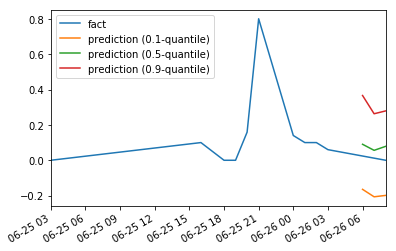

Facts:
2018-06-25 03:00:00        0
2018-06-25 04:00:00      NaN
2018-06-25 05:00:00      NaN
2018-06-25 06:00:00      NaN
2018-06-25 07:00:00      NaN
2018-06-25 08:00:00      NaN
2018-06-25 09:00:00      NaN
2018-06-25 10:00:00      NaN
2018-06-25 11:00:00      NaN
2018-06-25 12:00:00      NaN
2018-06-25 13:00:00      NaN
2018-06-25 14:00:00      NaN
2018-06-25 15:00:00      NaN
2018-06-25 16:00:00      0.1
2018-06-25 17:00:00      NaN
2018-06-25 18:00:00        0
2018-06-25 19:00:00        0
2018-06-25 20:00:00    0.159
2018-06-25 21:00:00      0.8
2018-06-25 22:00:00      NaN
2018-06-25 23:00:00      NaN
2018-06-26 00:00:00     0.14
2018-06-26 01:00:00      0.1
2018-06-26 02:00:00      0.1
2018-06-26 03:00:00     0.06
2018-06-26 04:00:00      NaN
2018-06-26 05:00:00      NaN
Freq: H, dtype: object


Predictions:
[                          0.1       0.9       0.5
2018-06-26 06:00:00 -0.164366  0.366190  0.090358
2018-06-26 07:00:00 -0.206562  0.262946  0.056097
2018-06-26 08:00:00 -

In [90]:
p,s = predict(all_data[3],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


Series 2018-08-10 14:00:00    0.05
2018-08-10 15:00:00    0.24
2018-08-10 16:00:00       0
2018-08-10 17:00:00     NaN
Freq: H, dtype: object


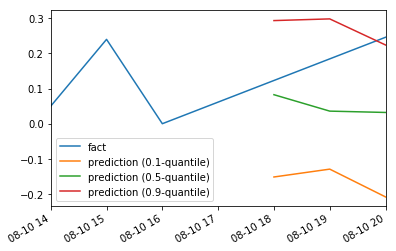

Facts:
2018-08-10 14:00:00    0.05
2018-08-10 15:00:00    0.24
2018-08-10 16:00:00       0
2018-08-10 17:00:00     NaN
Freq: H, dtype: object


Predictions:
[                          0.1       0.9       0.5
2018-08-10 18:00:00 -0.151613  0.293462  0.082554
2018-08-10 19:00:00 -0.129259  0.298280  0.035805
2018-08-10 20:00:00 -0.208365  0.224018  0.032012]


In [91]:
p,s = predict(all_data[23],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


Series 2019-03-12 16:00:00   -0.025
2019-03-12 17:00:00      NaN
2019-03-12 18:00:00        0
2019-03-12 19:00:00      NaN
2019-03-12 20:00:00      NaN
2019-03-12 21:00:00     -0.2
2019-03-12 22:00:00        0
2019-03-12 23:00:00      NaN
2019-03-13 00:00:00      NaN
2019-03-13 01:00:00      NaN
2019-03-13 02:00:00        0
2019-03-13 03:00:00      0.1
2019-03-13 04:00:00      NaN
2019-03-13 05:00:00      NaN
2019-03-13 06:00:00      NaN
2019-03-13 07:00:00      NaN
2019-03-13 08:00:00      NaN
2019-03-13 09:00:00      NaN
2019-03-13 10:00:00      NaN
2019-03-13 11:00:00      0.8
2019-03-13 12:00:00      NaN
2019-03-13 13:00:00      0.4
2019-03-13 14:00:00      NaN
2019-03-13 15:00:00     0.24
2019-03-13 16:00:00   -0.078
2019-03-13 17:00:00     -0.2
2019-03-13 18:00:00    -0.28
2019-03-13 19:00:00   -0.009
2019-03-13 20:00:00      NaN
Freq: H, dtype: object


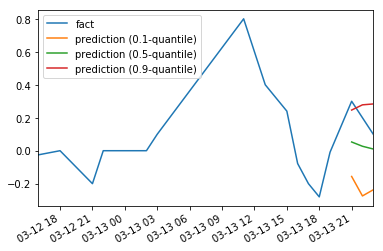

Facts:
2019-03-12 16:00:00   -0.025
2019-03-12 17:00:00      NaN
2019-03-12 18:00:00        0
2019-03-12 19:00:00      NaN
2019-03-12 20:00:00      NaN
2019-03-12 21:00:00     -0.2
2019-03-12 22:00:00        0
2019-03-12 23:00:00      NaN
2019-03-13 00:00:00      NaN
2019-03-13 01:00:00      NaN
2019-03-13 02:00:00        0
2019-03-13 03:00:00      0.1
2019-03-13 04:00:00      NaN
2019-03-13 05:00:00      NaN
2019-03-13 06:00:00      NaN
2019-03-13 07:00:00      NaN
2019-03-13 08:00:00      NaN
2019-03-13 09:00:00      NaN
2019-03-13 10:00:00      NaN
2019-03-13 11:00:00      0.8
2019-03-13 12:00:00      NaN
2019-03-13 13:00:00      0.4
2019-03-13 14:00:00      NaN
2019-03-13 15:00:00     0.24
2019-03-13 16:00:00   -0.078
2019-03-13 17:00:00     -0.2
2019-03-13 18:00:00    -0.28
2019-03-13 19:00:00   -0.009
2019-03-13 20:00:00      NaN
Freq: H, dtype: object


Predictions:
[                          0.1       0.9       0.5
2019-03-13 21:00:00 -0.156231  0.246643  0.052870
2019-03-13 22

In [92]:
p,s = predict(all_data[790],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


Series 2019-03-12 17:00:00      0
2019-03-12 18:00:00    NaN
2019-03-12 19:00:00    NaN
2019-03-12 20:00:00    NaN
2019-03-12 21:00:00    NaN
2019-03-12 22:00:00    NaN
2019-03-12 23:00:00    NaN
2019-03-13 00:00:00    NaN
2019-03-13 01:00:00    NaN
2019-03-13 02:00:00    NaN
2019-03-13 03:00:00    NaN
2019-03-13 04:00:00    NaN
2019-03-13 05:00:00    NaN
2019-03-13 06:00:00    NaN
2019-03-13 07:00:00    NaN
2019-03-13 08:00:00    NaN
2019-03-13 09:00:00    NaN
Freq: H, dtype: object


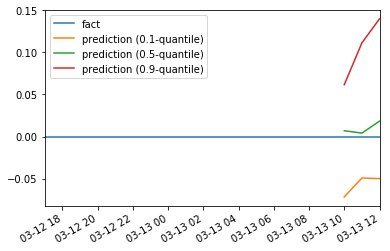

Facts:
2019-03-12 17:00:00      0
2019-03-12 18:00:00    NaN
2019-03-12 19:00:00    NaN
2019-03-12 20:00:00    NaN
2019-03-12 21:00:00    NaN
2019-03-12 22:00:00    NaN
2019-03-12 23:00:00    NaN
2019-03-13 00:00:00    NaN
2019-03-13 01:00:00    NaN
2019-03-13 02:00:00    NaN
2019-03-13 03:00:00    NaN
2019-03-13 04:00:00    NaN
2019-03-13 05:00:00    NaN
2019-03-13 06:00:00    NaN
2019-03-13 07:00:00    NaN
2019-03-13 08:00:00    NaN
2019-03-13 09:00:00    NaN
Freq: H, dtype: object


Predictions:
[                          0.1       0.9       0.5
2019-03-13 10:00:00 -0.071687  0.061640  0.006953
2019-03-13 11:00:00 -0.049296  0.111271  0.004085
2019-03-13 12:00:00 -0.050016  0.139936  0.018302]


In [93]:
p,s = predict(all_data[2300],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

## Make Prediction for Individual Team

In [97]:
team_cat_dict['team_cat']['Nekki']

14

In [111]:
## get data for Nekki team
cond = [14 in row['cat'] for index, row in df_merged_new.iterrows()]
Nekki = df_merged_new[cond]

In [124]:
## ocnvert data into json format
nekki_dict = Nekki.to_dict(orient='records')
nekki_dict[1]

{'start': '2018-06-19 17:00:00',
 'target': [0.338, 'NaN', 'NaN', -0.15],
 'cat': [14]}

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


Series 2018-11-04 10:00:00    0.9
2018-11-04 11:00:00    NaN
2018-11-04 12:00:00    NaN
2018-11-04 13:00:00    NaN
2018-11-04 14:00:00    NaN
Freq: H, dtype: object


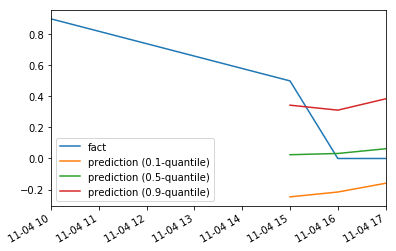

Facts:
2018-11-04 10:00:00    0.9
2018-11-04 11:00:00    NaN
2018-11-04 12:00:00    NaN
2018-11-04 13:00:00    NaN
2018-11-04 14:00:00    NaN
Freq: H, dtype: object


Predictions:
[                          0.1       0.9       0.5
2018-11-04 15:00:00 -0.247282  0.343607  0.024284
2018-11-04 16:00:00 -0.216081  0.311529  0.032325
2018-11-04 17:00:00 -0.159677  0.384414  0.062706]


In [126]:
# check result
p,s = predict(nekki_dict[56],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:9: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:29: FutureWarning: Addition/subtraction of integers and integer-arrays to Timestamp is deprecated, will be removed in a future version.  Instead of adding/subtracting `n`, use `n * self.freq`
/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/ipykernel/__main__.py:44: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.


Series 2018-09-30 23:00:00    0.05
2018-10-01 00:00:00     NaN
2018-10-01 01:00:00     NaN
2018-10-01 02:00:00     NaN
2018-10-01 03:00:00     NaN
2018-10-01 04:00:00     NaN
2018-10-01 05:00:00     NaN
2018-10-01 06:00:00     NaN
2018-10-01 07:00:00     0.1
2018-10-01 08:00:00     NaN
2018-10-01 09:00:00     NaN
2018-10-01 10:00:00     NaN
2018-10-01 11:00:00     NaN
2018-10-01 12:00:00     NaN
2018-10-01 13:00:00     0.8
2018-10-01 14:00:00     0.9
2018-10-01 15:00:00     0.1
2018-10-01 16:00:00       0
2018-10-01 17:00:00       0
2018-10-01 18:00:00     NaN
2018-10-01 19:00:00     NaN
2018-10-01 20:00:00       0
2018-10-01 21:00:00     NaN
2018-10-01 22:00:00     NaN
2018-10-01 23:00:00     NaN
2018-10-02 00:00:00     NaN
2018-10-02 01:00:00     NaN
2018-10-02 02:00:00     NaN
2018-10-02 03:00:00     NaN
2018-10-02 04:00:00     NaN
2018-10-02 05:00:00     NaN
2018-10-02 06:00:00     0.6
2018-10-02 07:00:00     NaN
Freq: H, dtype: object


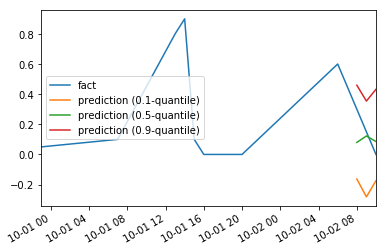

Facts:
2018-09-30 23:00:00    0.05
2018-10-01 00:00:00     NaN
2018-10-01 01:00:00     NaN
2018-10-01 02:00:00     NaN
2018-10-01 03:00:00     NaN
2018-10-01 04:00:00     NaN
2018-10-01 05:00:00     NaN
2018-10-01 06:00:00     NaN
2018-10-01 07:00:00     0.1
2018-10-01 08:00:00     NaN
2018-10-01 09:00:00     NaN
2018-10-01 10:00:00     NaN
2018-10-01 11:00:00     NaN
2018-10-01 12:00:00     NaN
2018-10-01 13:00:00     0.8
2018-10-01 14:00:00     0.9
2018-10-01 15:00:00     0.1
2018-10-01 16:00:00       0
2018-10-01 17:00:00       0
2018-10-01 18:00:00     NaN
2018-10-01 19:00:00     NaN
2018-10-01 20:00:00       0
2018-10-01 21:00:00     NaN
2018-10-01 22:00:00     NaN
2018-10-01 23:00:00     NaN
2018-10-02 00:00:00     NaN
2018-10-02 01:00:00     NaN
2018-10-02 02:00:00     NaN
2018-10-02 03:00:00     NaN
2018-10-02 04:00:00     NaN
2018-10-02 05:00:00     NaN
2018-10-02 06:00:00     0.6
2018-10-02 07:00:00     NaN
Freq: H, dtype: object


Predictions:
[                          0.1 

In [129]:
p,s = predict(nekki_dict[40],predictor,plot=True,return_samples = True)
print('Facts:')
print(s)
print('\n')
print('Predictions:')
print(p)

We can see that model still perform well for individual team

## Delete Endpoint

In [ ]:
predictor.delete_endpoint()